In [170]:
# предварительно в консоли прописал brew install gdal
# pip install geopandas rasterio geopy 

import glob
import zipfile
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import netCDF4 as nc
from osgeo import ogr, osr, gdal
from geopy.distance import geodesic
import pyproj
import rasterio
import geopandas as gpd
import cartopy.crs as ccrs
from rasterio.mask import mask
from rasterio.plot import show 
from geopy.distance import geodesic
from shapely.geometry import Polygon

In [2]:
from FFP_Python import calc_footprint_FFP as fp
from FFP_Python import calc_footprint_FFP_climatology as fpc


In [4]:
# строит красивые гистограмки по разрезанному растру
def hist_create(raster_path, vector_path, mask_indices, mask_names, title):

    # Read raster image
    raster = rasterio.open(raster_path)

    # Read vector mask
    vector = gpd.read_file(vector_path)

    plt.figure(figsize=(9, 6))
    plt.rcParams.update({'font.size': 15})  
    mean = 0
    for i, name in zip(mask_indices, mask_names):
        # Convert the MultiPolygon to the GeoJSON format
        geojson = vector.geometry[i].__geo_interface__

        # Perform the crop operation
        cropped_image, _ = mask(dataset=raster, shapes=[geojson], crop=True)

        cropped_image[0][cropped_image[1] == 0] = np.nan

        sns.kdeplot(cropped_image[0].flatten(), fill=True, label=name)
        
        print(title ,name, np.nanmean(cropped_image[0]))
        mean += np.nanmean(cropped_image[0])
    
    mean //= len(mask_indices)
    plt.xlim([mean-9,mean+11])
    plt.legend()
    plt.xlabel('Surface temperature, С')
    plt.title(title)
    plt.savefig(raster_path[:-4]+'_hist.png', dpi=100)
    plt.close()

In [9]:
vector_path = '/Users/ilyadrozd/IAP/Muhkrino/mask.geojson'
mask_names = ['Waterlogged hollows', 'Ridges and ryam', 'Hollows']
mask_indices = [2,0,1]


date_length = 15
date_format = '%Y%m%d_%H%M%S'

# Поиск всех файлов, соответствующих шаблону
file_pattern = '/Users/ilyadrozd/IAP/Muhkrino/IR TIFS/corrected/*.tif'
file_list = glob.glob(file_pattern)
file_list = sorted(file_list)


for raster_path in file_list:

    date_index = raster_path.rfind('/')+1
    date_string = raster_path[date_index:date_index+date_length]
    title = datetime.strptime(date_string, date_format).strftime("%H:%M:%S %d %B %Y")

    hist_create(raster_path, vector_path, mask_indices, mask_names, title)

21:41:53 15 June 2022 Waterlogged hollows 15.944148
21:41:53 15 June 2022 Ridges and ryam 14.448004
21:41:53 15 June 2022 Hollows 14.998668
22:23:38 16 June 2022 Waterlogged hollows 15.920183
22:23:38 16 June 2022 Ridges and ryam 11.523571
22:23:38 16 June 2022 Hollows 13.116513
23:22:34 16 June 2022 Waterlogged hollows 15.093651
23:22:34 16 June 2022 Ridges and ryam 10.3696375
23:22:34 16 June 2022 Hollows 12.211363
07:00:13 17 June 2022 Waterlogged hollows 12.055583
07:00:13 17 June 2022 Ridges and ryam 12.985889
07:00:13 17 June 2022 Hollows 13.154678
11:15:10 17 June 2022 Waterlogged hollows 25.575611
11:15:10 17 June 2022 Ridges and ryam 26.875614
11:15:10 17 June 2022 Hollows 27.018576
13:30:10 17 June 2022 Waterlogged hollows 28.344563
13:30:10 17 June 2022 Ridges and ryam 29.088255
13:30:10 17 June 2022 Hollows 29.229088
17:35:18 17 June 2022 Waterlogged hollows 25.731564
17:35:18 17 June 2022 Ridges and ryam 24.746178
17:35:18 17 June 2022 Hollows 25.01235
11:32:02 18 June 202

In [ ]:
path = '/Users/ilyadrozd/IAP/Muhkrino/ИК_Мухрино/220622000000.dat'
df = pd.read_csv(path, usecols=[0,4], sep=' ', header=None)

In [161]:
# path = '/Users/ilyadrozd/IAP/Muhkrino/ИК_Мухрино/220621000000.dat'
# Поиск всех файлов, соответствующих шаблону
file_pattern = '/Users/ilyadrozd/IAP/Muhkrino/ИК_Мухрино/*.dat'
file_list = glob.glob(file_pattern)
file_list = sorted(file_list)

total = pd.DataFrame()

for path in file_list:
    df = pd.read_csv(path, usecols=[0,4], sep=' ', header=None, names=['date', 'temp'])
    df['date'] = pd.to_datetime(df.date, format='%y%m%d%H%M%S')
    df.replace('TIMEOUT', np.nan, inplace=True)
    df['temp'] = df.temp.astype(float)
    total = pd.concat([total,df])
total

,date,temp
0,2022-06-13 08:44:11,14.4
1,2022-06-13 08:44:12,14.4
2,2022-06-13 08:44:13,NaN
3,2022-06-13 08:44:13,14.5
4,2022-06-13 08:44:14,14.5
...,...,...
20399,2022-06-22 05:22:56,25.1
20400,2022-06-22 05:22:57,25.2
20401,2022-06-22 05:22:58,25.3
20402,2022-06-22 05:22:59,25.3


In [ ]:
# строит красивые гистограмки по разрезанному растру
def hist_create(raster_path, vector_path, mask_indices, mask_names, title):

    # Read raster image
    raster = rasterio.open(raster_path)

    # Read vector mask
    vector = gpd.read_file(vector_path)

    plt.figure(figsize=(9, 6))
    plt.rcParams.update({'font.size': 15})  
    mean = 0
    for i, name in zip(mask_indices, mask_names):
        # Convert the MultiPolygon to the GeoJSON format
        geojson = vector.geometry[i].__geo_interface__

        # Perform the crop operation
        cropped_image, _ = mask(dataset=raster, shapes=[geojson], crop=True)

        cropped_image[0][cropped_image[1] == 0] = np.nan

        sns.kdeplot(cropped_image[0].flatten(), fill=True, label=name)
        
        print(title ,name, np.nanmean(cropped_image[0]))
        mean += np.nanmean(cropped_image[0])

In [166]:
def meanT_create(raster_path, vector_path, mask_indices, mask_names, title):
    list=[[],[],[]]
    # Read raster image
    raster = rasterio.open(raster_path)

    # Read vector mask
    vector = gpd.read_file(vector_path)

    plt.figure(figsize=(9, 6))
    plt.rcParams.update({'font.size': 15})  
    mean = 0
    for i, name in zip(mask_indices, mask_names):
        # Convert the MultiPolygon to the GeoJSON format
        geojson = vector.geometry[i].__geo_interface__

        # Perform the crop operation
        cropped_image, _ = mask(dataset=raster, shapes=[geojson], crop=True)

        cropped_image[0][cropped_image[1] == 0] = np.nan

        list[i].append(np.nanmean(cropped_image[0]))
    return list

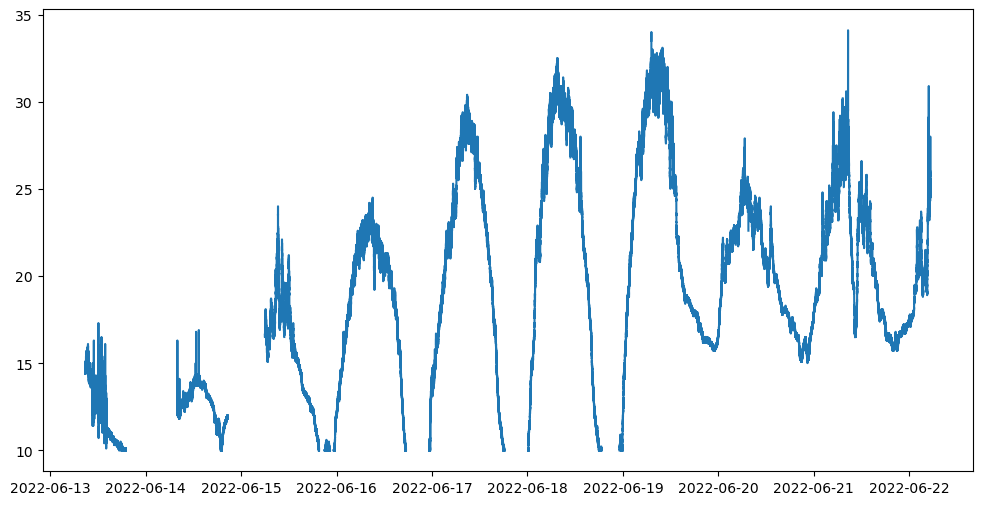

In [165]:
# path = '/Users/ilyadrozd/IAP/Muhkrino/ИК_Мухрино/220621000000.dat'
# df = pd.read_csv(path, usecols=[0,4], sep=' ', header=None, names=['date', 'temp'])
# df['date'] = pd.to_datetime(df.date, format='%y%m%d%H%M%S')
# df.replace('TIMEOUT', np.nan, inplace=True)
# df['temp'] = df.temp.astype(float)
plt.figure(figsize=(12,6))
plt.plot(total.date, total.temp)

In [171]:
def plot_temp_diff(raster_path):
    raster = rasterio.open(raster_path)
    data = raster.read()
    data[0][data[1]==0]=np.nan
    data[0][data[0]<=1]=np.nan
    
    lon = np.linspace(raster.bounds[0], raster.bounds[2], raster.width)
    lat = np.linspace(raster.bounds[3], raster.bounds[1], raster.height)
    
    date_length = 15
    date_format = '%Y%m%d_%H%M%S'
    date_index = raster_path.rfind('/')+1
    date_string = raster_path[date_index:date_index+date_length]
    title = datetime.strptime(date_string, date_format).strftime("%H:%M:%S %d %B %Y")
    
    # Отображение георастера
    plt.rcParams.update({'font.size': 15})
    projection = ccrs.Mercator()
    fig = plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=projection)
    ax.gridlines(draw_labels=["top", "left"], x_inline=False, y_inline=False)
    # ax.set_extent([raster.bounds[0], raster.bounds[2], raster.bounds[1], raster.bounds[3]])
    plt.title(title)
    temp = plt.contourf(lon, lat, data[0]-np.nanmean(data[0]), levels=np.arange(-8, 9, 1), cmap='inferno', transform=ccrs.PlateCarree())
    plt.colorbar(temp, location = 'bottom', pad=0.01, label='Deviation from average surface temperature, C')
    plt.savefig(raster_path[:-4]+'_map.png', dpi=100)
    # plt.close()


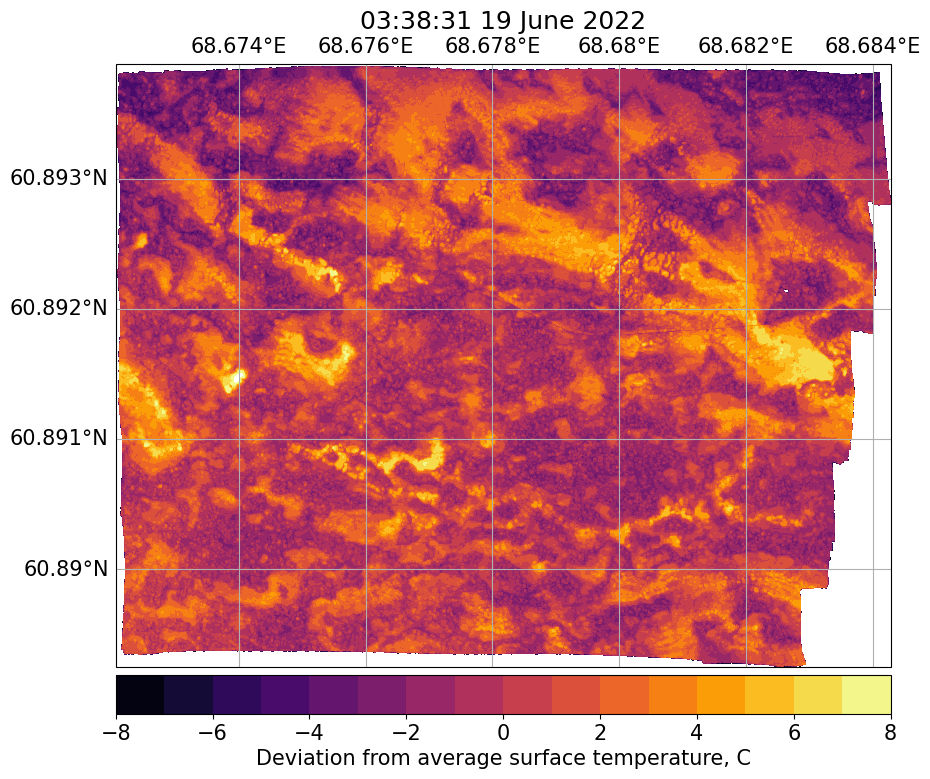

In [167]:
# # Открыть GeoTIFF-файл
# raster_path = '/Users/ilyadrozd/IAP/Muhkrino/IR TIFS/corrected/20220618_233550_het_160m_corr2_modified.tif'
# plot_temp_diff(raster_path)

raster_path = '/Users/ilyadrozd/IAP/Muhkrino/IR TIFS/corrected/20220619_033831_het_160m_corr3lowess_modified.tif'
plot_temp_diff(raster_path)


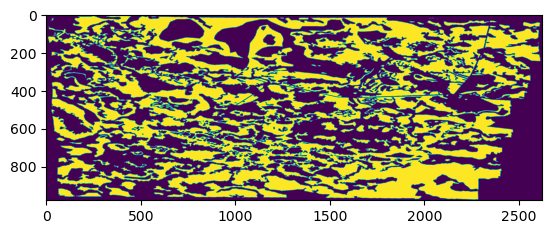

In [141]:
# маска
plt.imshow(cropped_image[1])

## Tif to nc

In [230]:
print(raster.bounds[3], raster.bounds[1])

60.893908121498065 60.88912723556064


In [238]:
lat_dist

[0.0,
 0.5290179059802378,
 1.0580358127951248,
 1.5870537197349746,
 2.116071626445635,
 2.64508953434304,
 3.1741074430737273,
 3.7031253515745464,
 4.2321432602038,
 4.761161168956655,
 5.290179079250427,
 5.8191969896685,
 6.348214900212259,
 6.877232810529624,
 7.406250722385161,
 7.935268633660151,
 8.464286545059464,
 8.993304457293481,
 9.522322370358063,
 10.051340282842116,
 10.580358196510897,
 11.109376109954002,
 11.638394024583224,
 12.167411939690258,
 12.696429854217469,
 13.22544776957596,
 13.754465685767808,
 14.283483601377089,
 14.812501517820422,
 15.34151943403535,
 15.870537351435729,
 16.399555269318093,
 16.92857318696929,
 17.457591105101102,
 17.986609024419764,
 18.51562694351004,
 19.044644863079547,
 19.573662782420683,
 20.102680703302838,
 20.63169862324831,
 21.16071654438065,
 21.689734465640164,
 22.218752387024093,
 22.747770308886597,
 23.27678823122905,
 23.805806154050785,
 24.33482407770525,
 24.863842001486915,
 25.392859925746475,
 25.92187785

In [240]:
lat_dist

[0.0,
 0.5290179059802378,
 1.0580358127951248,
 1.5870537197349746,
 2.116071626445635,
 2.64508953434304,
 3.1741074430737273,
 3.7031253515745464,
 4.2321432602038,
 4.761161168956655,
 5.290179079250427,
 5.8191969896685,
 6.348214900212259,
 6.877232810529624,
 7.406250722385161,
 7.935268633660151,
 8.464286545059464,
 8.993304457293481,
 9.522322370358063,
 10.051340282842116,
 10.580358196510897,
 11.109376109954002,
 11.638394024583224,
 12.167411939690258,
 12.696429854217469,
 13.22544776957596,
 13.754465685767808,
 14.283483601377089,
 14.812501517820422,
 15.34151943403535,
 15.870537351435729,
 16.399555269318093,
 16.92857318696929,
 17.457591105101102,
 17.986609024419764,
 18.51562694351004,
 19.044644863079547,
 19.573662782420683,
 20.102680703302838,
 20.63169862324831,
 21.16071654438065,
 21.689734465640164,
 22.218752387024093,
 22.747770308886597,
 23.27678823122905,
 23.805806154050785,
 24.33482407770525,
 24.863842001486915,
 25.392859925746475,
 25.92187785

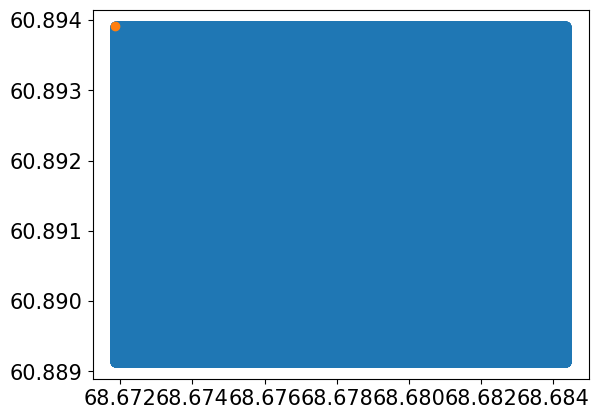

In [246]:
xx, yy = np.meshgrid(lons,lats)
plt.scatter(xx,yy)
plt.scatter(lons[0],lats[0])

In [245]:
date_length = 15
date_format = '%Y%m%d_%H%M%S'
date_index = tif_path.rfind('/')+1

file_pattern = '/Users/ilyadrozd/IAP/Muhkrino/IR TIFS/corrected/*.tif'
file_list = glob.glob(file_pattern)
file_list = sorted(file_list)

for tif_path in file_list:
    nc_path = tif_path[:-4]+'_meters.nc'
    
    with rasterio.open(tif_path) as raster:
        data = raster.read()
        data[0][data[1]==0]=np.nan
        data[0][data[0]<=1]=np.nan
        
        lons = np.linspace(raster.bounds[0], raster.bounds[2], raster.width)
        lats = np.linspace(raster.bounds[3], raster.bounds[1], raster.height)

        # convert coordinates to distance
        lon_dist = []
        lat_dist = []
        
        for lat in lats:
                dist = geodesic((lats[0], lons[0]), (lat, lons[0])).meters
                lat_dist.append(dist)
        
        for lon in lons:
                dist = geodesic((lats[0], lons[0]), (lats[0], lon)).meters
                lon_dist.append(dist)
                    
    
    # Создание NC-файла и запись данных
    with nc.Dataset(nc_path, 'w', format='NETCDF4') as dataset:
        # Создание размерностей
        dataset.createDimension('lon', data[0].shape[1])
        dataset.createDimension('lat', data[0].shape[0])
        dataset.createDimension('time', 1)
    
        # Создание переменных
        lon_variable = dataset.createVariable('lon', 'f4', ('lon',))
        lat_variable = dataset.createVariable('lat', 'f4', ('lat',))
        time_variable = dataset.createVariable('time', 'f4', ('time',))
        data_variable = dataset.createVariable('data', 'f4', ('time', 'lat', 'lon'))
    
        # Запись данных
        lon_variable[:] = lon_dist # lons
        lat_variable[:] = lat_dist # lats
        date_string = tif_path[date_index:date_index+date_length]
        dt = datetime.strptime(date_string, date_format)
        time_variable[:] = dt.timestamp() # Устанавливаем отметку времени
        
        data_variable[0, :, :] = data[0]
        

In [244]:
rm -rf *_meters.nc

In [224]:
nc_path

'/Users/ilyadrozd/IAP/Muhkrino/IR TIFS/corrected/20220621_103113_het_160m_corr3lowess_modified_meters.nc'

In [247]:
ds = nc.Dataset(nc_path)
ds['lat'][::]

masked_array(data=[0.0000000e+00, 5.2901828e-01, 1.0580366e+00, ...,
                   5.3166321e+02, 5.3219220e+02, 5.3272125e+02],
             mask=False,
       fill_value=1e+20,
            dtype=float32)

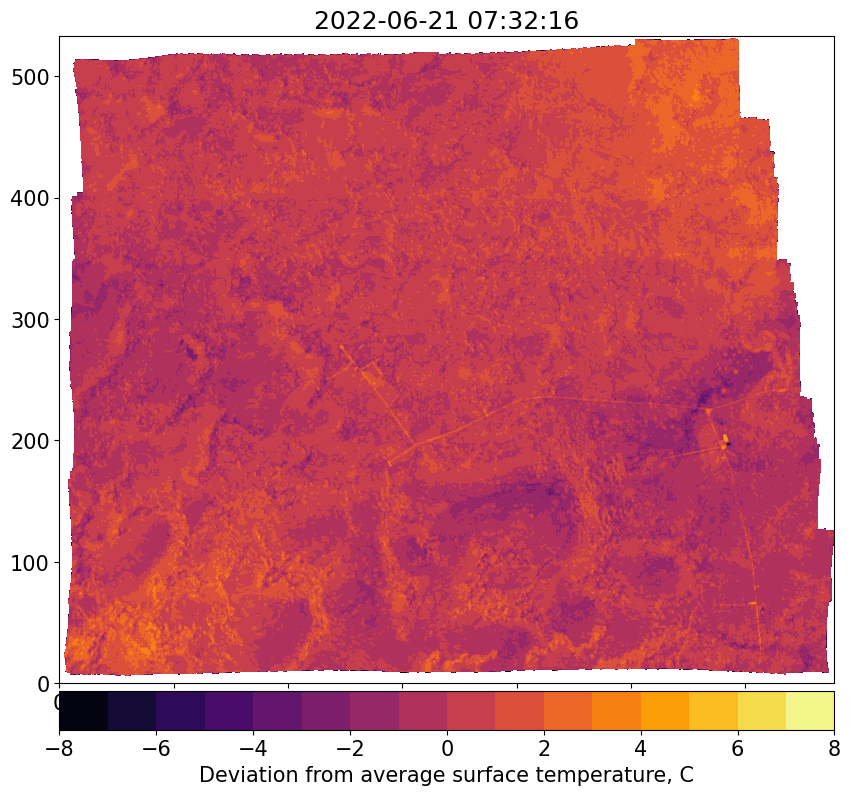

In [248]:
ds = nc.Dataset(nc_path)
lon = ds['lon'][::]
lat = ds['lat'][::]
time = pd.to_datetime(ds['time'][::], unit='s')
data =  ds['data'][0,::,::]

fig = plt.figure(figsize=(10, 10))
ax = plt.axes()
plt.title(time[0])
temp = plt.contourf(lon, lat, data-np.nanmean(data), levels=np.arange(-8, 9, 1), cmap='inferno')
plt.colorbar(temp, location = 'bottom', pad=0.01, label='Deviation from average surface temperature, C')

ds.close()

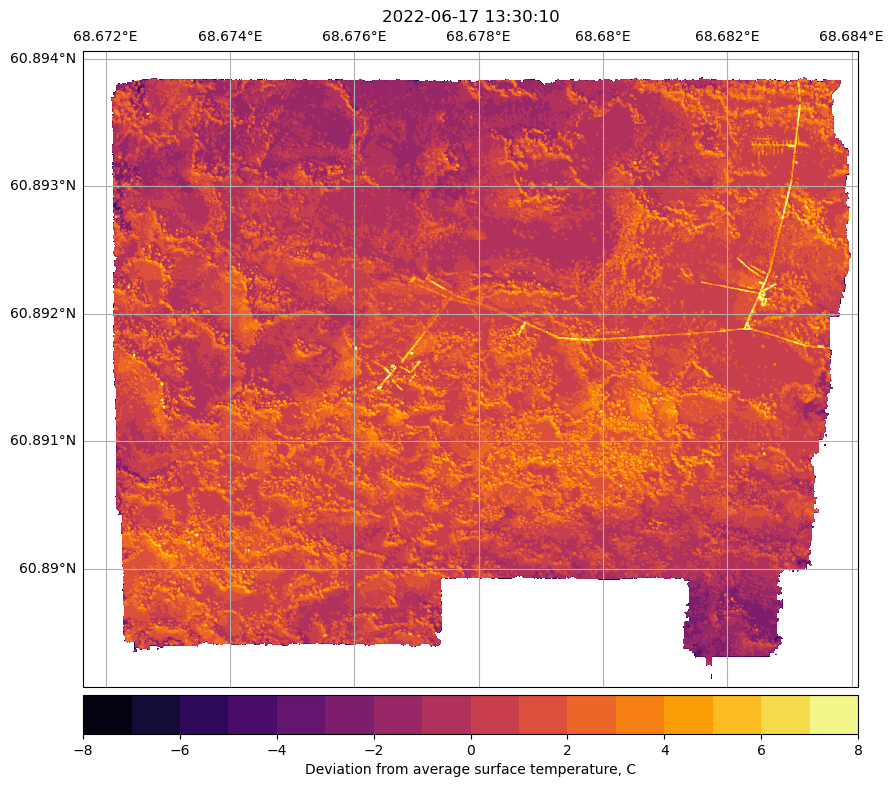

In [103]:
ds = nc.Dataset(nc_path)
lon = ds['lon'][::]
lat = ds['lat'][::]
time = pd.to_datetime(ds['time'][::], unit='s')
data =  ds['data'][0,::,::]

projection = ccrs.Mercator()
fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection=projection)
ax.gridlines(draw_labels=["top", "left"], x_inline=False, y_inline=False)
plt.title(time[0])
temp = plt.contourf(lon, lat, data-np.nanmean(data), levels=np.arange(-8, 9, 1), cmap='inferno', transform=ccrs.PlateCarree())
plt.colorbar(temp, location = 'bottom', pad=0.01, label='Deviation from average surface temperature, C')

ds.close()

In [106]:
np.nanmin(dsdata-np.nanmean(dsdata))

-28.054438

In [12]:
import pygrib

Affine(4.518679724523699e-06, 0.0, 68.67163676920488,
       0.0, -4.518679724523699e-06, 60.894059576401624)

## Футпринты

In [4]:
# Поиск всех файлов, соответствующих шаблону
# file_pattern = '/Users/ilyadrozd/IAP/Muhkrino/EC/ryam/*.zip'
# file_list = glob.glob(file_pattern)
# file_list = sorted(file_list)
# for file_name in file_list:
#     with zipfile.ZipFile(file_name, 'r') as myzip:
#         # Извлекаем все файлы из архива в текущую директорию
#         myzip.extractall(file_name[:-4])

In [7]:
# позволяет получить координату новой точки, лежащей в скольких-то метрах от стартовой 
def new_point(lat, lon, delta_lat, delta_lon, xy=False):
    # (lat, lon) - Координаты точки (широта, долгота) в градусах
    # (delta_lat, delta_lon) - Cмещение точки по (широте, долготе) в метрах

    # Рассчитываем координаты точки смещения по широте
    new_lat = lat + (delta_lat / geodesic((lat, lon), (lat + 1, lon)).meters)

    # Рассчитываем координаты точки смещения по долготе
    new_lon = lon + (delta_lon / geodesic((lat, lon), (lat, lon + 1)).meters)
    
    if xy:
        return (new_lon, new_lat)
    else:
        return (new_lat, new_lon)
    
    
def create_df(file_pattern, drop=-1, header=0):
    
    file_list = glob.glob(file_pattern)
    file_list = sorted(file_list)

    combined_df = pd.DataFrame()
    for file_name in file_list:
        df = pd.read_csv(file_name, sep=',', header=header)
        if drop >= 0: df.drop(drop, inplace=True)
        combined_df = pd.concat([combined_df, df], ignore_index=True)

    return combined_df


def calculate_coriolis_parameter(latitude):
    omega = 7.2921e-5 # угловая скорость вращения Земли  рад/сек
    f = 2 * omega * np.sin(np.radians(latitude))
    return f


def select_variables(df):
    datetime = pd.to_datetime(df['date'] + ' ' + df['time'])

    df = df[['wind_speed', 'wind_dir','(z-d)/L', 
         'L', 'u*', 'u_var', 'v_var']].astype(float)

    # df.index = datetime
    df['datetime'] = datetime

    df['z-d'] = df['(z-d)/L'] * df['L']

    f = calculate_coriolis_parameter(60.89142435)
    df['h'] = (-1 + (1 + 2.28 * df['u*'] / (df['L'] * f)) ** (1/2)) * df['L'] / 3.8
    df.loc[df['(z-d)/L']<0,'h'] = 1000
    df['sigmav'] = (df['u_var']+df['v_var'])**(1/2)
    
    df.dropna(inplace=True)
    return df

In [136]:
# если нужно открыть файлы с данными в другом формате (сами данные одинаковые)

# file_pattern = '/Users/ilyadrozd/IAP/Muhkrino/EC/gryada/*/output/eddypro_exp_fluxnet_*_exp.csv'
# fluxnet = create_df(file_pattern)
# print(*fluxnet.columns, sep='\n')


In [8]:
df = pd.read_excel('/Users/ilyadrozd/IAP/Muhkrino/GHG_flux_Мухрино_потоки_и_графики_9_6_2023_АЛ.xlsx', usecols=[1,2,3,6,8,10], 
                   skiprows=[1], names=['type', 'lat', 'lon', 'date', 'time', 'temp'])

df['datetime'] = pd.to_datetime(df.date.astype('str')+' '+df.time.astype('str')).dt.round('30min')

# df.loc[(df['type'] == 'М1')|(df['type'] == 'М2')]

df.sort_values('datetime', inplace=True)

df

,type,lat,lon,date,time,temp,datetime
0,М1,"60°53’30,5’’","68°40’36,8’’",2022-06-13,12:12:15,9.180645,2022-06-13 12:00:00
1,М2,"60°53’30,5’’","68°40’36,8’’",2022-06-13,12:14:27,9.163333,2022-06-13 12:00:00
49,Г2,"60°53’29,7’’","68°40’35,6’’",2022-06-13,14:01:00,8.415254,2022-06-13 14:00:00
48,Г1,"60°53’29,6’’","68°40’35,8’’",2022-06-13,14:01:48,8.411475,2022-06-13 14:00:00
94,Т2,60°53’36’’,68°40’59’’,2022-06-13,17:05:21,8.340659,2022-06-13 17:00:00
...,...,...,...,...,...,...,...
92,Г2,"60°53’29,7’’","68°40’35,6’’",2022-06-22,11:01:20,21.750000,2022-06-22 11:00:00
178,Т1,60°53’36’’,68°40’59’’,2022-06-22,14:01:00,20.800000,2022-06-22 14:00:00
47,M2,"60°53’30,5’’","68°40’36,8’’",2022-06-22,14:00:53,20.950000,2022-06-22 14:00:00
46,М1,"60°53’30,6’’",68°40’37’’,2022-06-22,14:00:22,20.950000,2022-06-22 14:00:00


In [9]:
name = 'gryada'
tower_lat = 60.89142435
tower_lon = 68.67640836

# name = 'ryam'
# tower_lat = 60.89606888
# tower_lon = 68.68314311

# name = 'mocha'
# tower_lat = 60.89318384
# tower_lon = 68.68313201

file_pattern = f'/Users/ilyadrozd/IAP/Muhkrino/EC/{name}/*/output/eddypro_exp_full_output_*_exp.csv'


EC = create_df(file_pattern, header=1, drop=0)
# print(*EC.columns, sep='\n')

EC = select_variables(EC)
EC

,wind_speed,wind_dir,(z-d)/L,L,u*,u_var,v_var,datetime,z-d,h,sigmav
0,2.50464,301.367,0.024726,266.8470,0.204424,0.203383,0.120596,2022-06-12 00:30:00,6.598006,199.084855,0.569192
1,2.06151,318.107,0.045134,146.1860,0.179110,0.184134,0.139918,2022-06-12 01:00:00,6.597988,145.717413,0.569256
2,1.83698,349.864,-0.011908,-554.0720,0.218335,0.258406,0.366579,2022-06-12 01:30:00,6.598000,1000.000000,0.790560
3,2.51361,358.381,0.000408,16184.0000,0.285406,0.580955,0.383427,2022-06-12 02:00:00,6.597990,625.954689,0.982030
4,2.94961,359.388,-0.043758,-150.7830,0.257229,0.425406,0.366921,2022-06-12 02:30:00,6.597993,1000.000000,0.890128
...,...,...,...,...,...,...,...,...,...,...,...
333,3.70541,116.654,-0.100163,-65.8726,0.417300,1.129240,1.245470,2022-06-21 08:30:00,6.597997,1000.000000,1.541009
334,3.90456,116.354,-0.076956,-85.7376,0.408465,0.923543,1.138830,2022-06-21 09:00:00,6.597997,1000.000000,1.436096
335,3.08378,109.130,0.001198,5506.0100,0.268940,0.538090,0.398979,2022-06-21 09:30:00,6.598017,534.574322,0.968023
336,3.82347,111.107,0.030575,215.7950,0.387150,1.289940,0.511420,2022-06-21 10:00:00,6.598018,269.937281,1.342148


In [114]:
EC = pd.merge(left=df, right=EC, how='inner',on='datetime')
EC

,type,lat,lon,date,time,temp,datetime,wind_speed,wind_dir,(z-d)/L,L,u*,u_var,v_var,z-d,h,sigmav
0,Г1,"60°53’29,6’’","68°40’35,8’’",2022-06-13,20:10:57,7.766129,2022-06-13 20:00:00,3.56450,3.11808,0.003759,1755.2200,0.323255,0.604529,0.313775,6.597995,495.400169,0.958282
1,Т2,60°53’36’’,68°40’59’’,2022-06-14,08:46:14,10.254839,2022-06-14 09:00:00,2.55536,2.73132,-0.042647,-154.7130,0.293040,0.477565,0.406750,6.597999,1000.000000,0.940380
2,М2,"60°53’30,5’’","68°40’36,8’’",2022-06-14,08:57:49,10.427778,2022-06-14 09:00:00,2.55536,2.73132,-0.042647,-154.7130,0.293040,0.477565,0.406750,6.597999,1000.000000,0.940380
3,М1,"60°53’30,6’’",68°40’37’’,2022-06-14,08:57:01,10.400000,2022-06-14 09:00:00,2.55536,2.73132,-0.042647,-154.7130,0.293040,0.477565,0.406750,6.597999,1000.000000,0.940380
4,Т1,60°53’36’’,68°40’59’’,2022-06-14,08:48:01,10.270000,2022-06-14 09:00:00,2.55536,2.73132,-0.042647,-154.7130,0.293040,0.477565,0.406750,6.597999,1000.000000,0.940380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,Т1,60°53’36’’,68°40’59’’,2022-06-20,17:01:00,17.945161,2022-06-20 17:00:00,2.47025,98.03930,0.049439,133.4570,0.264322,0.408690,0.537189,6.597994,176.882401,0.972563
130,Г1,"60°53’29,6’’","68°40’35,8’’",2022-06-20,17:19:10,17.700000,2022-06-20 17:30:00,3.81636,128.87400,0.016596,397.5640,0.415178,1.046980,0.969342,6.598012,359.575321,1.419973
131,Г2,"60°53’29,7’’","68°40’35,6’’",2022-06-20,17:19:30,17.700000,2022-06-20 17:30:00,3.81636,128.87400,0.016596,397.5640,0.415178,1.046980,0.969342,6.598012,359.575321,1.419973
132,Г1,"60°53’29,6’’","68°40’35,8’’",2022-06-21,08:21:55,23.545902,2022-06-21 08:30:00,3.70541,116.65400,-0.100163,-65.8726,0.417300,1.129240,1.245470,6.597997,1000.000000,1.541009


2 3.5645 3.11808 495.40016854821636 1755.22 0.9582817957156444 0.323255


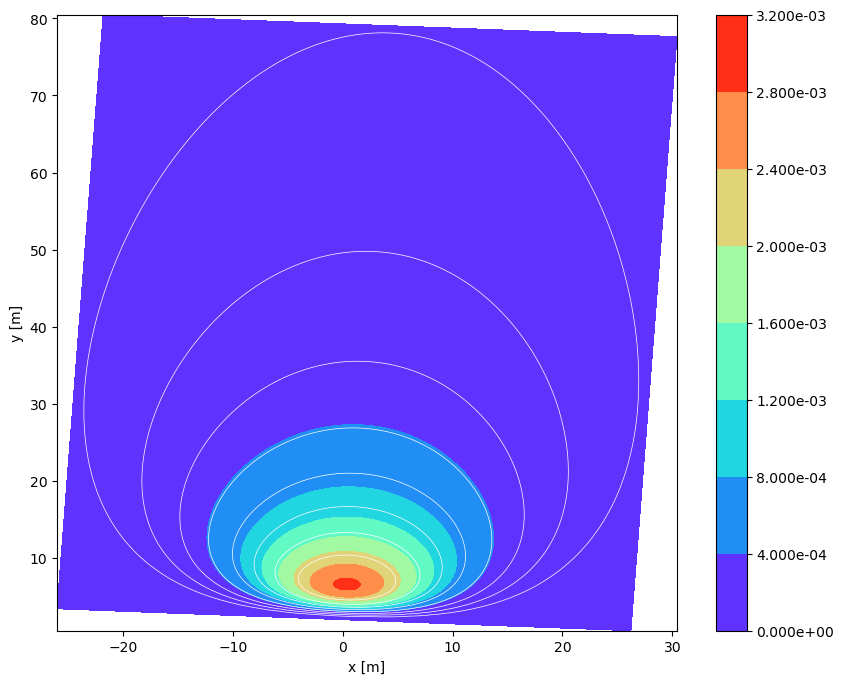

2 2.55536 2.73132 1000.0 -154.713 0.9403802422424665 0.29304


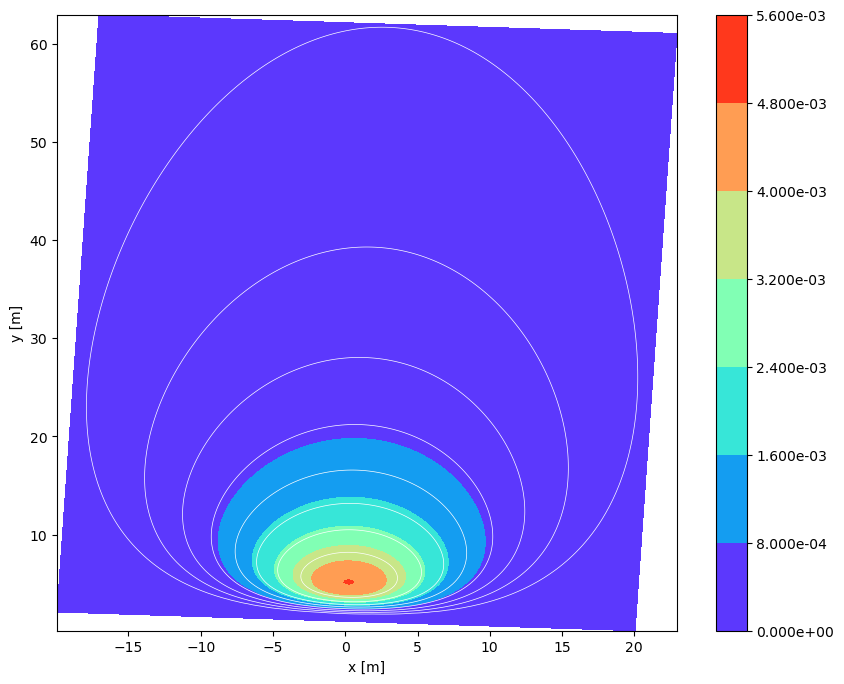

2 2.55536 2.73132 1000.0 -154.713 0.9403802422424665 0.29304


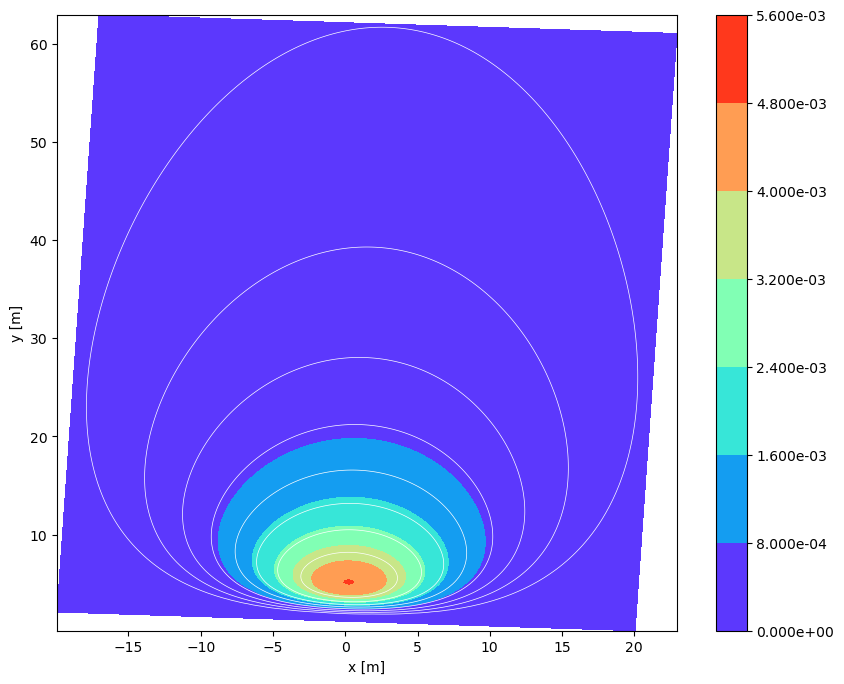

2 2.55536 2.73132 1000.0 -154.713 0.9403802422424665 0.29304


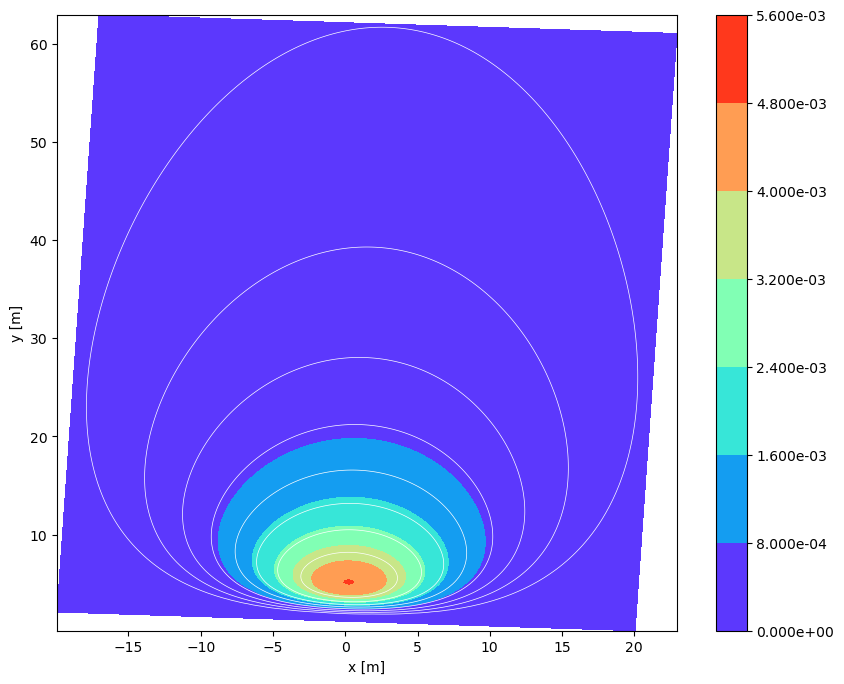

2 2.55536 2.73132 1000.0 -154.713 0.9403802422424665 0.29304


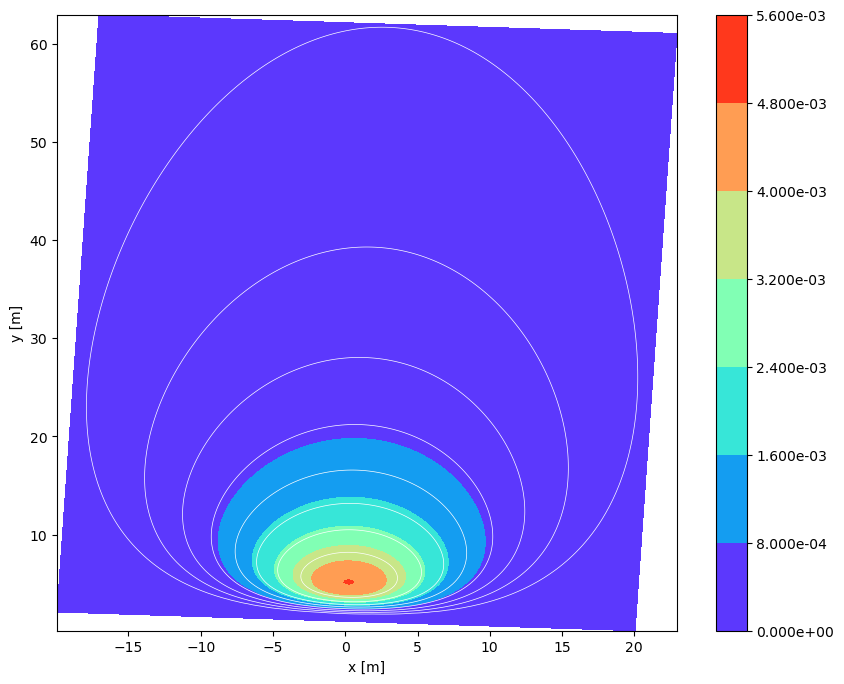

2 2.07771 4.64366 1000.0 -121.68 0.704230076040494 0.239822


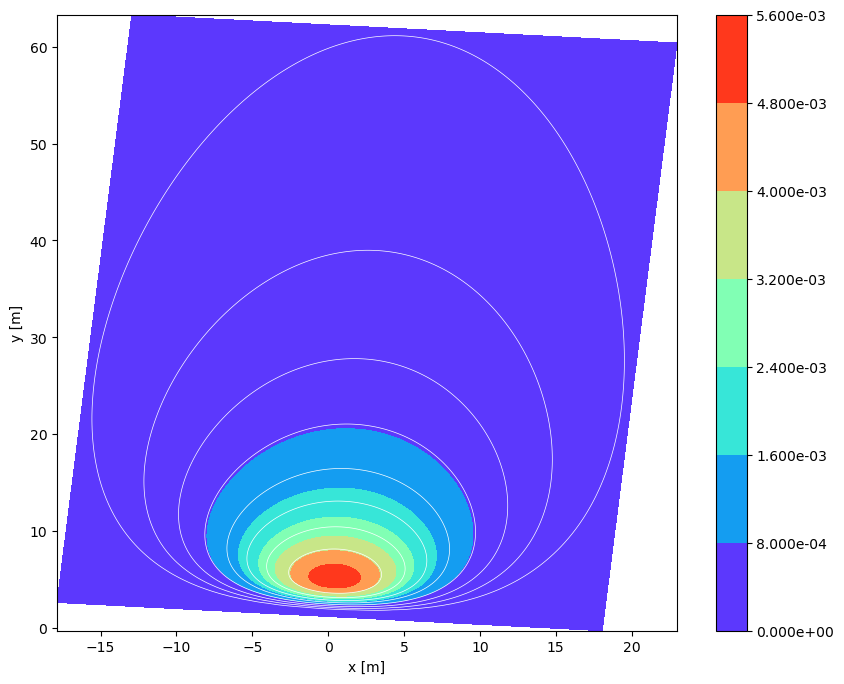

2 2.07771 4.64366 1000.0 -121.68 0.704230076040494 0.239822


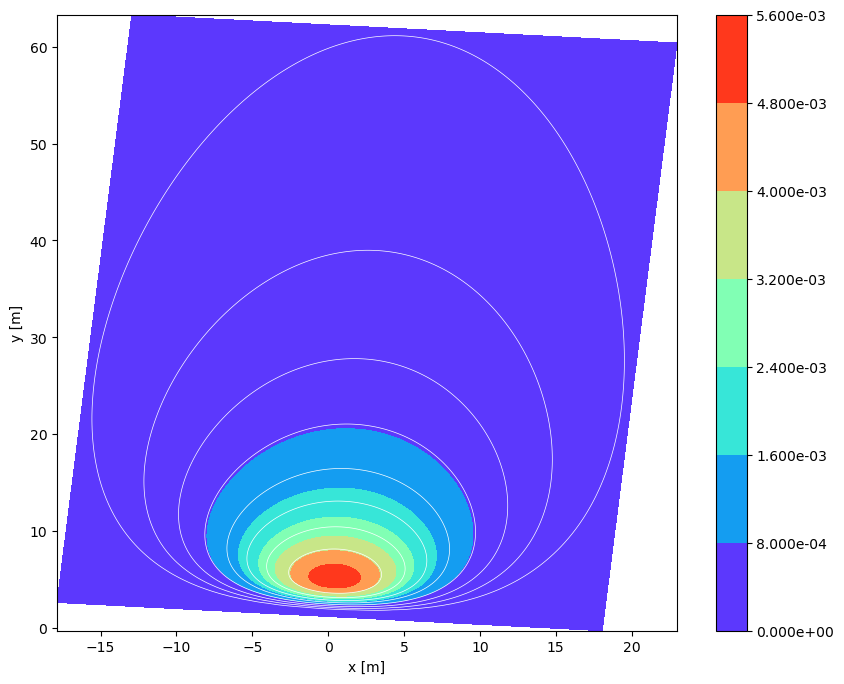

2 2.07771 4.64366 1000.0 -121.68 0.704230076040494 0.239822


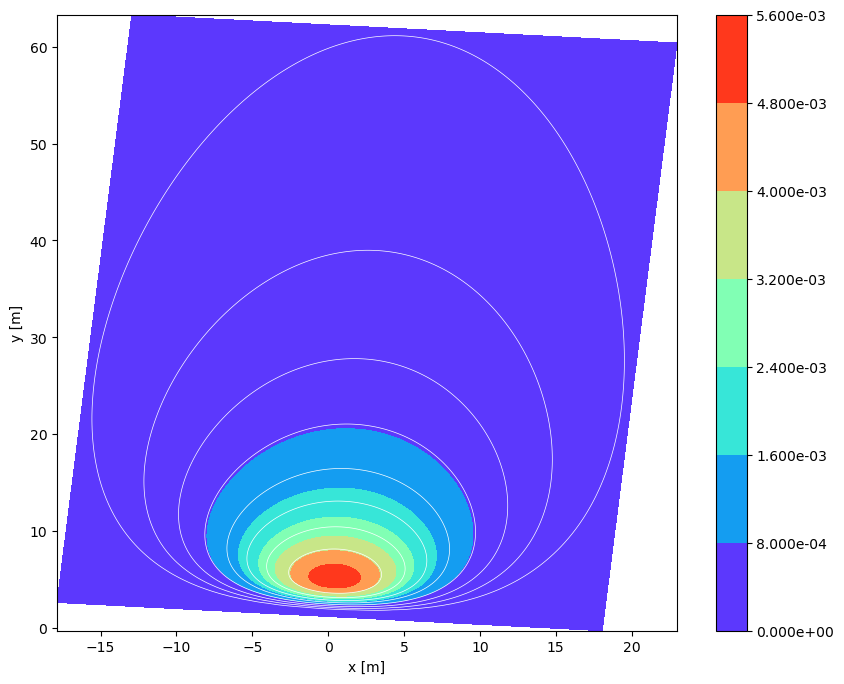

2 2.07771 4.64366 1000.0 -121.68 0.704230076040494 0.239822


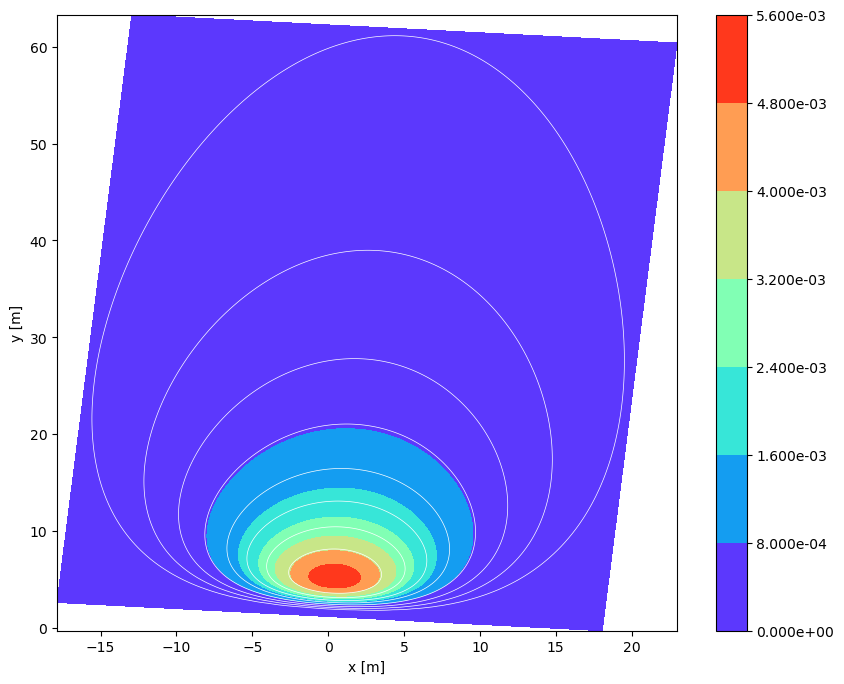

2 1.68172 351.715 1000.0 -1624.75 0.4758568061927874 0.165488


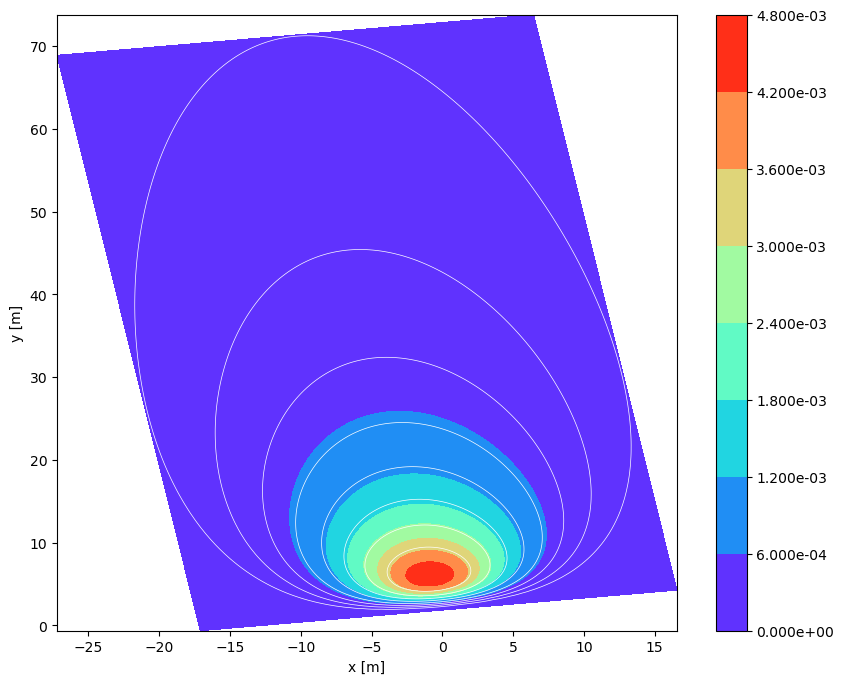

2 1.68172 351.715 1000.0 -1624.75 0.4758568061927874 0.165488


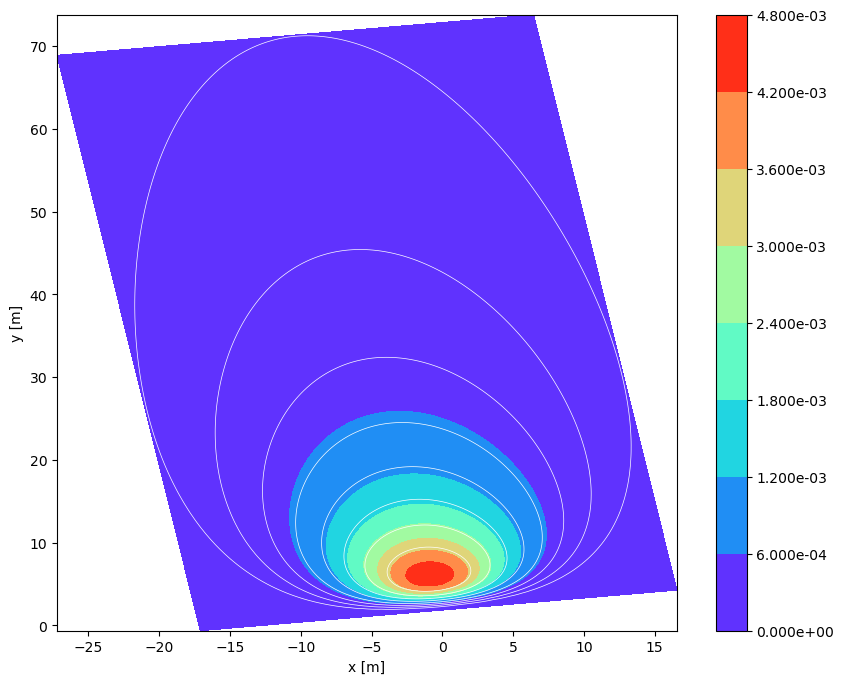

2 1.60613 348.102 162.56785533007664 259.324 0.4964352928630276 0.151293


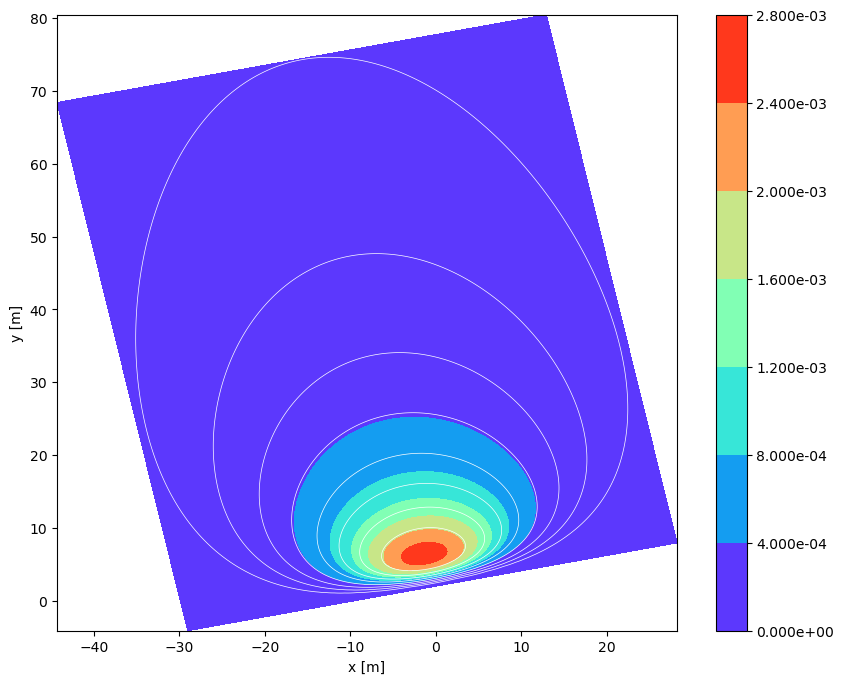

2 1.60613 348.102 162.56785533007664 259.324 0.4964352928630276 0.151293


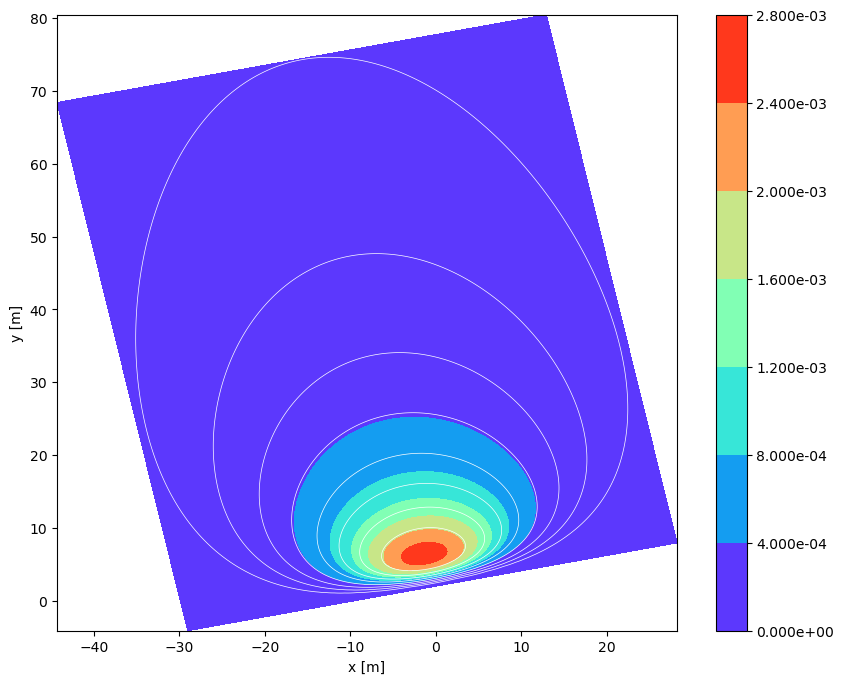

2 1.10048 306.46 23.438079606662214 8.49276 0.28986462357452314 0.0621553

Error(0009):
 ustar (friction velocity) must be >=0.1.


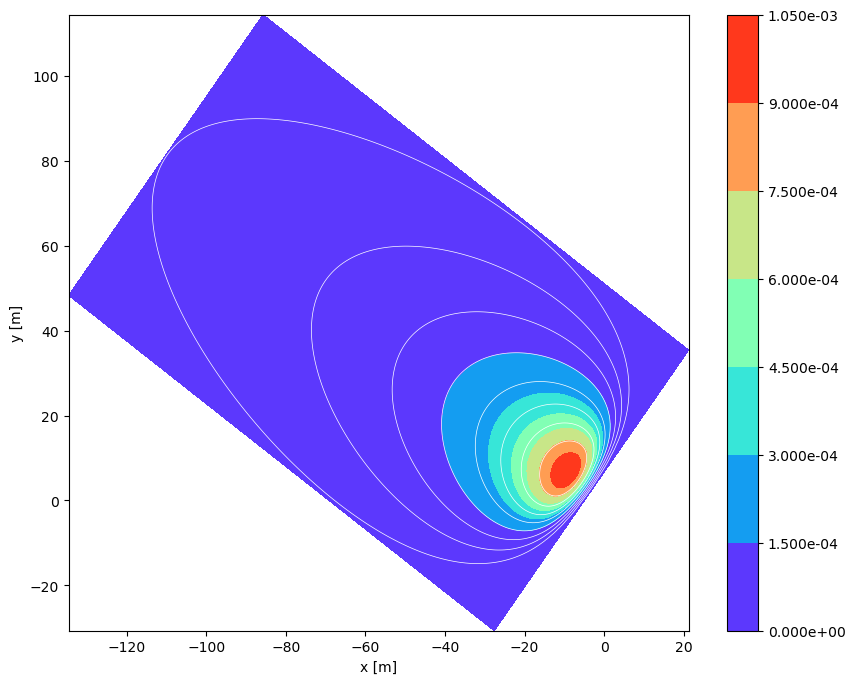

2 1.10048 306.46 23.438079606662214 8.49276 0.28986462357452314 0.0621553

Error(0009):
 ustar (friction velocity) must be >=0.1.


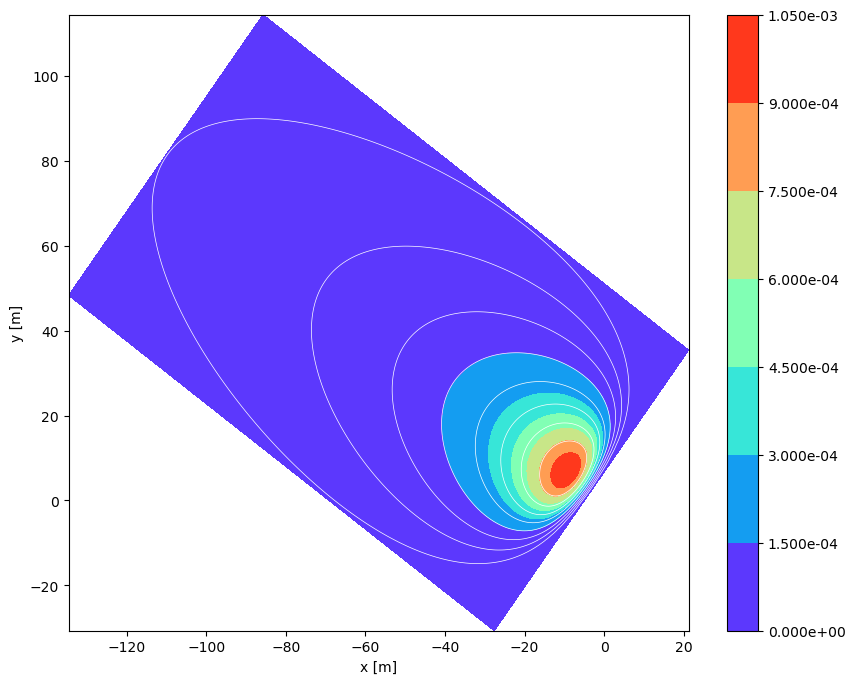

2 0.464475 311.836 14.027144808784646 4.65526 0.25898938202173466 0.0400671

Error(0009):
 ustar (friction velocity) must be >=0.1.


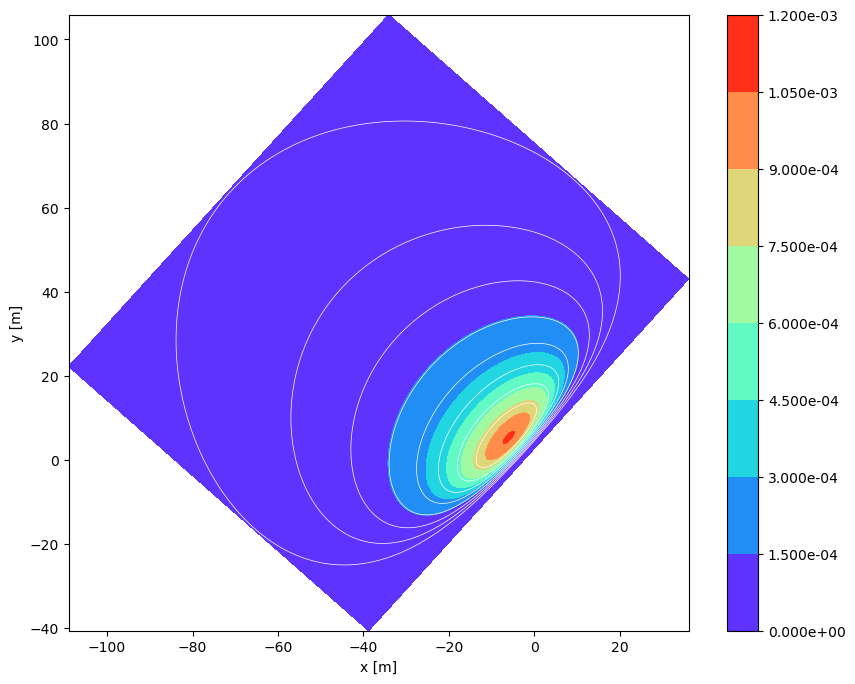

2 0.464475 311.836 14.027144808784646 4.65526 0.25898938202173466 0.0400671

Error(0009):
 ustar (friction velocity) must be >=0.1.


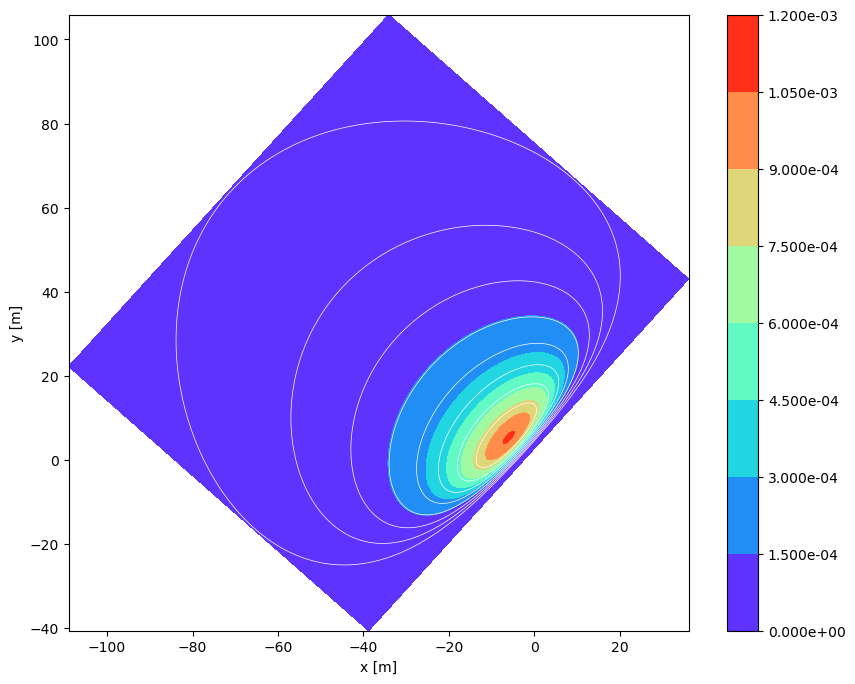

2 0.337965 10.0281 26.01185362594116 7.52825 0.2984332421162227 0.0835796

Error(0009):
 ustar (friction velocity) must be >=0.1.


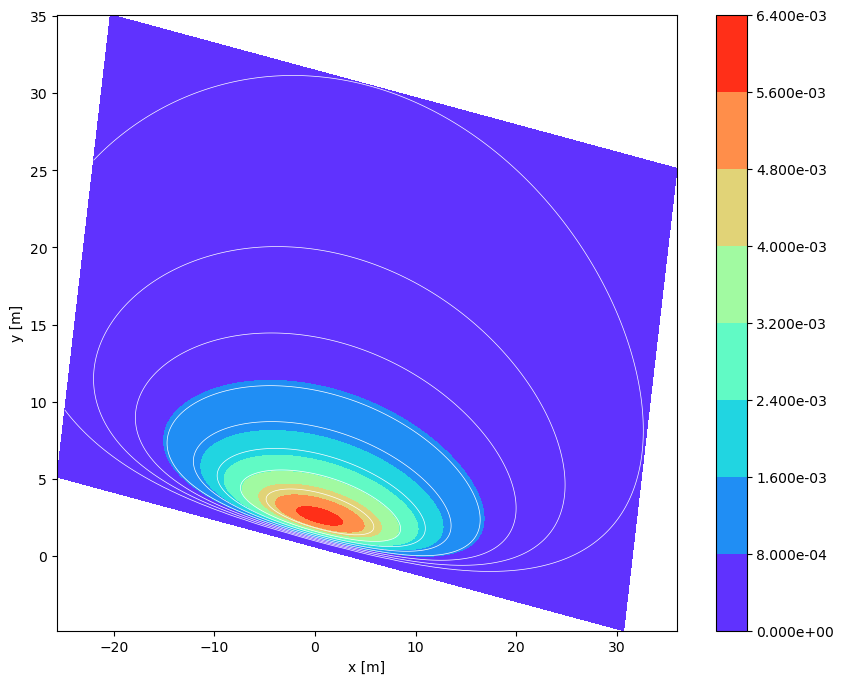

2 0.337965 10.0281 26.01185362594116 7.52825 0.2984332421162227 0.0835796

Error(0009):
 ustar (friction velocity) must be >=0.1.


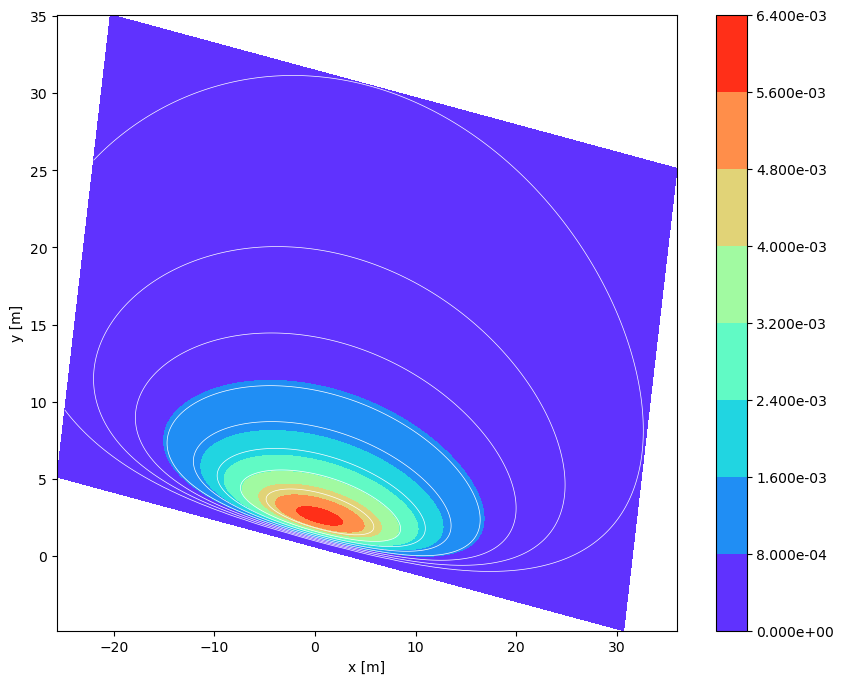

2 0.337965 10.0281 26.01185362594116 7.52825 0.2984332421162227 0.0835796

Error(0009):
 ustar (friction velocity) must be >=0.1.


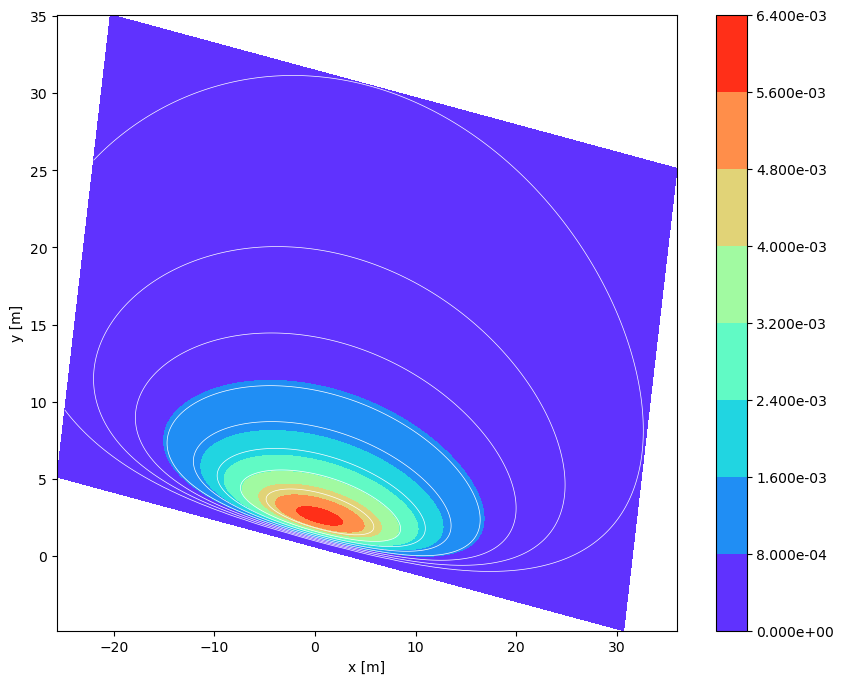

2 0.337965 10.0281 26.01185362594116 7.52825 0.2984332421162227 0.0835796

Error(0009):
 ustar (friction velocity) must be >=0.1.


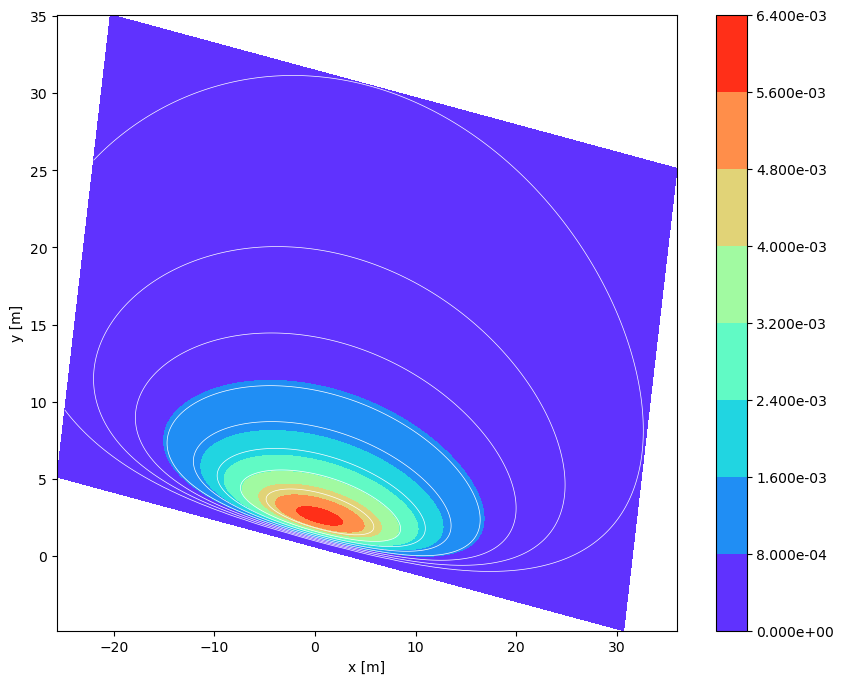

2 5.35123 337.898 1000.0 -192.142 1.6552915151114622 0.512534


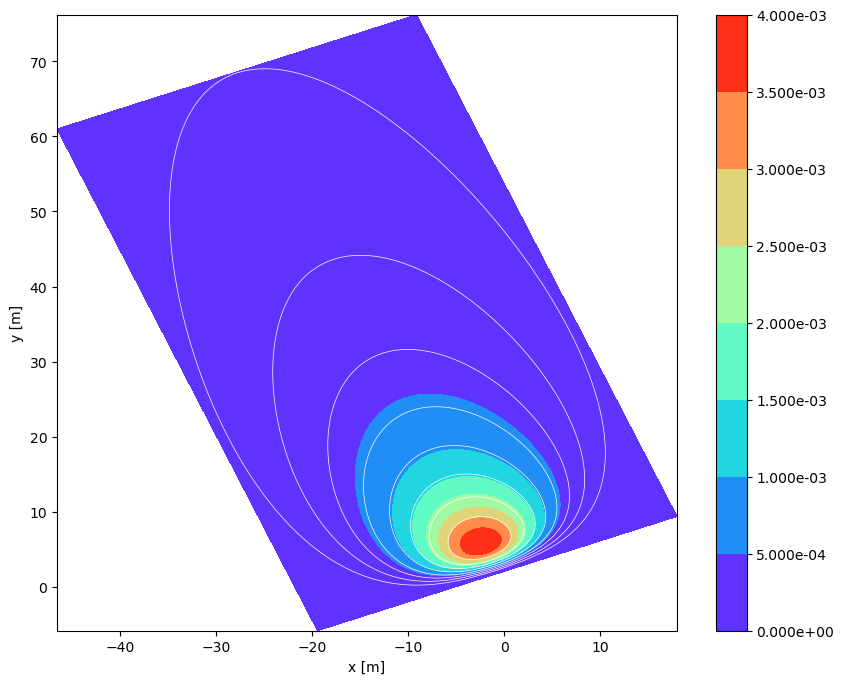

2 5.35123 337.898 1000.0 -192.142 1.6552915151114622 0.512534


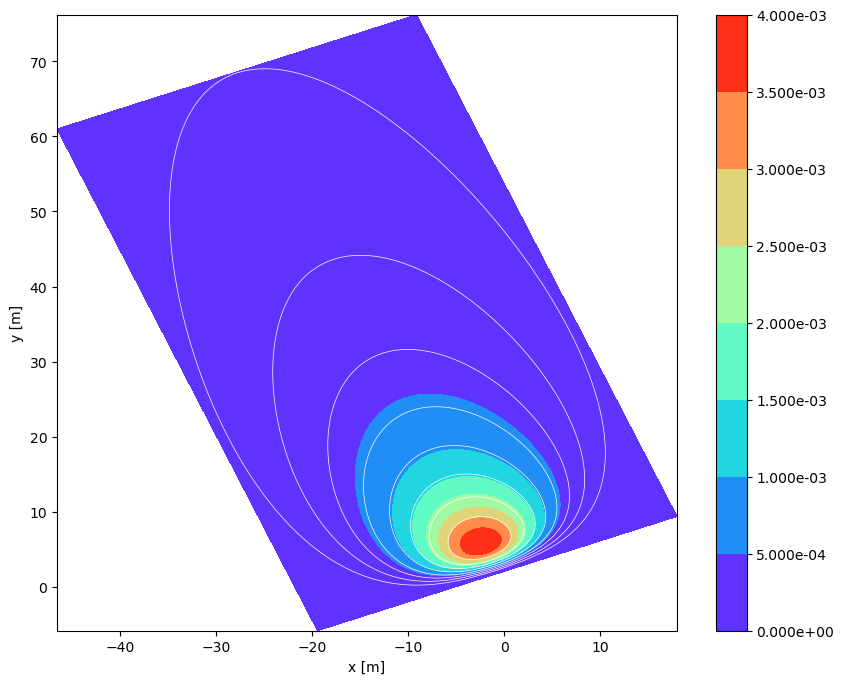

2 5.35123 337.898 1000.0 -192.142 1.6552915151114622 0.512534


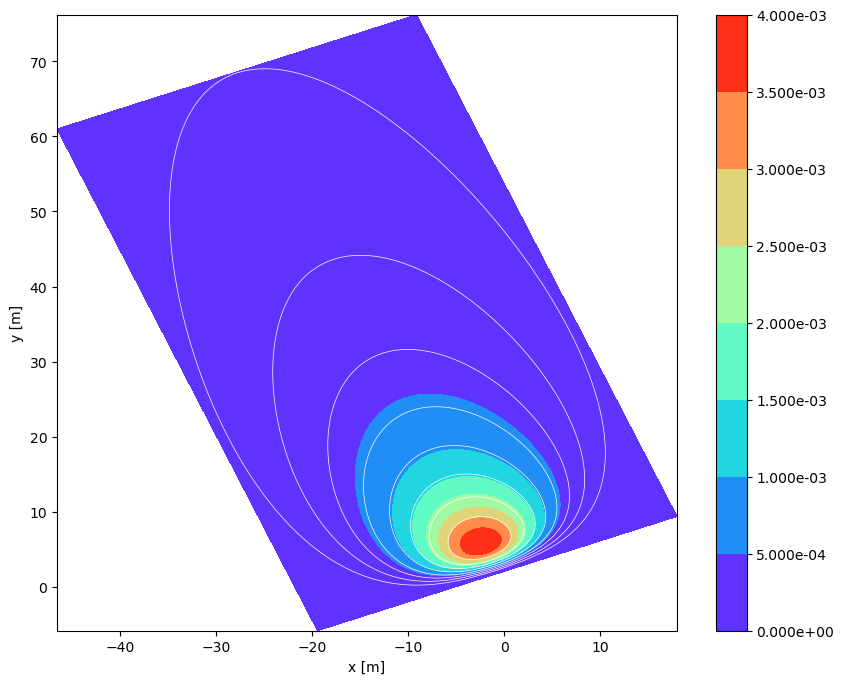

2 5.35123 337.898 1000.0 -192.142 1.6552915151114622 0.512534


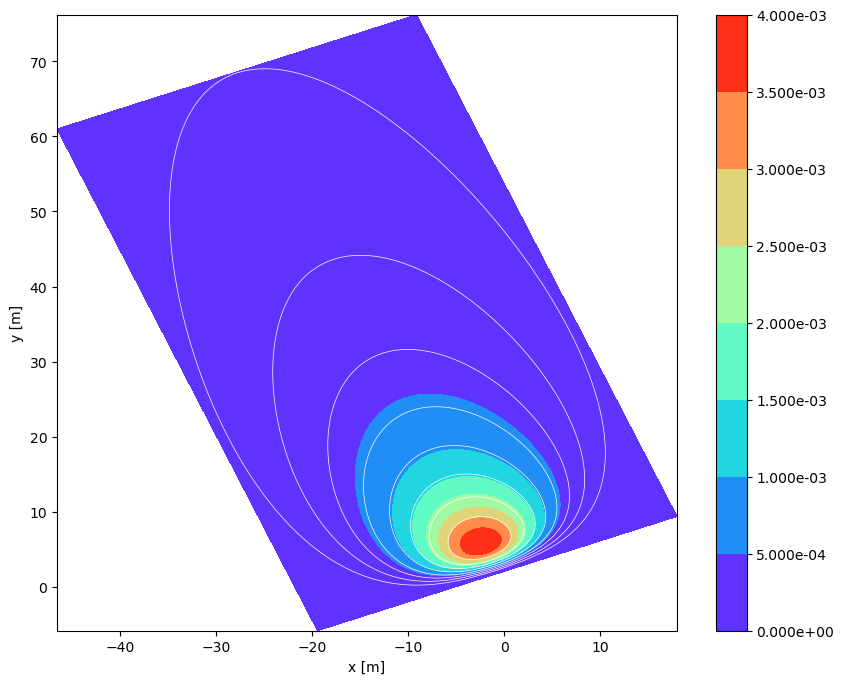

2 4.92132 5.87872 1000.0 -275.109 1.6569824983988213 0.489233


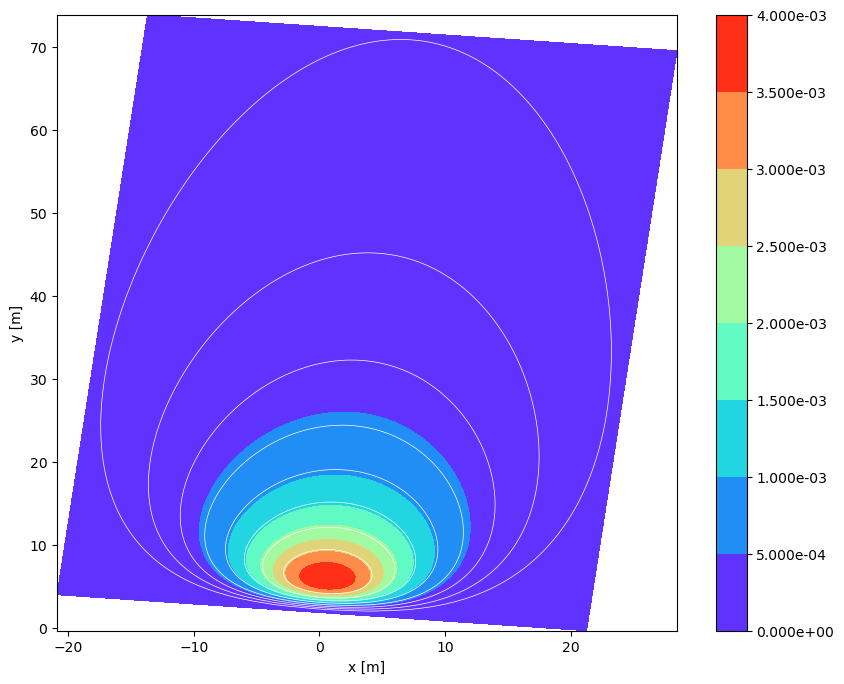

2 4.92132 5.87872 1000.0 -275.109 1.6569824983988213 0.489233


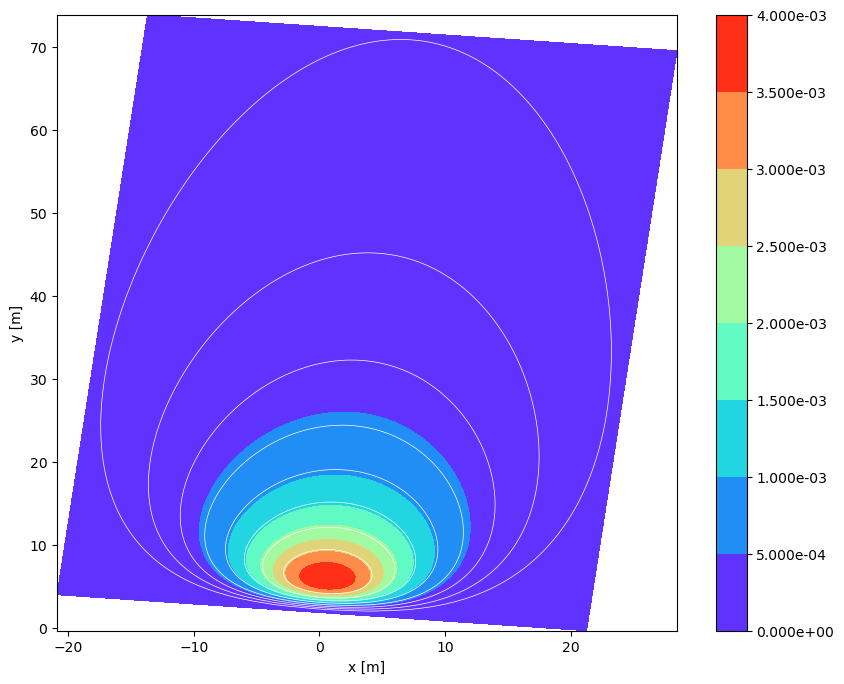

2 4.92132 5.87872 1000.0 -275.109 1.6569824983988213 0.489233


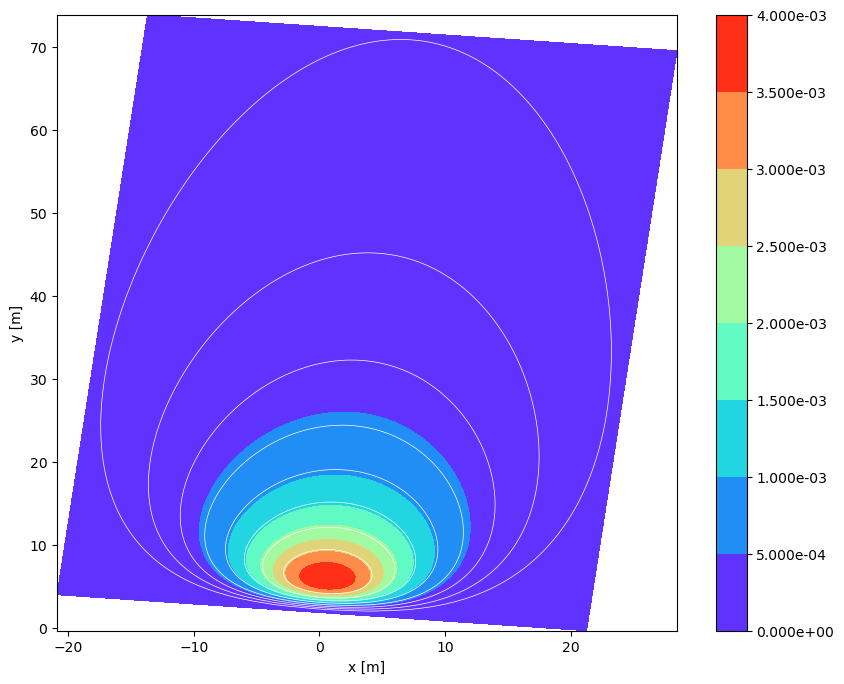

2 4.92132 5.87872 1000.0 -275.109 1.6569824983988213 0.489233


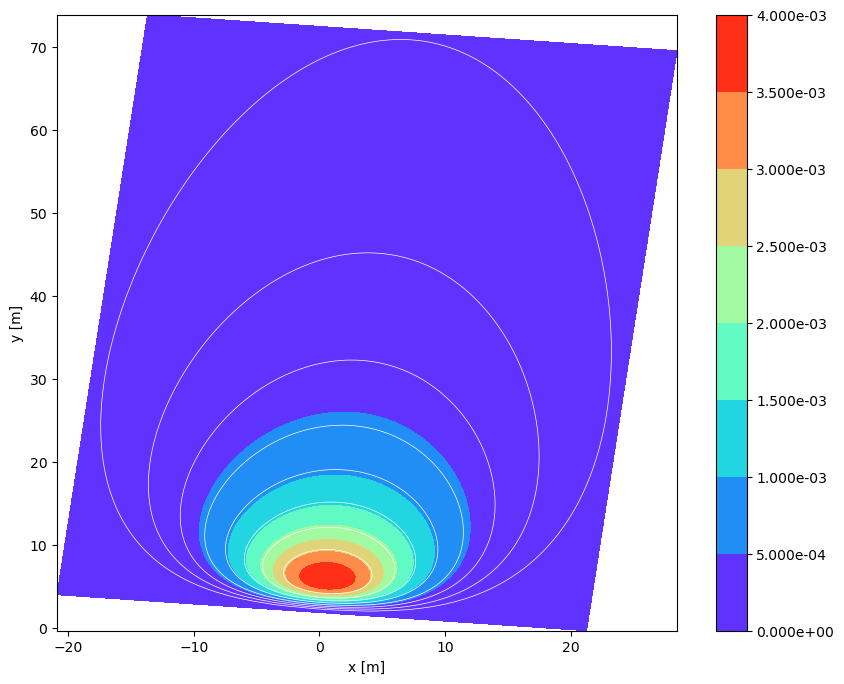

2 3.41801 21.9171 244.82954279221306 210.384 1.0582036665973145 0.333917


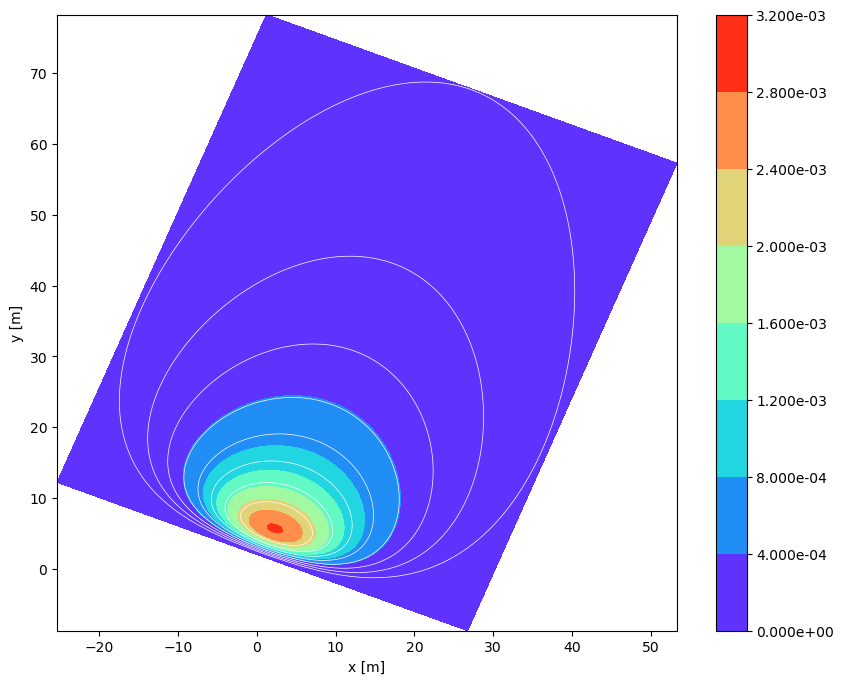

2 3.41801 21.9171 244.82954279221306 210.384 1.0582036665973145 0.333917


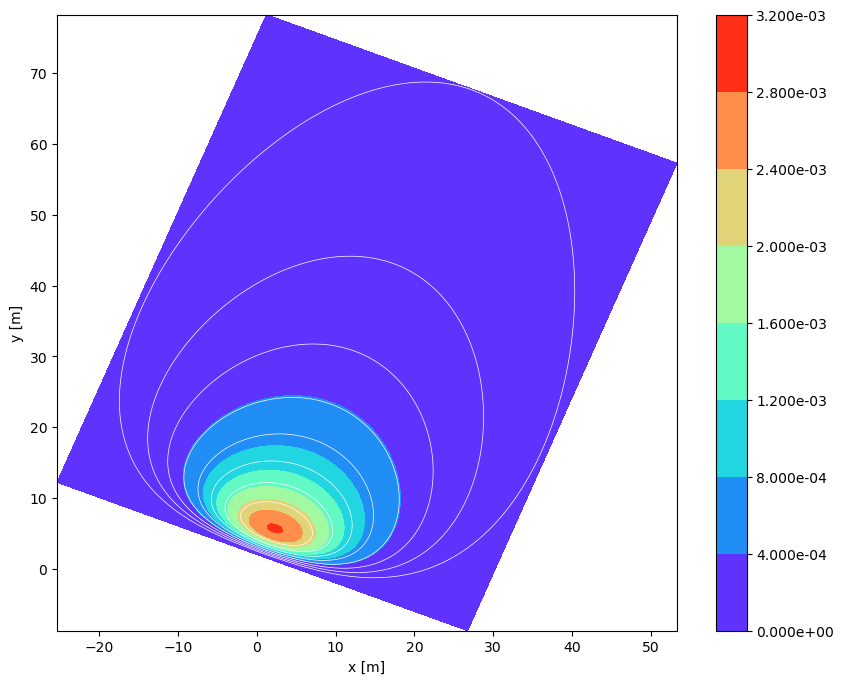

2 0.969624 349.54 42.300849782024265 16.7986 0.3652731854379678 0.103928


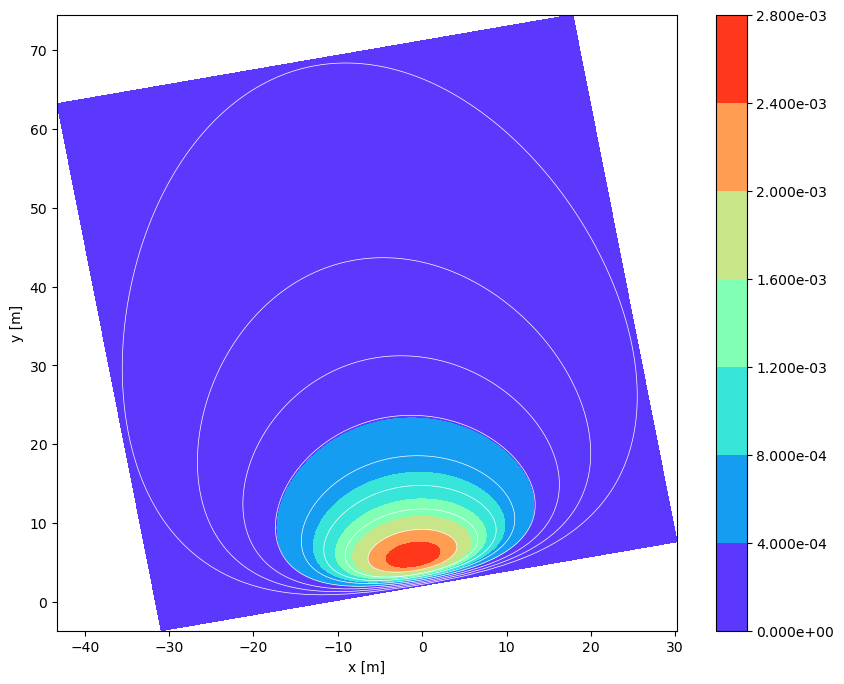

2 0.969624 349.54 42.300849782024265 16.7986 0.3652731854379678 0.103928


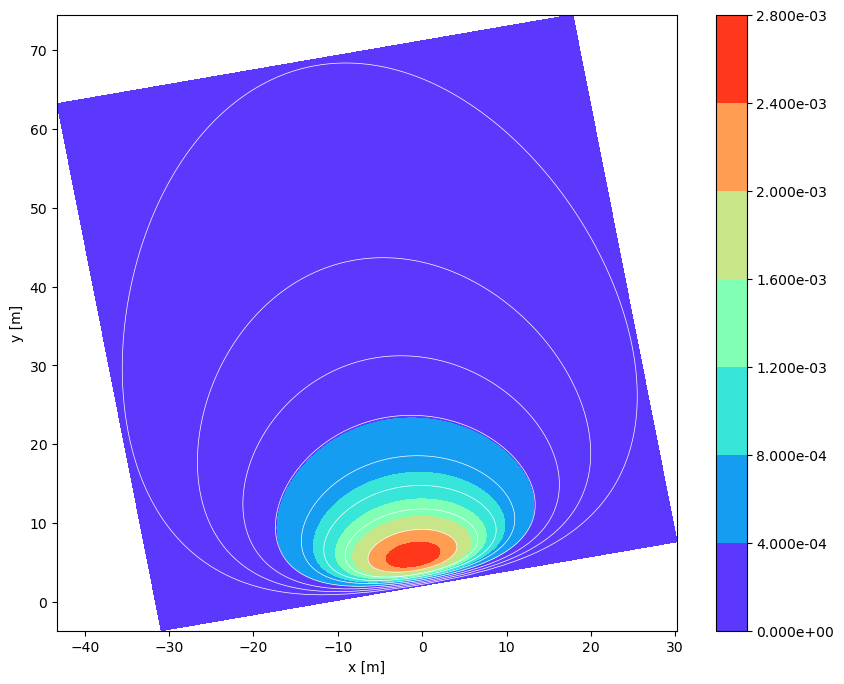

2 0.969624 349.54 42.300849782024265 16.7986 0.3652731854379678 0.103928


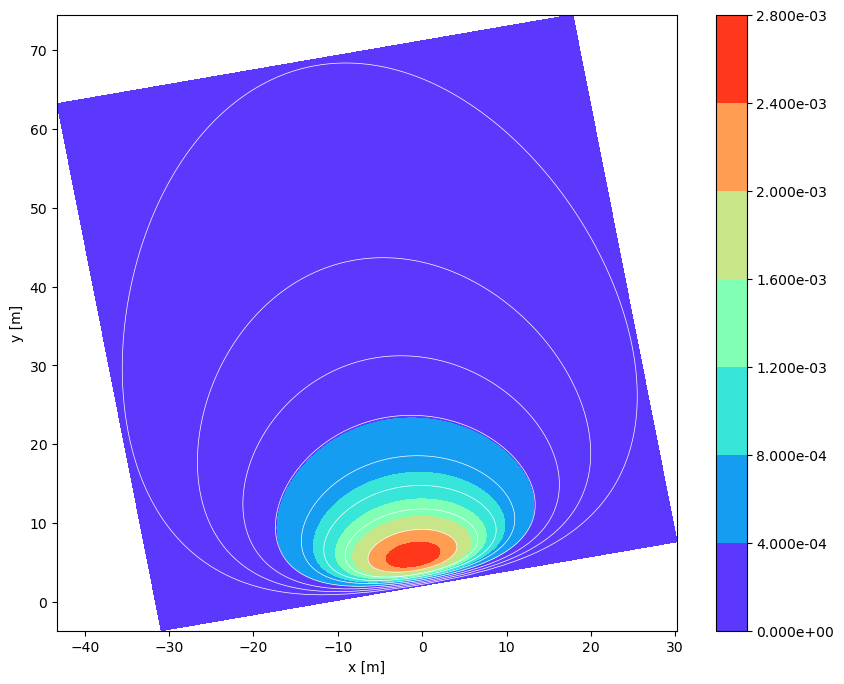

2 0.340904 288.88 74.72428010811996 29.9451 0.49570212829884036 0.182217


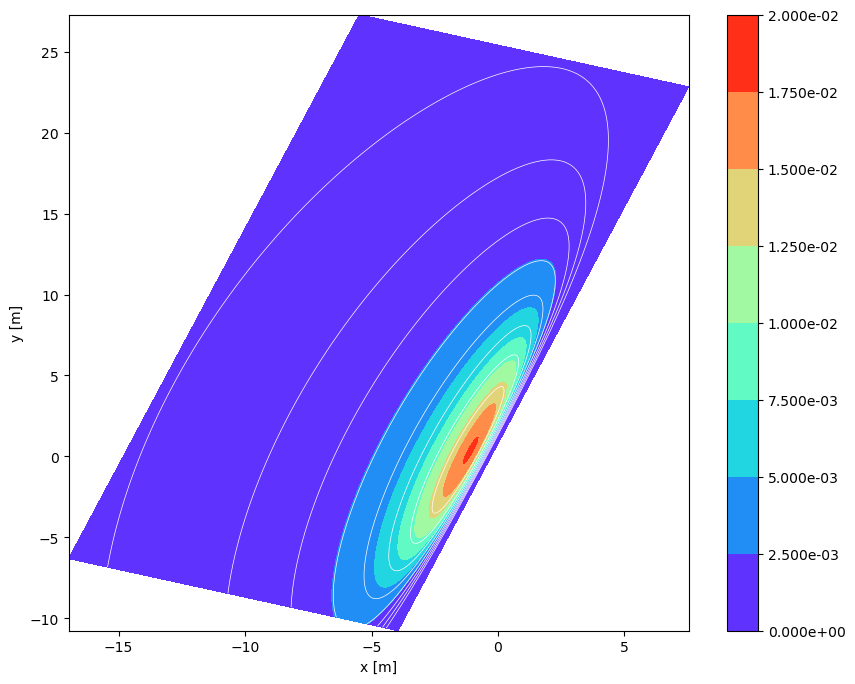

2 0.340904 288.88 74.72428010811996 29.9451 0.49570212829884036 0.182217


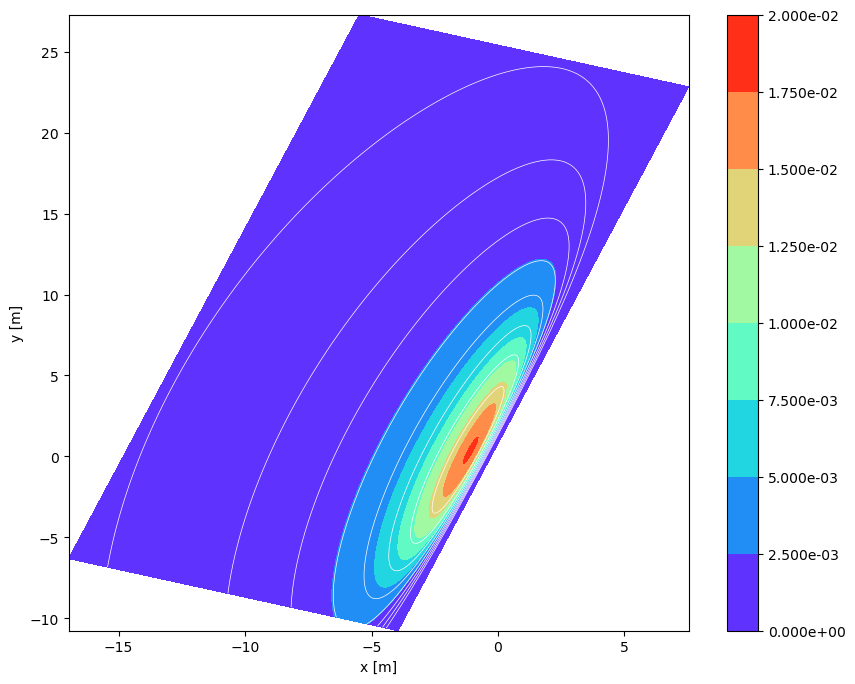

2 0.340904 288.88 74.72428010811996 29.9451 0.49570212829884036 0.182217


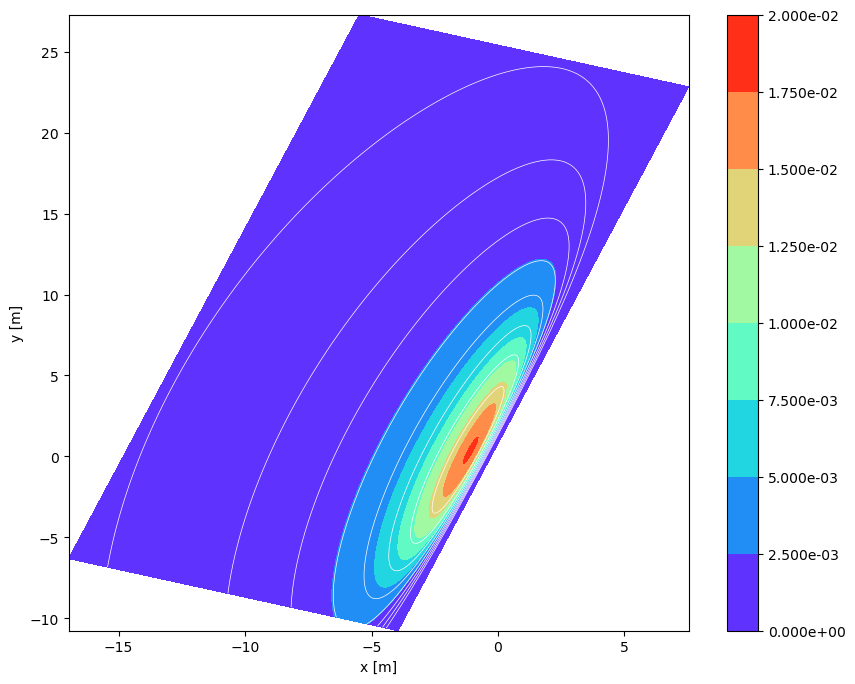

2 0.340904 288.88 74.72428010811996 29.9451 0.49570212829884036 0.182217


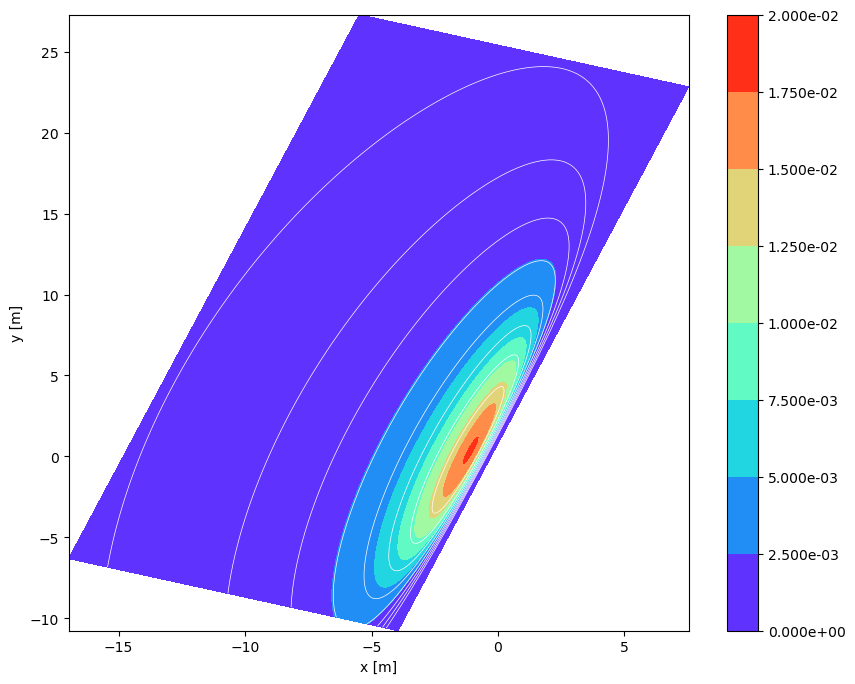

2 5.61413 331.357 1000.0 -133.814 2.1373768970399207 0.589783


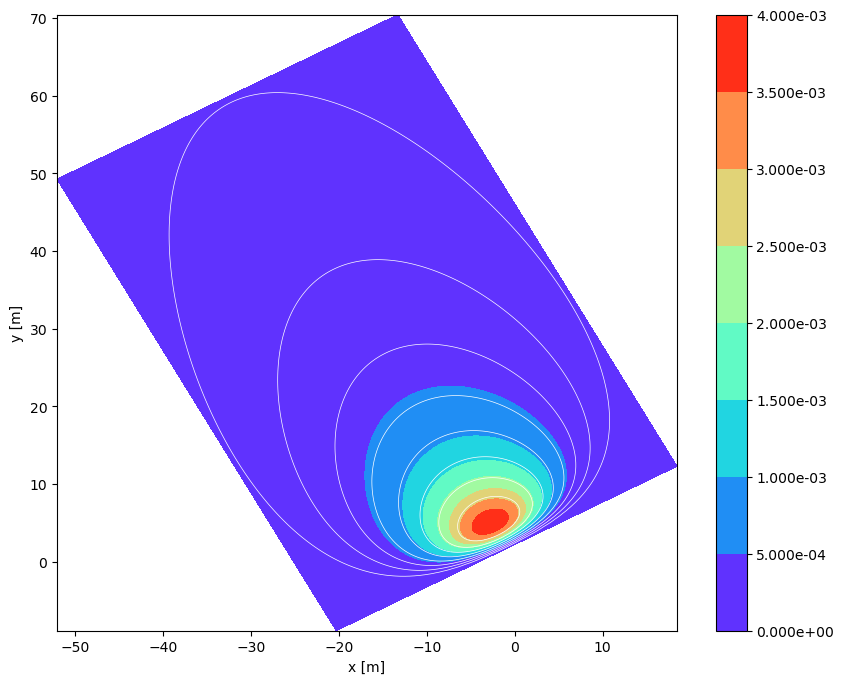

2 5.61413 331.357 1000.0 -133.814 2.1373768970399207 0.589783


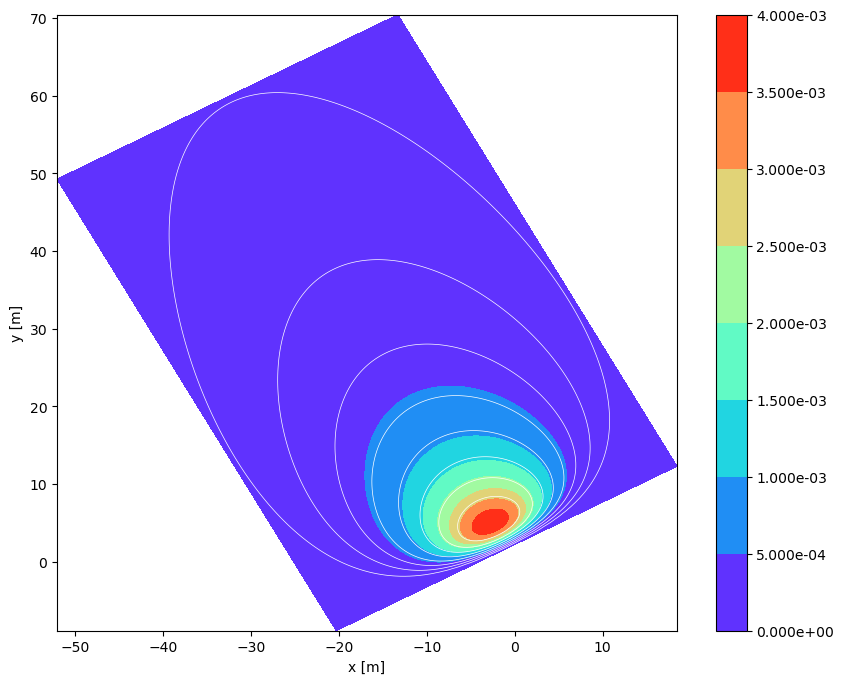

2 5.61413 331.357 1000.0 -133.814 2.1373768970399207 0.589783


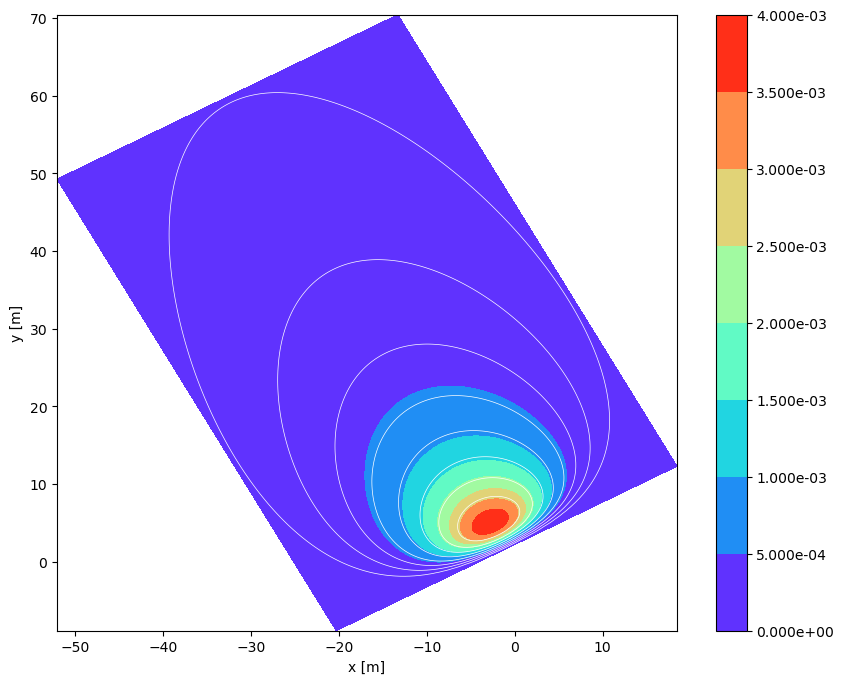

2 5.61413 331.357 1000.0 -133.814 2.1373768970399207 0.589783


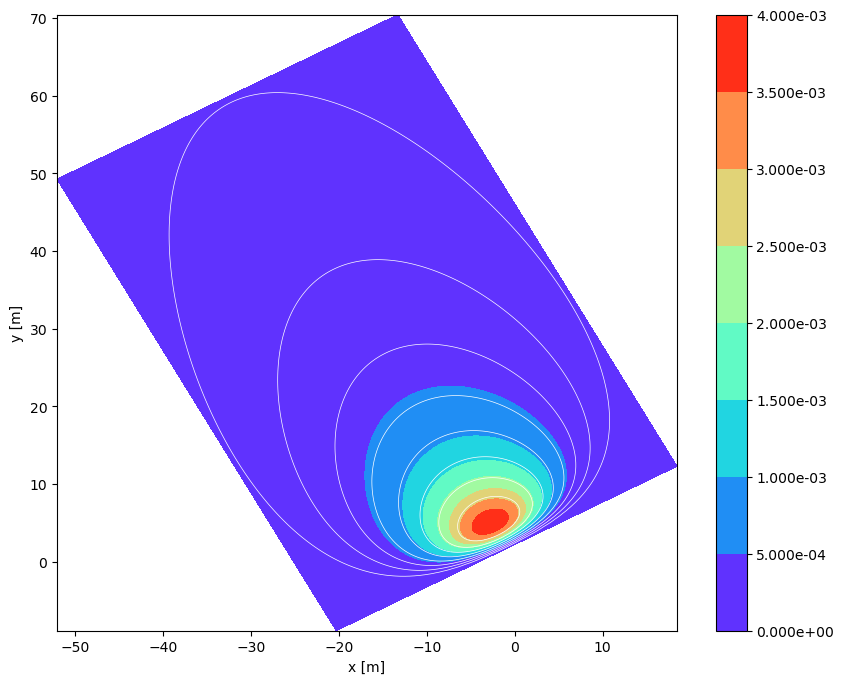

2 6.43991 327.953 1000.0 -310.395 2.204982993131693 0.651664


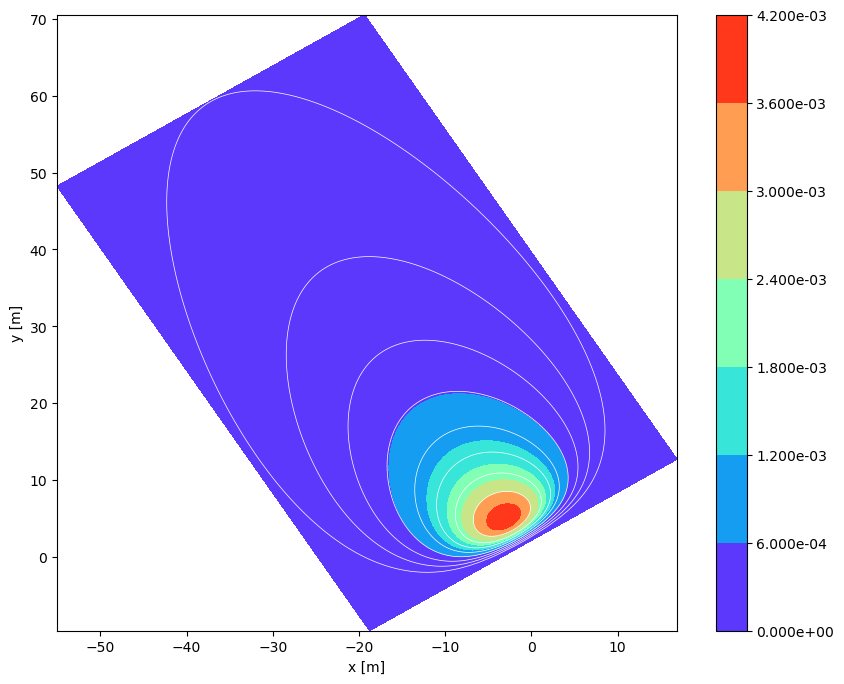

2 6.43991 327.953 1000.0 -310.395 2.204982993131693 0.651664


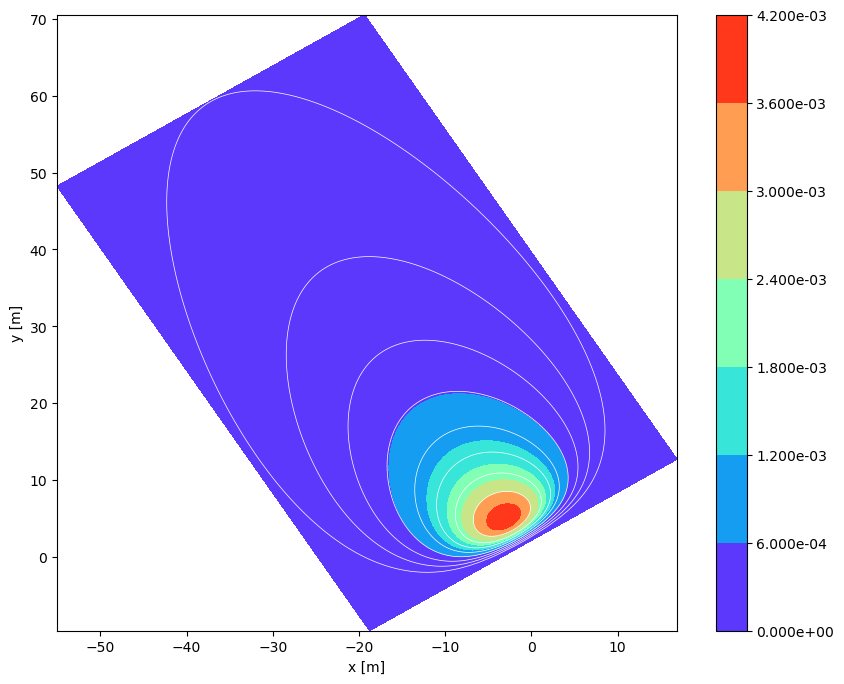

2 6.43991 327.953 1000.0 -310.395 2.204982993131693 0.651664


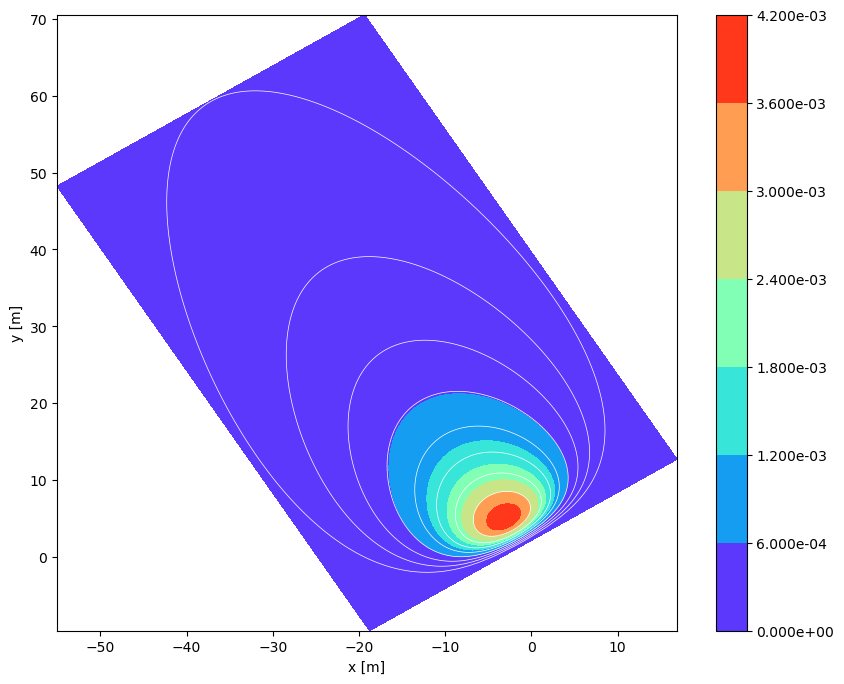

2 6.43991 327.953 1000.0 -310.395 2.204982993131693 0.651664


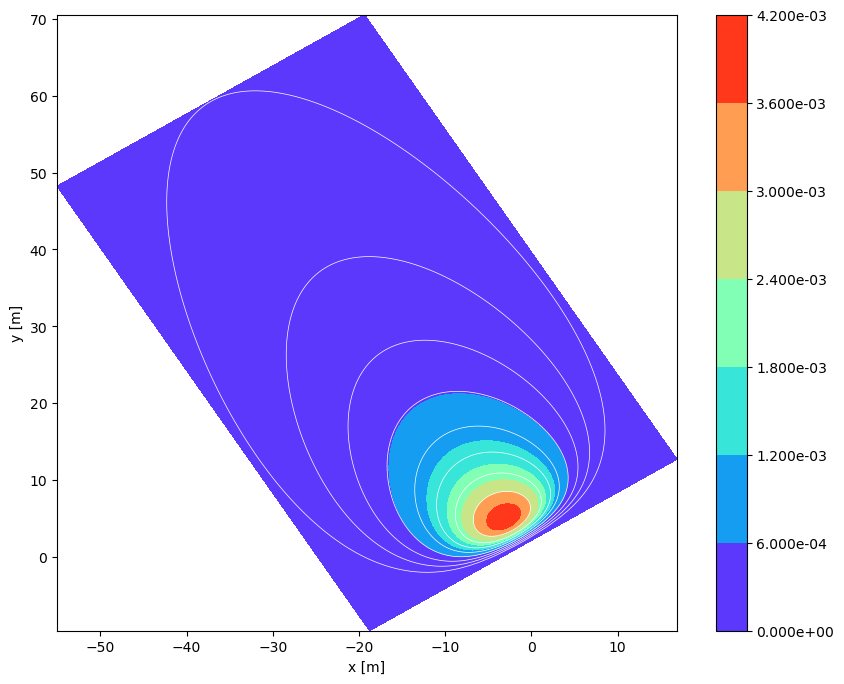

2 3.5496 4.24284 180.72139701595765 113.614 1.0765310028048427 0.308747


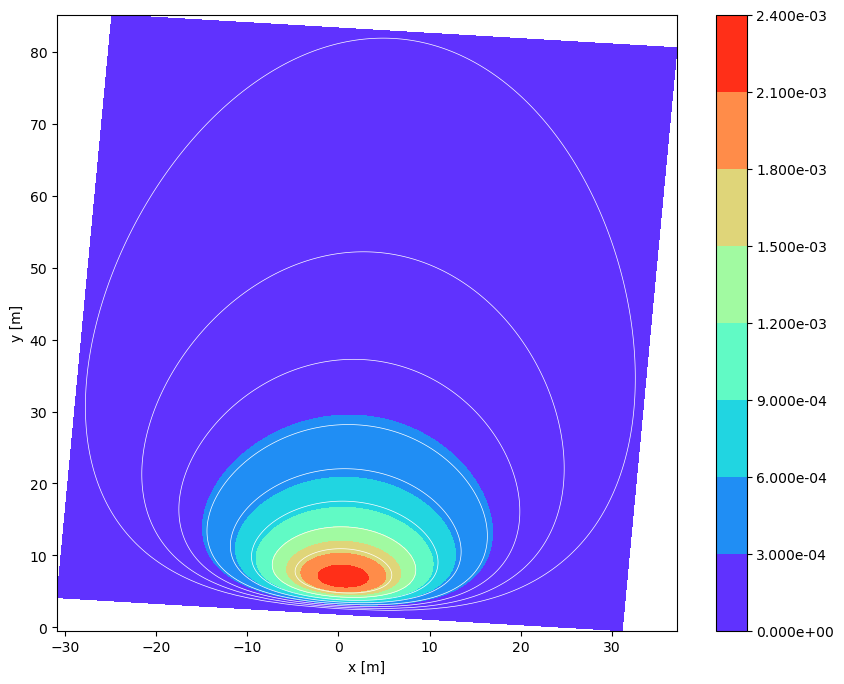

2 3.5496 4.24284 180.72139701595765 113.614 1.0765310028048427 0.308747


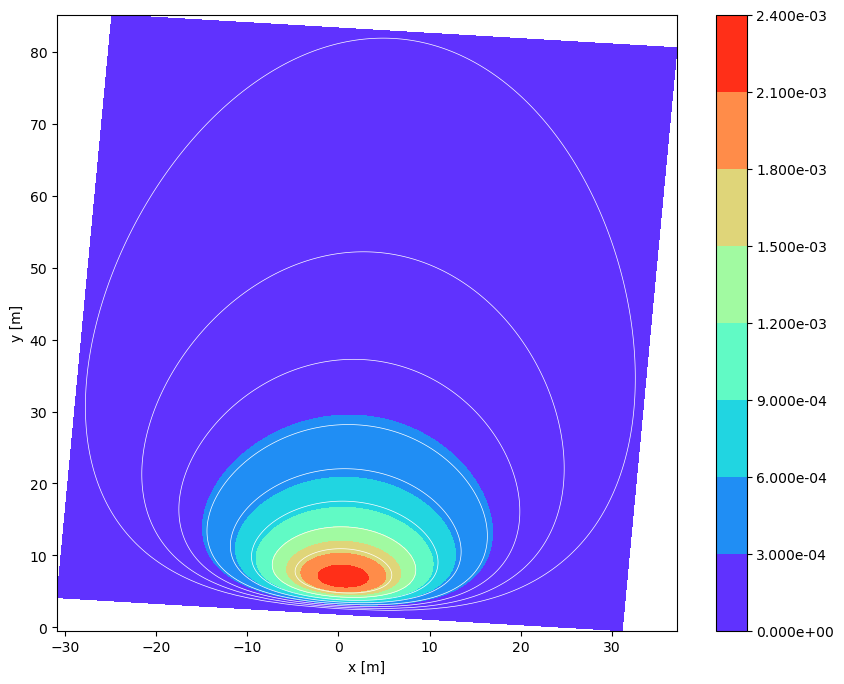

2 1.23818 349.182 17.235757125186407 5.23128 0.3285344730770273 0.0531486

Error(0009):
 ustar (friction velocity) must be >=0.1.


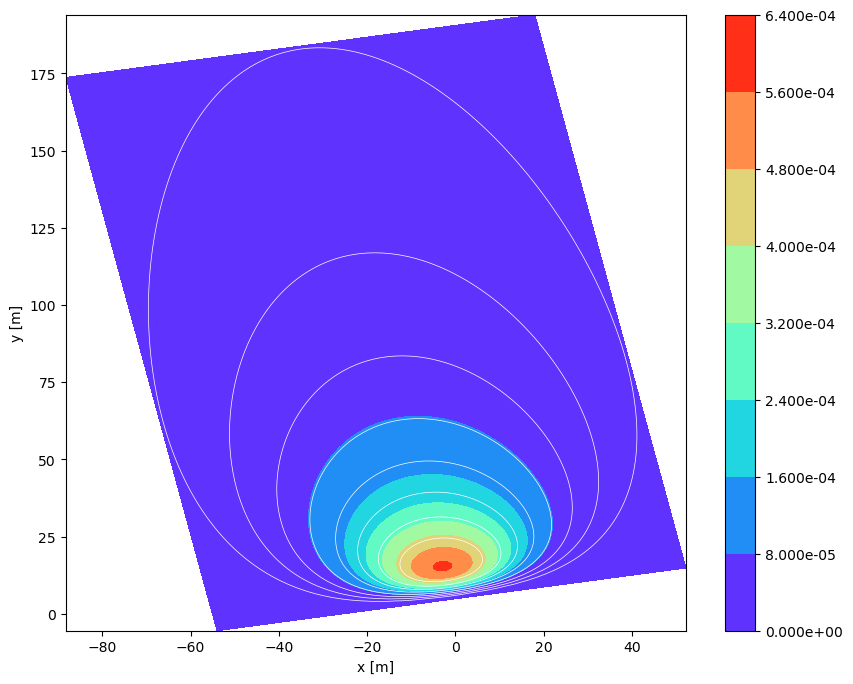

2 1.23818 349.182 17.235757125186407 5.23128 0.3285344730770273 0.0531486

Error(0009):
 ustar (friction velocity) must be >=0.1.


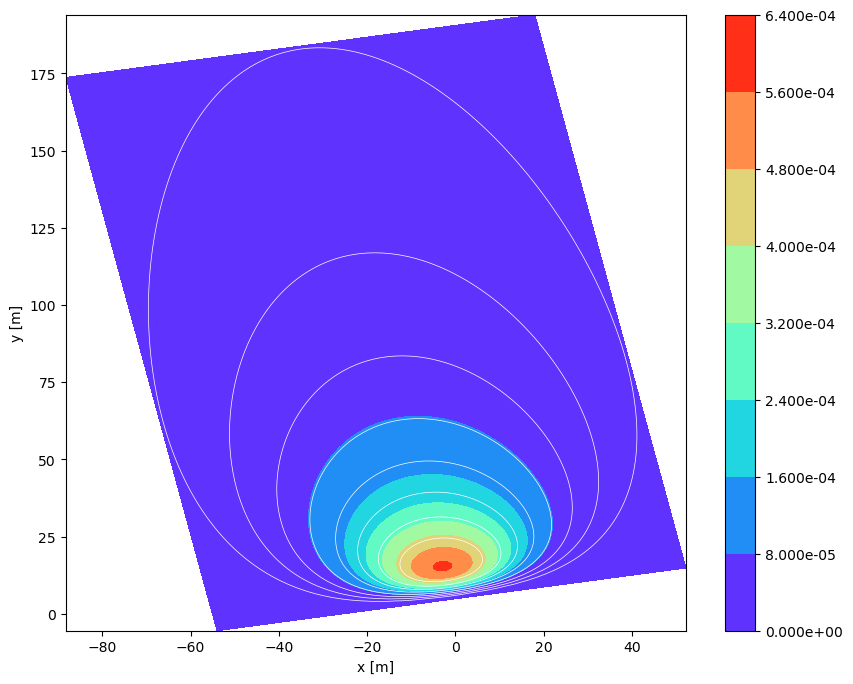

2 1.23818 349.182 17.235757125186407 5.23128 0.3285344730770273 0.0531486

Error(0009):
 ustar (friction velocity) must be >=0.1.


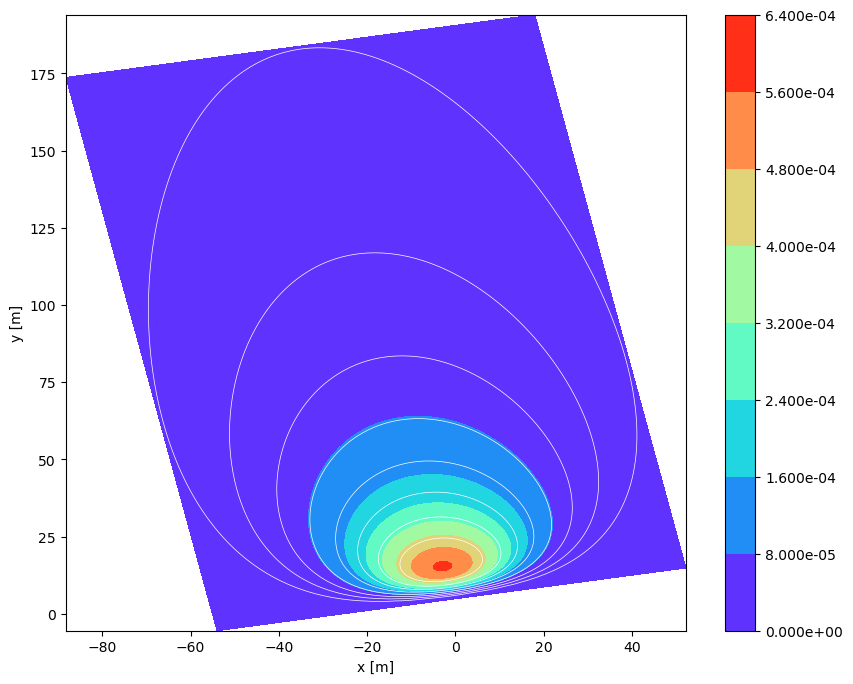

2 1.23818 349.182 17.235757125186407 5.23128 0.3285344730770273 0.0531486

Error(0009):
 ustar (friction velocity) must be >=0.1.


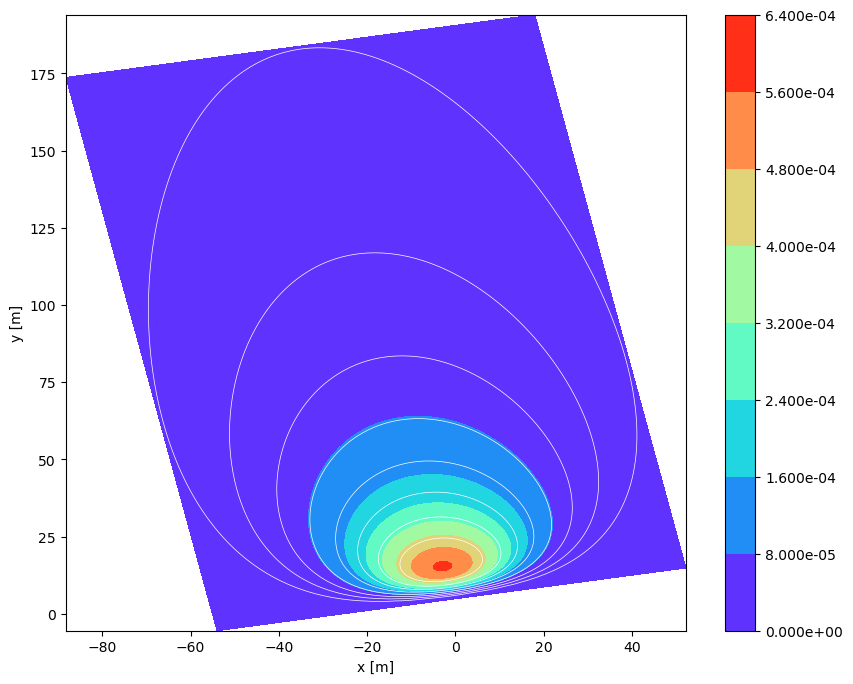

2 1.2654 0.441634 12.837620565556335 3.15104 0.47862877055187564 0.0476604

Error(0009):
 ustar (friction velocity) must be >=0.1.


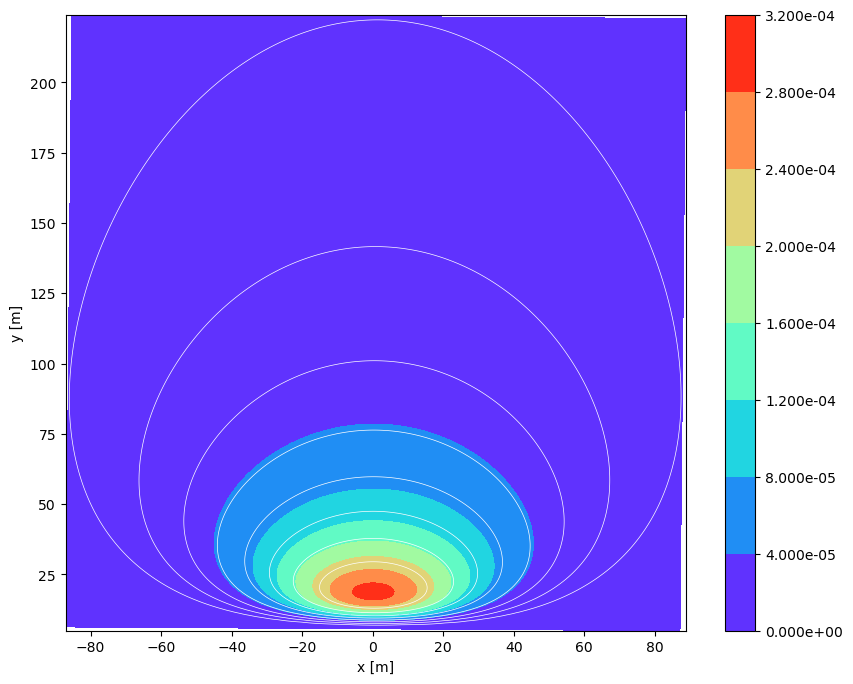

2 1.2654 0.441634 12.837620565556335 3.15104 0.47862877055187564 0.0476604

Error(0009):
 ustar (friction velocity) must be >=0.1.


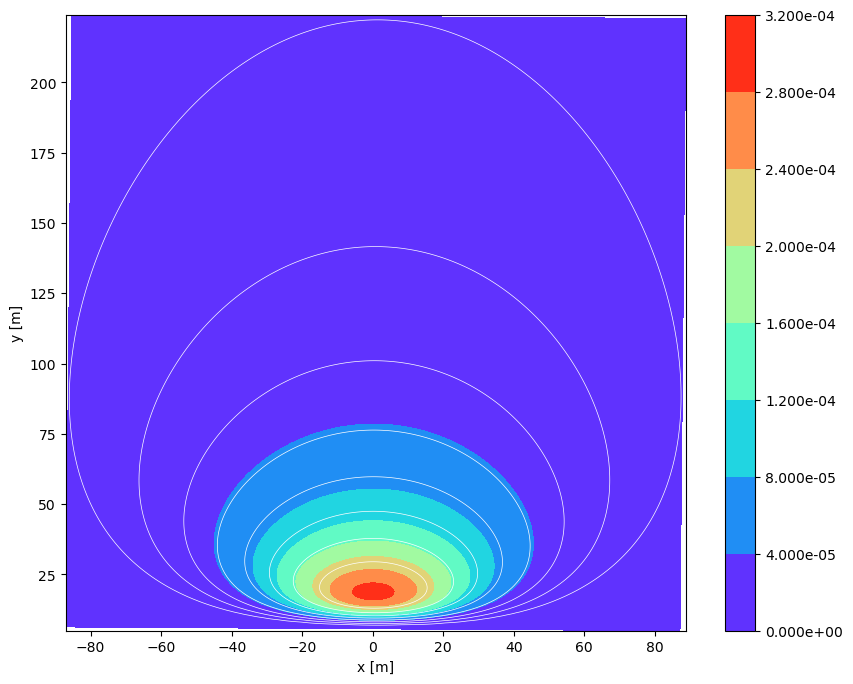

2 1.2654 0.441634 12.837620565556335 3.15104 0.47862877055187564 0.0476604

Error(0009):
 ustar (friction velocity) must be >=0.1.


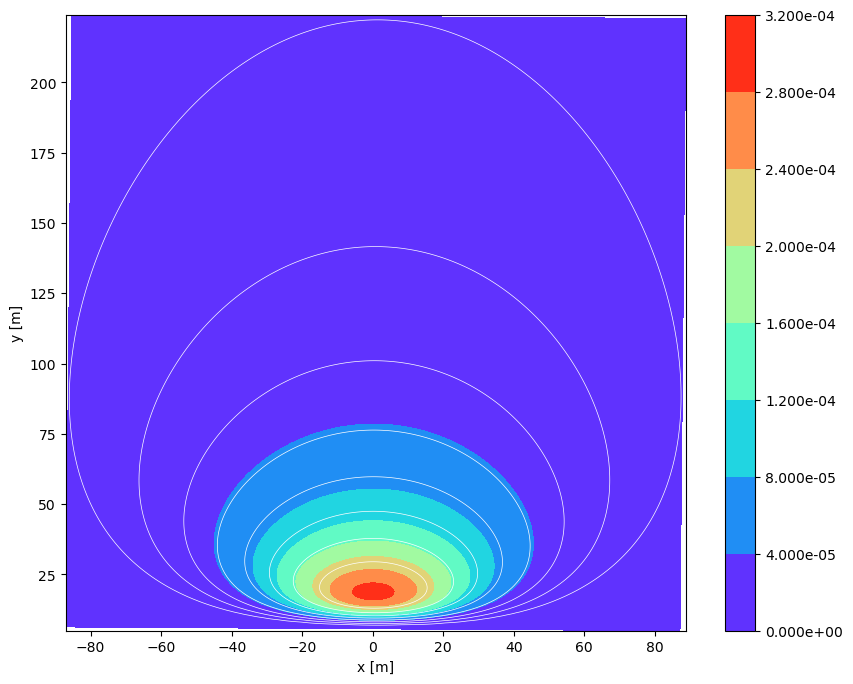

2 1.2654 0.441634 12.837620565556335 3.15104 0.47862877055187564 0.0476604

Error(0009):
 ustar (friction velocity) must be >=0.1.


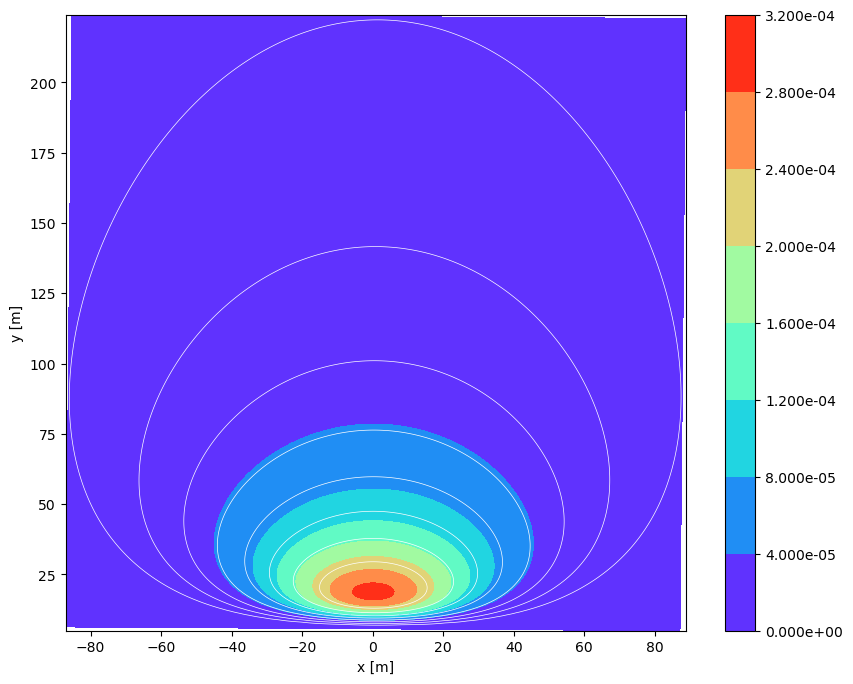

2 2.65641 45.802 1000.0 -14.5683 1.4400076388686276 0.273746


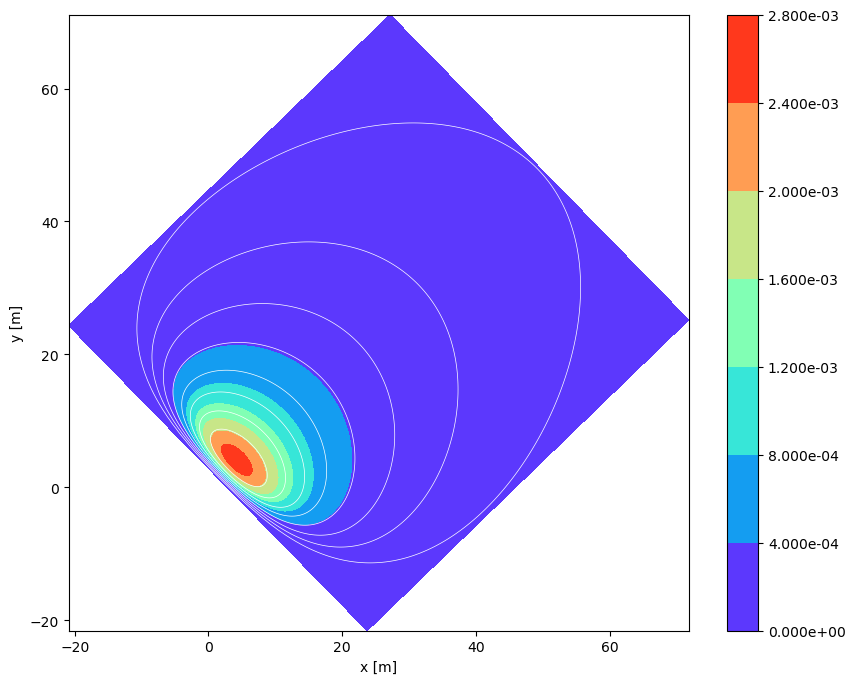

2 2.65641 45.802 1000.0 -14.5683 1.4400076388686276 0.273746


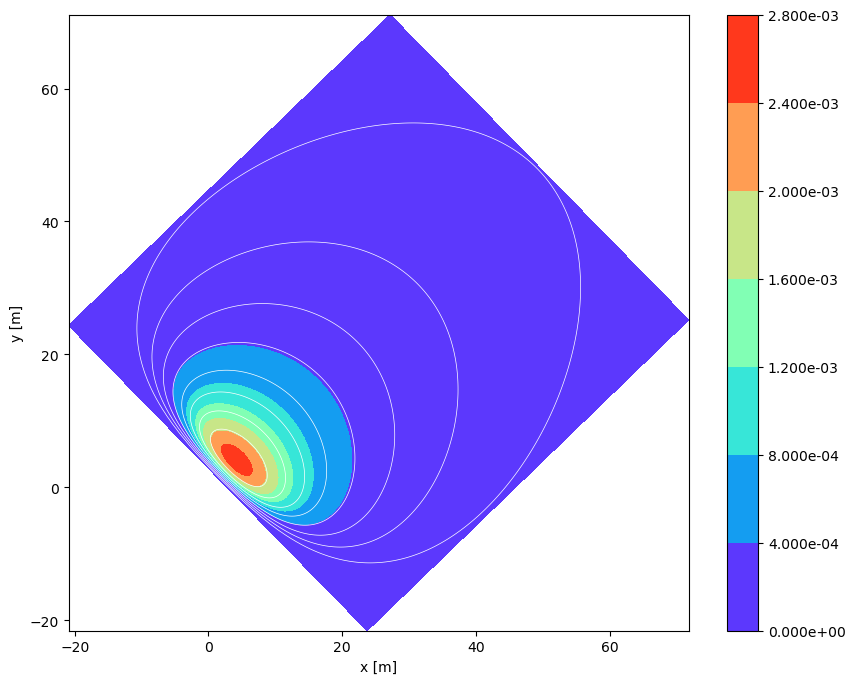

2 2.65641 45.802 1000.0 -14.5683 1.4400076388686276 0.273746


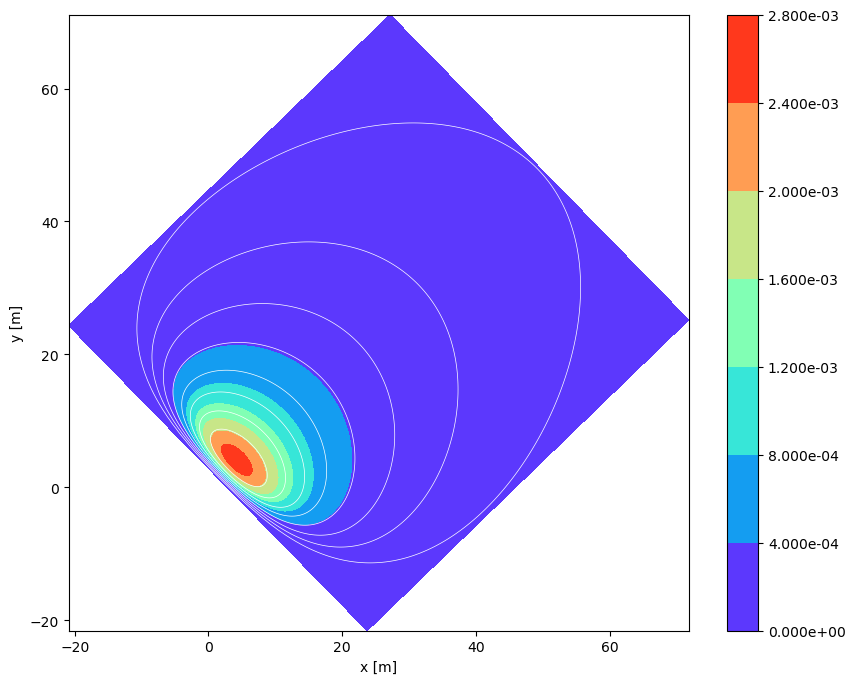

2 2.65641 45.802 1000.0 -14.5683 1.4400076388686276 0.273746


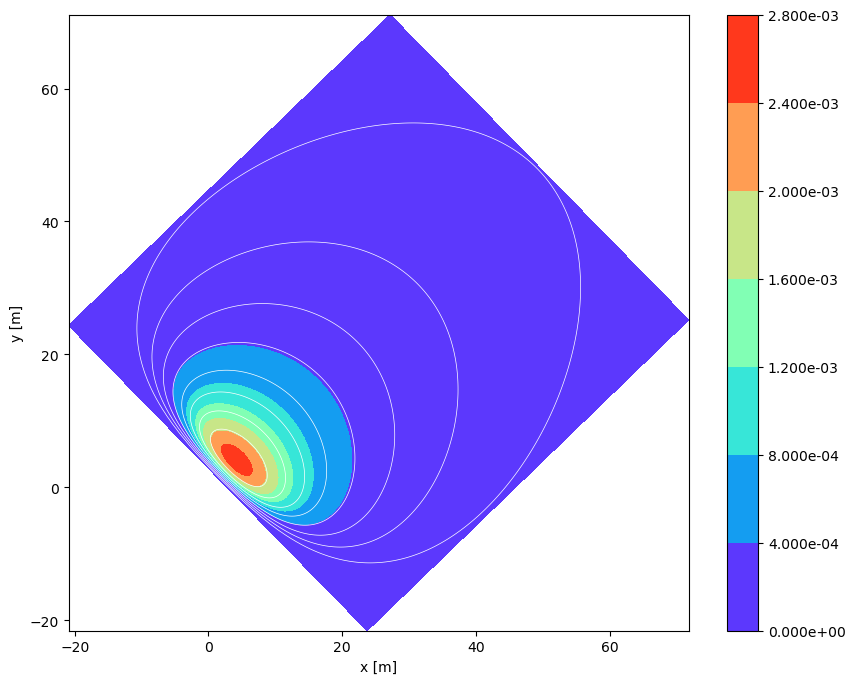

2 2.40578 59.962 1000.0 -15.0828 1.906108601313157 0.263912


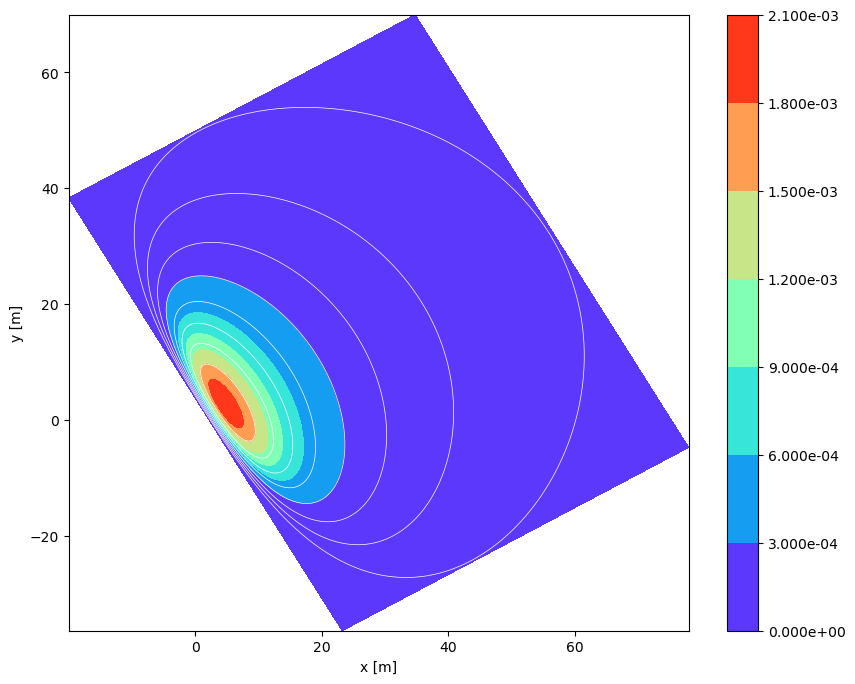

2 2.40578 59.962 1000.0 -15.0828 1.906108601313157 0.263912


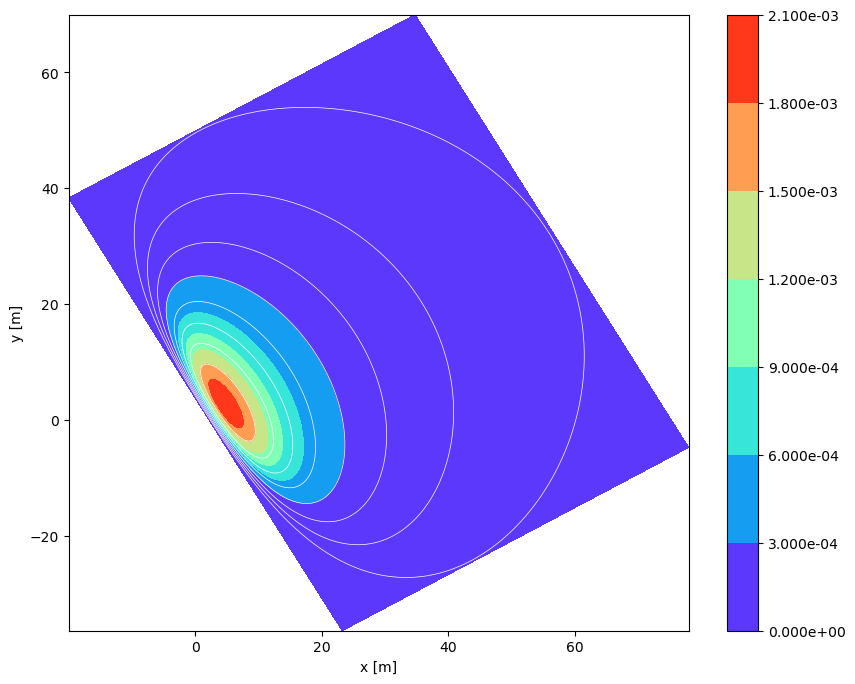

2 2.40578 59.962 1000.0 -15.0828 1.906108601313157 0.263912


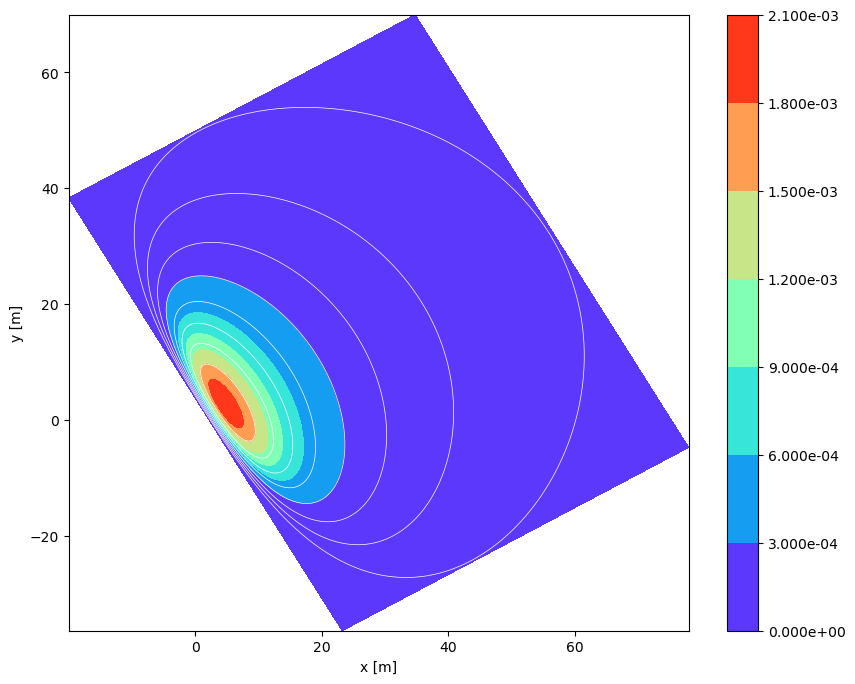

2 2.40578 59.962 1000.0 -15.0828 1.906108601313157 0.263912


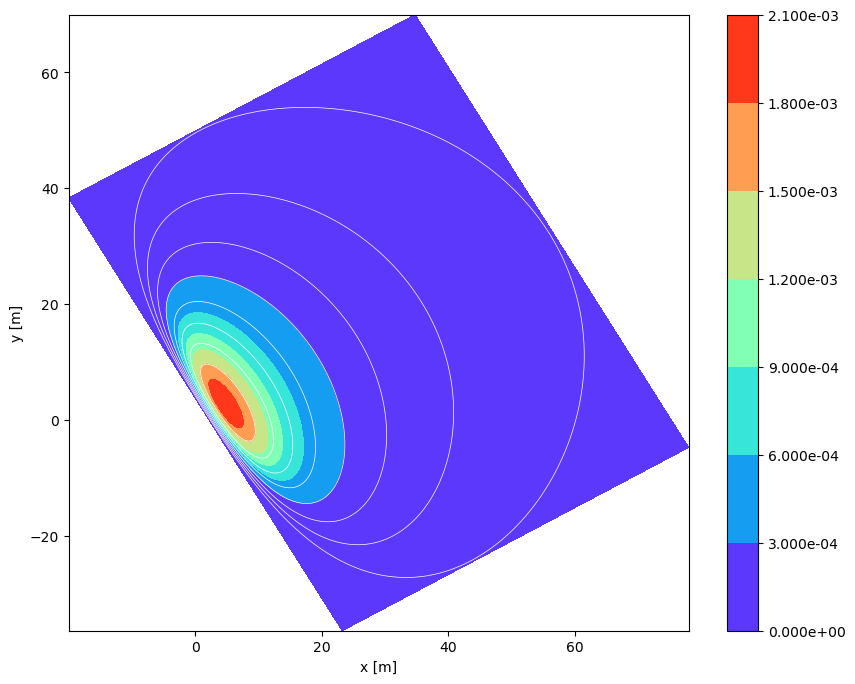

2 2.41316 58.0155 1000.0 -61.7123 1.0821095138663186 0.24743


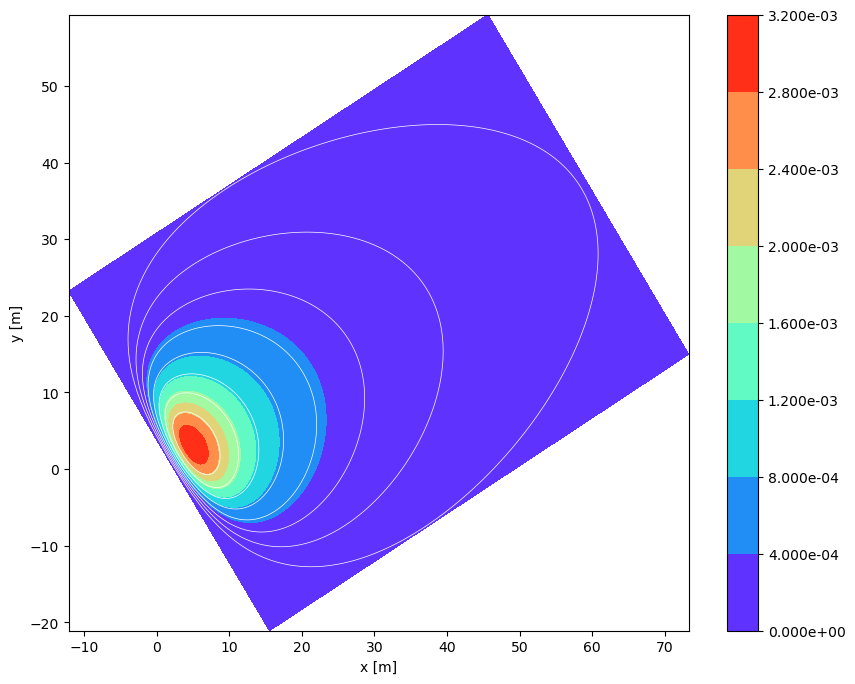

2 2.41316 58.0155 1000.0 -61.7123 1.0821095138663186 0.24743


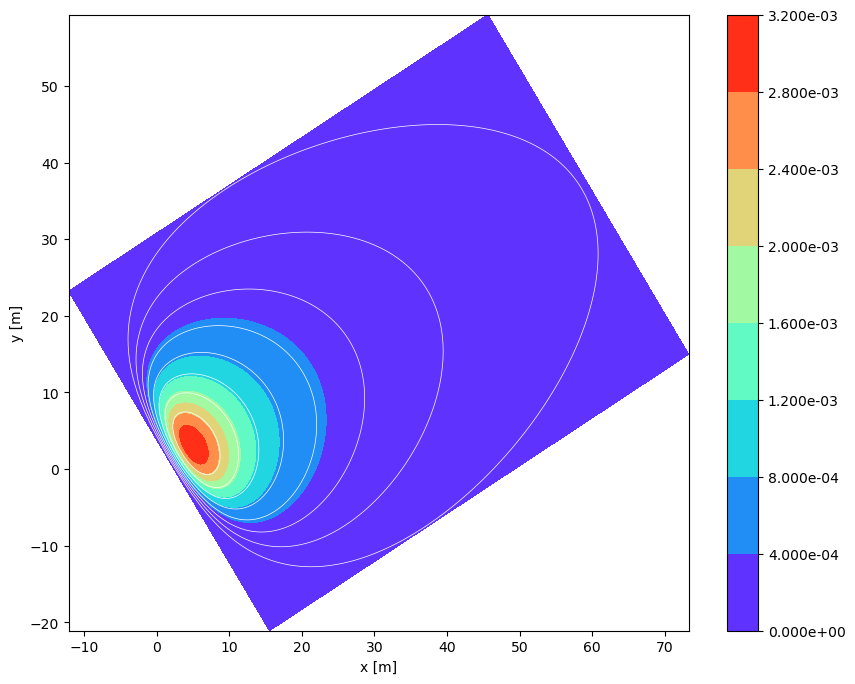

2 1.85503 57.7577 1000.0 -79.4806 0.9079878853817379 0.184536


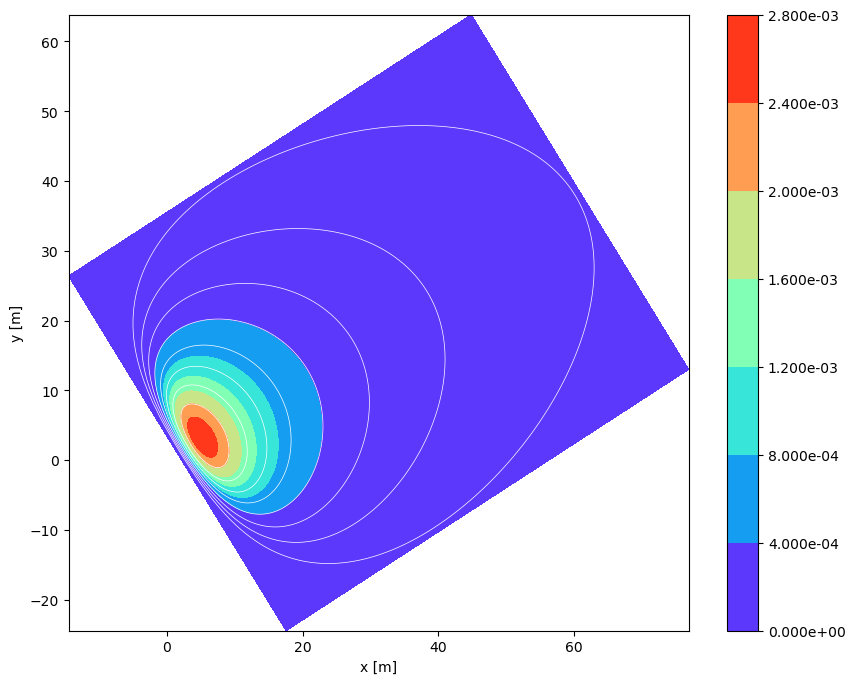

2 1.85503 57.7577 1000.0 -79.4806 0.9079878853817379 0.184536


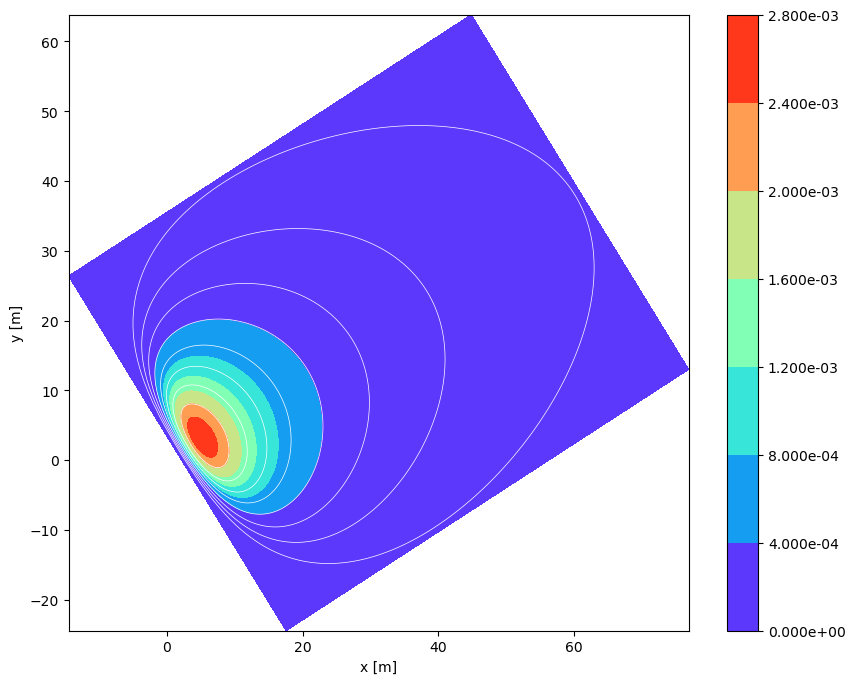

2 0.736283 61.096 1000.0 -0.487257 0.3004048934355098 0.0260297

Error(0009):
 ustar (friction velocity) must be >=0.1.


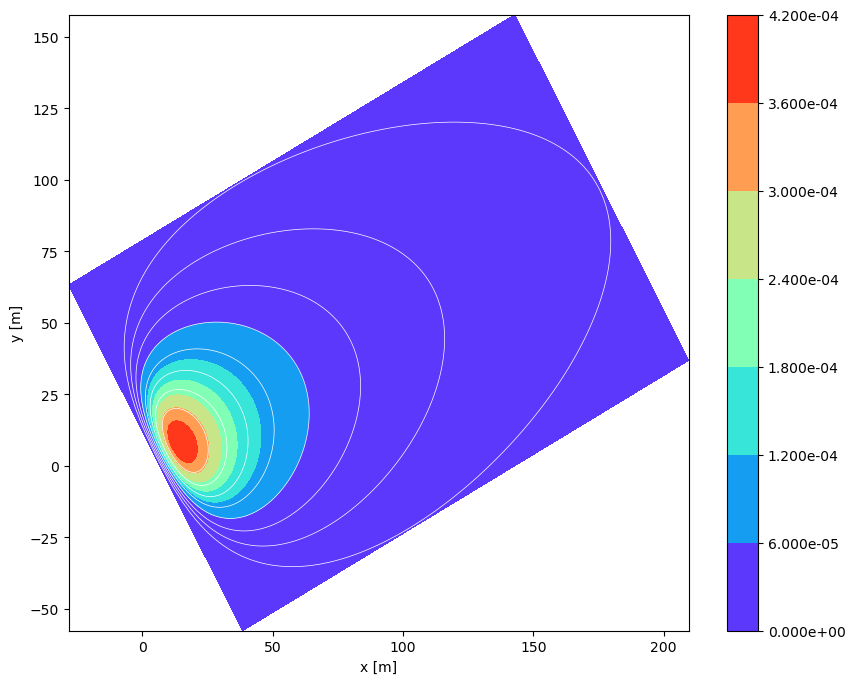

2 0.736283 61.096 1000.0 -0.487257 0.3004048934355098 0.0260297

Error(0009):
 ustar (friction velocity) must be >=0.1.


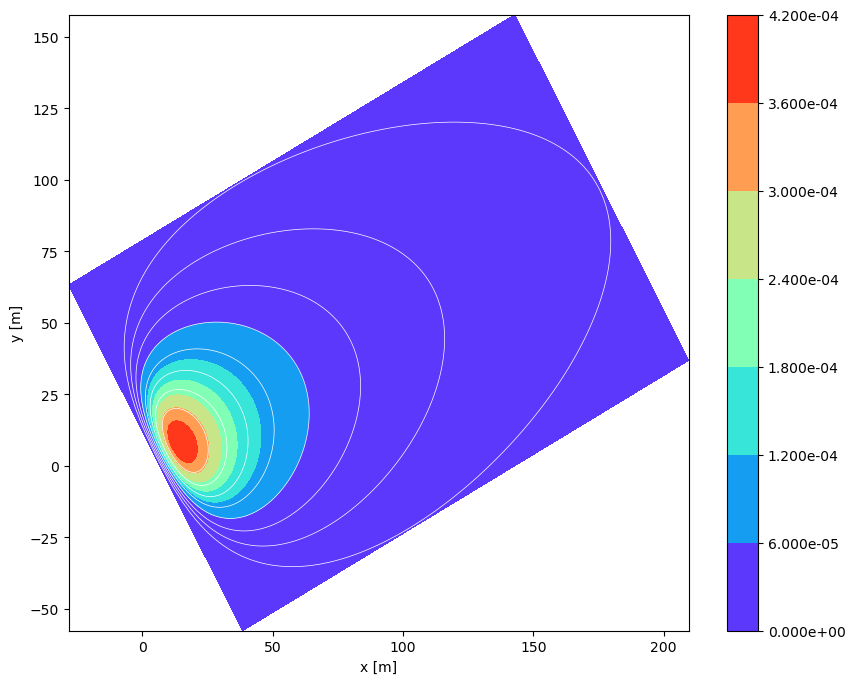

2 0.736283 61.096 1000.0 -0.487257 0.3004048934355098 0.0260297

Error(0009):
 ustar (friction velocity) must be >=0.1.


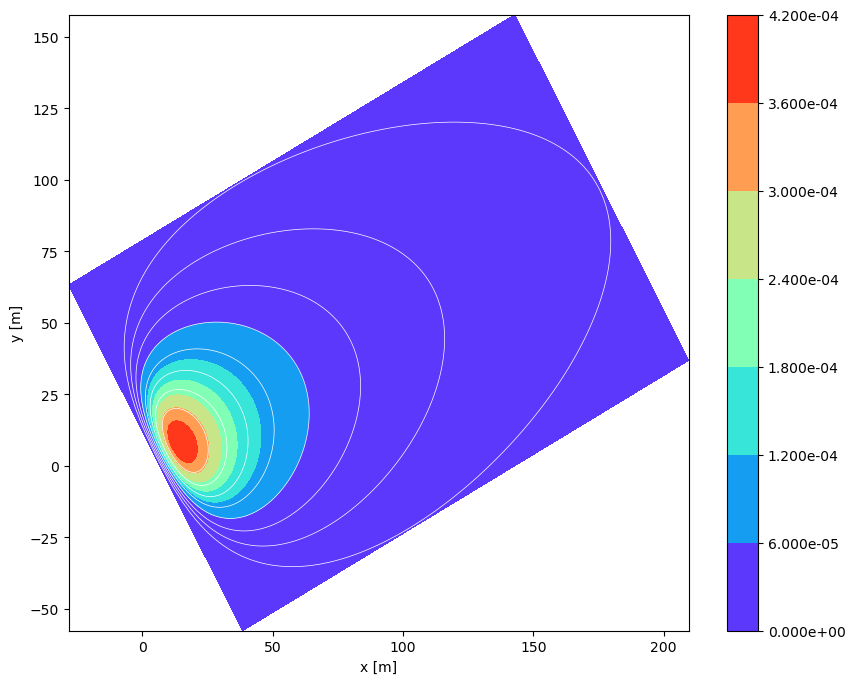

2 0.736283 61.096 1000.0 -0.487257 0.3004048934355098 0.0260297

Error(0009):
 ustar (friction velocity) must be >=0.1.


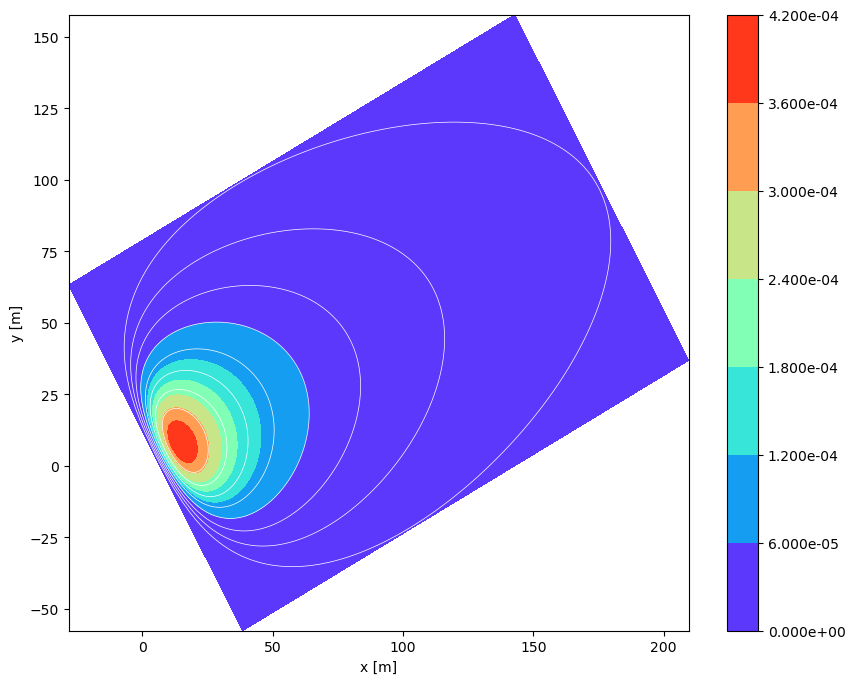

2 0.317636 29.9797 56.7330306453754 34.5317 0.5683121501428594 0.0993164

Error(0009):
 ustar (friction velocity) must be >=0.1.


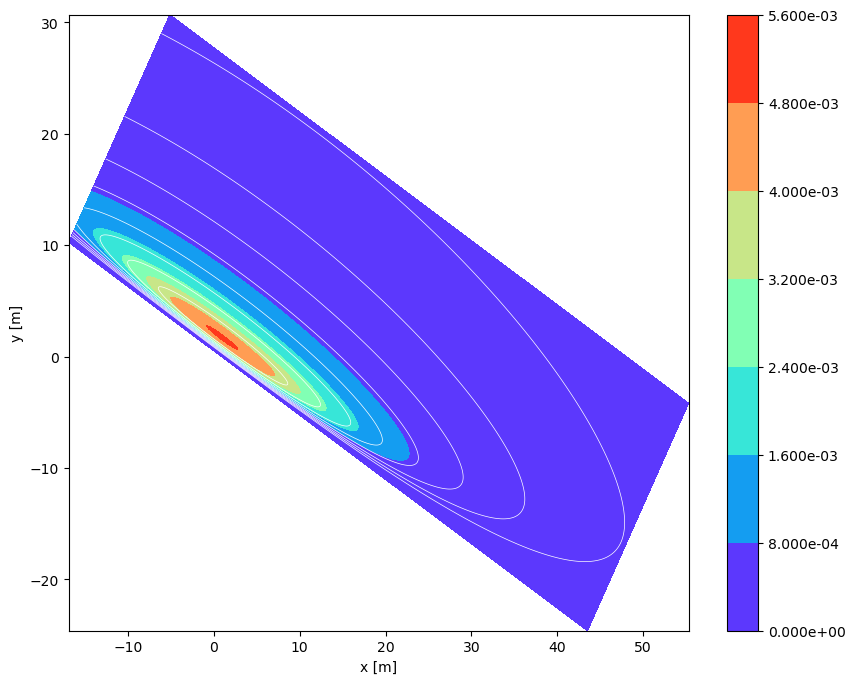

2 0.317636 29.9797 56.7330306453754 34.5317 0.5683121501428594 0.0993164

Error(0009):
 ustar (friction velocity) must be >=0.1.


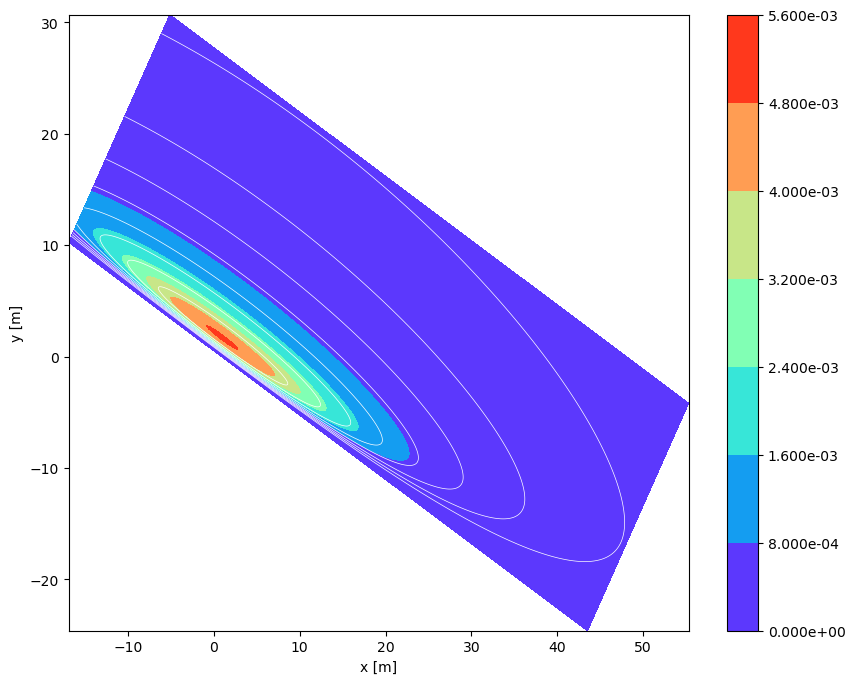

2 0.317636 29.9797 56.7330306453754 34.5317 0.5683121501428594 0.0993164

Error(0009):
 ustar (friction velocity) must be >=0.1.


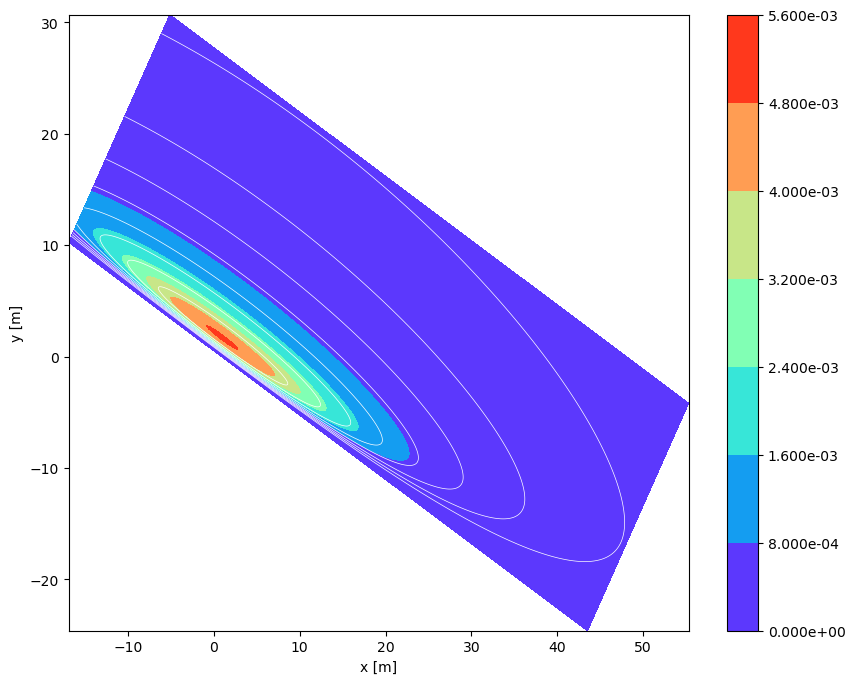

2 0.317636 29.9797 56.7330306453754 34.5317 0.5683121501428594 0.0993164

Error(0009):
 ustar (friction velocity) must be >=0.1.


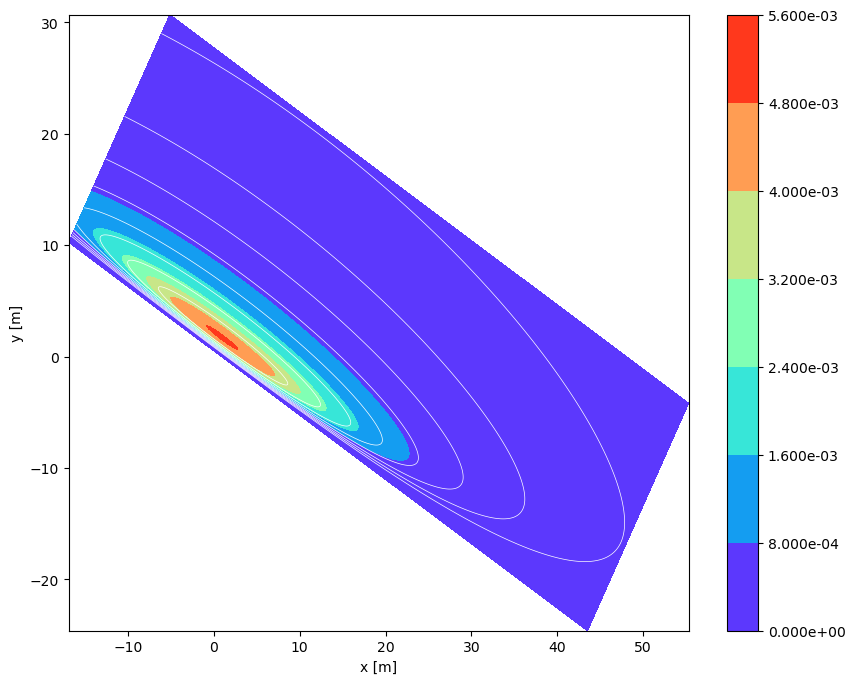

2 2.72838 87.3869 1000.0 -17.9518 1.4316420642045973 0.330018


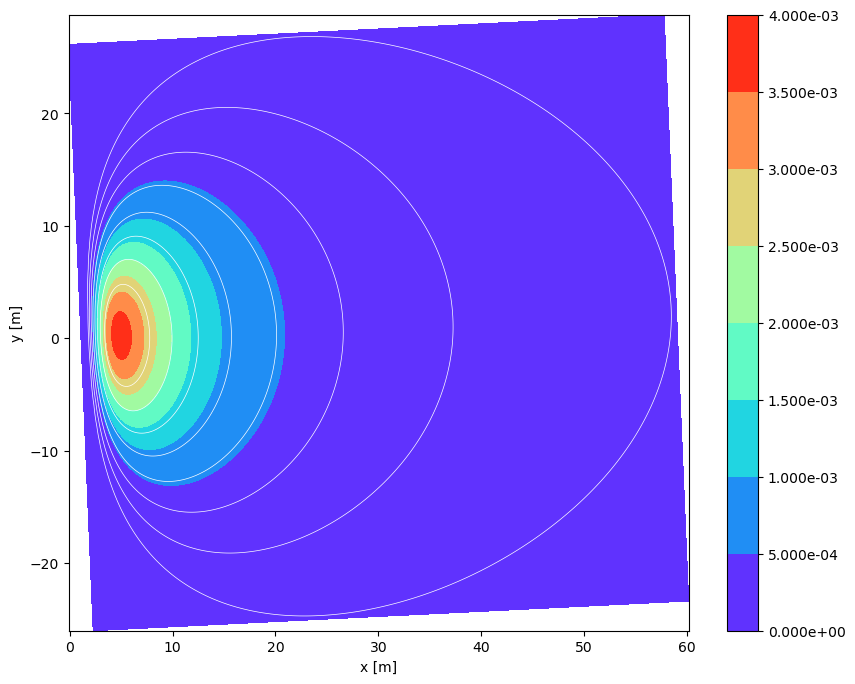

2 2.72838 87.3869 1000.0 -17.9518 1.4316420642045973 0.330018


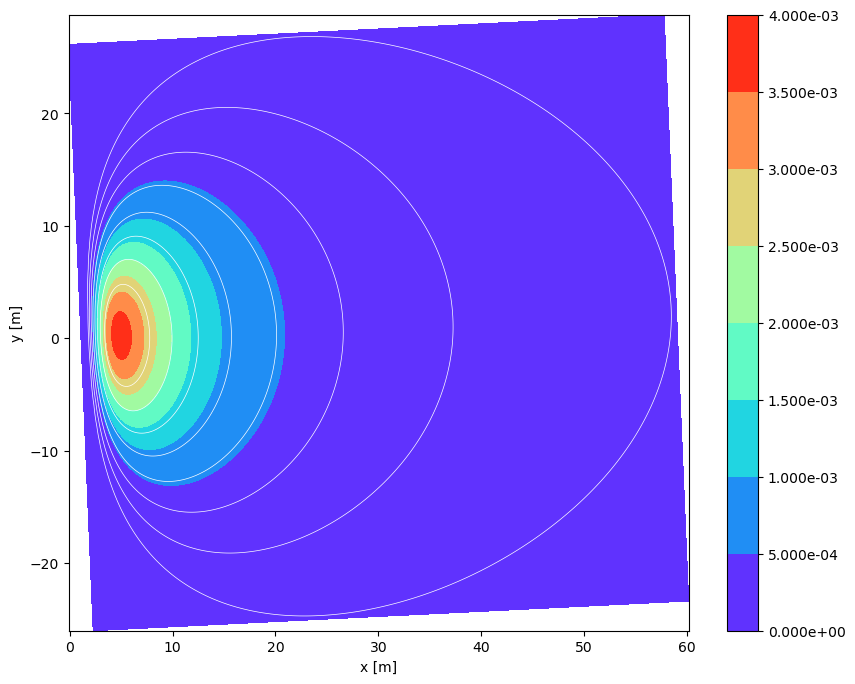

2 2.72838 87.3869 1000.0 -17.9518 1.4316420642045973 0.330018


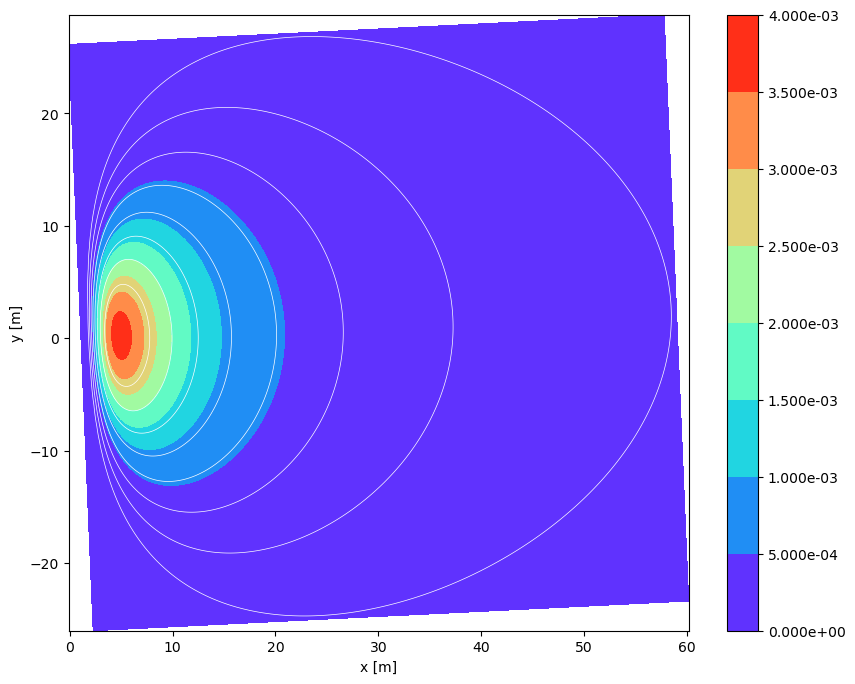

2 2.72838 87.3869 1000.0 -17.9518 1.4316420642045973 0.330018


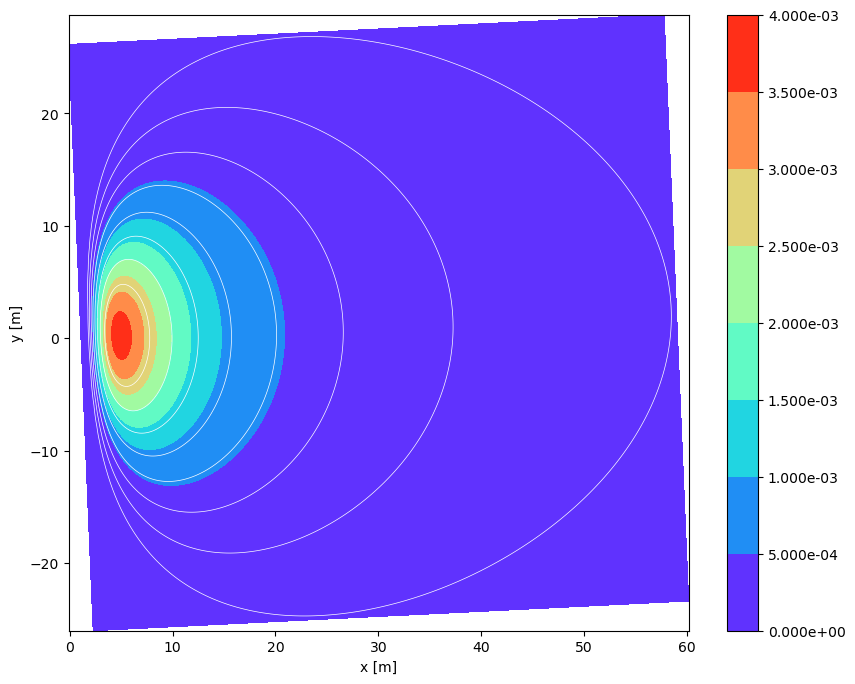

2 2.72838 87.3869 1000.0 -17.9518 1.4316420642045973 0.330018


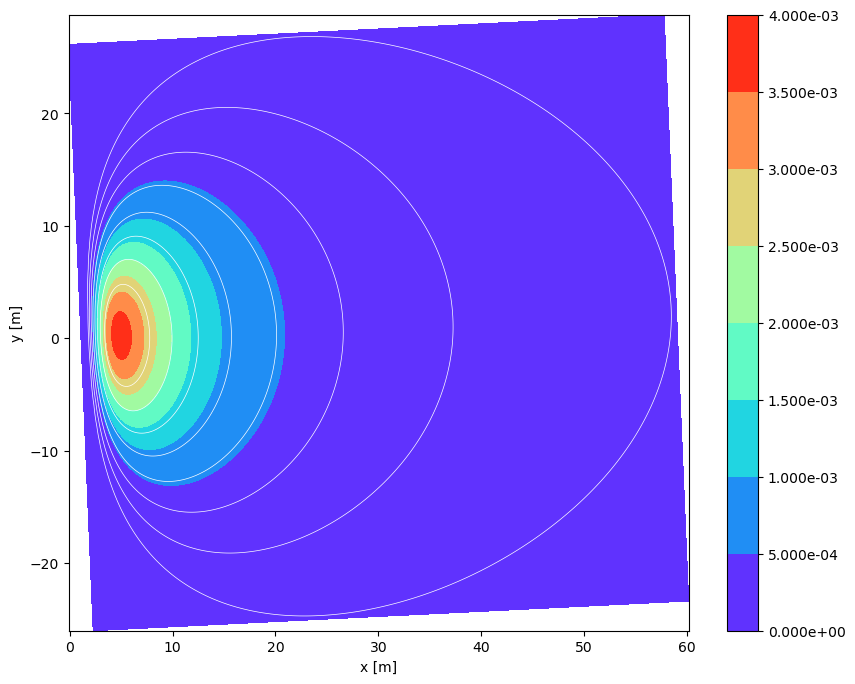

2 1.64211 102.439 1000.0 -12.5862 1.3338009596637723 0.250754


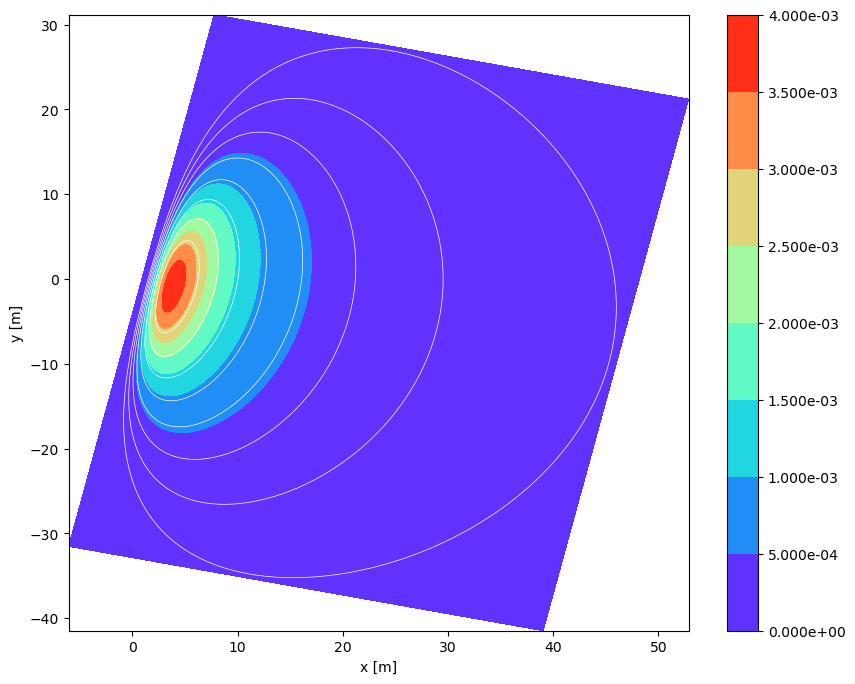

2 1.64211 102.439 1000.0 -12.5862 1.3338009596637723 0.250754


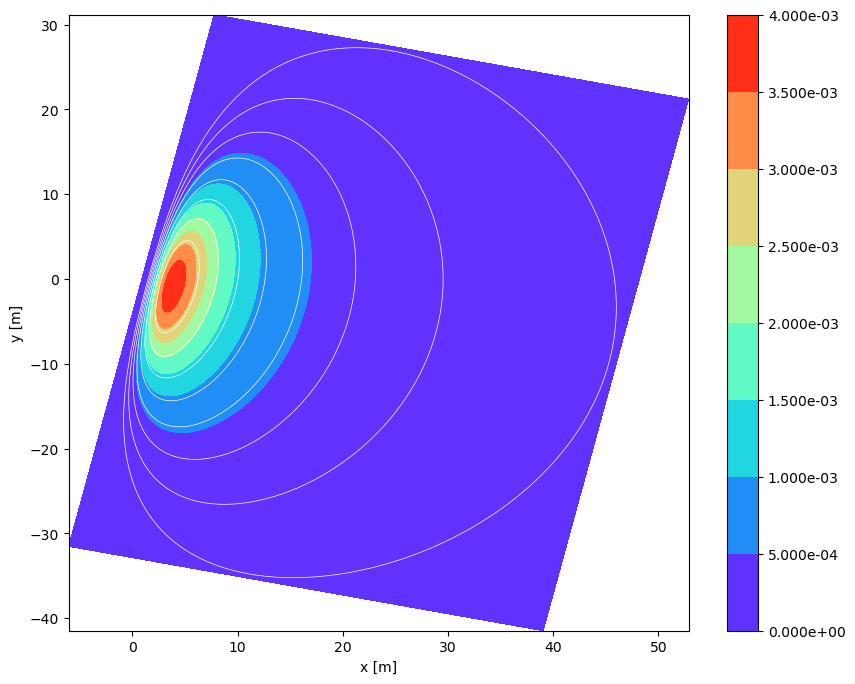

2 1.64211 102.439 1000.0 -12.5862 1.3338009596637723 0.250754


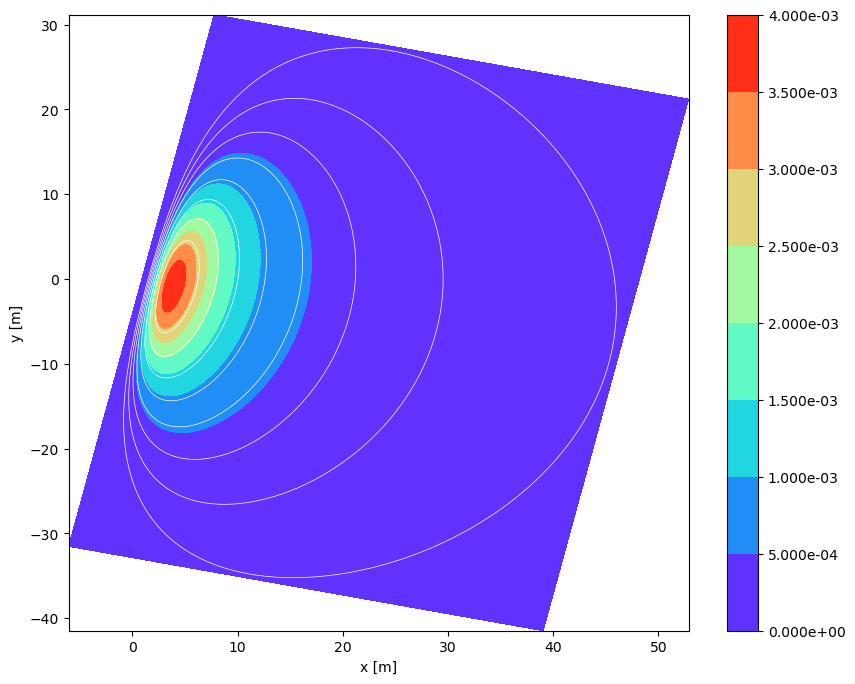

2 1.64211 102.439 1000.0 -12.5862 1.3338009596637723 0.250754


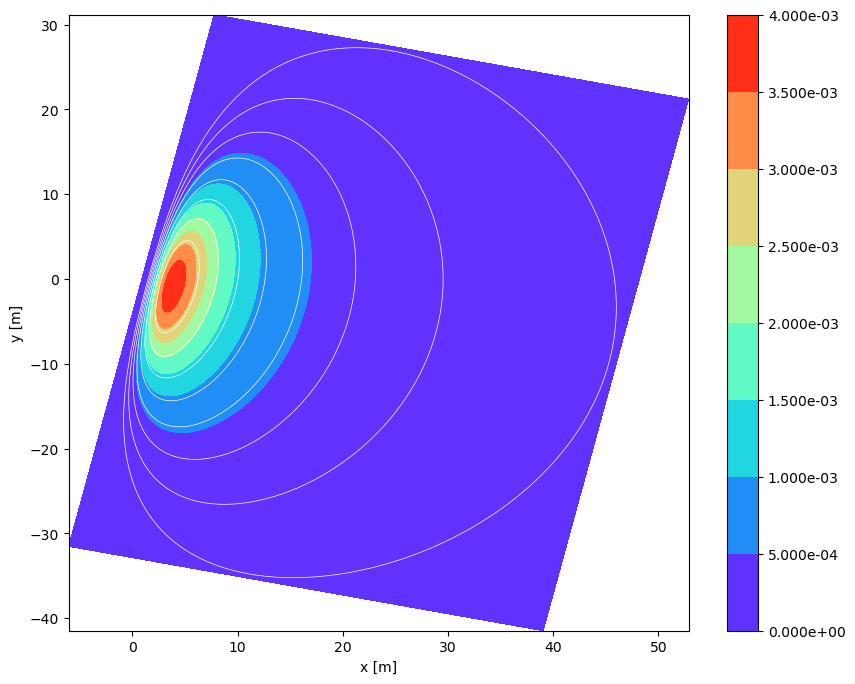

2 2.15263 94.0452 434.7545807545843 2767.89 0.7099176008523806 0.239766


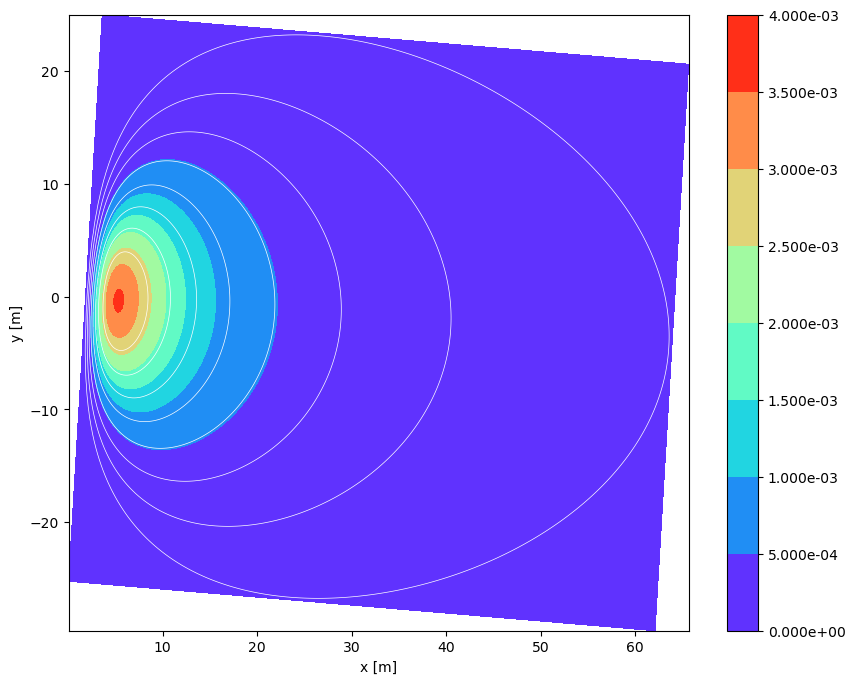

2 2.15263 94.0452 434.7545807545843 2767.89 0.7099176008523806 0.239766


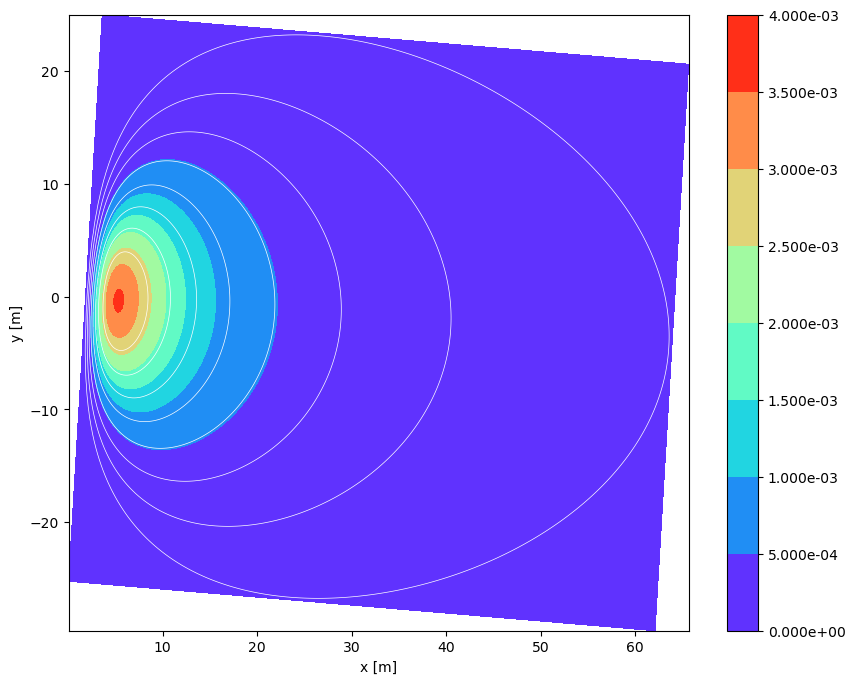

2 2.15263 94.0452 434.7545807545843 2767.89 0.7099176008523806 0.239766


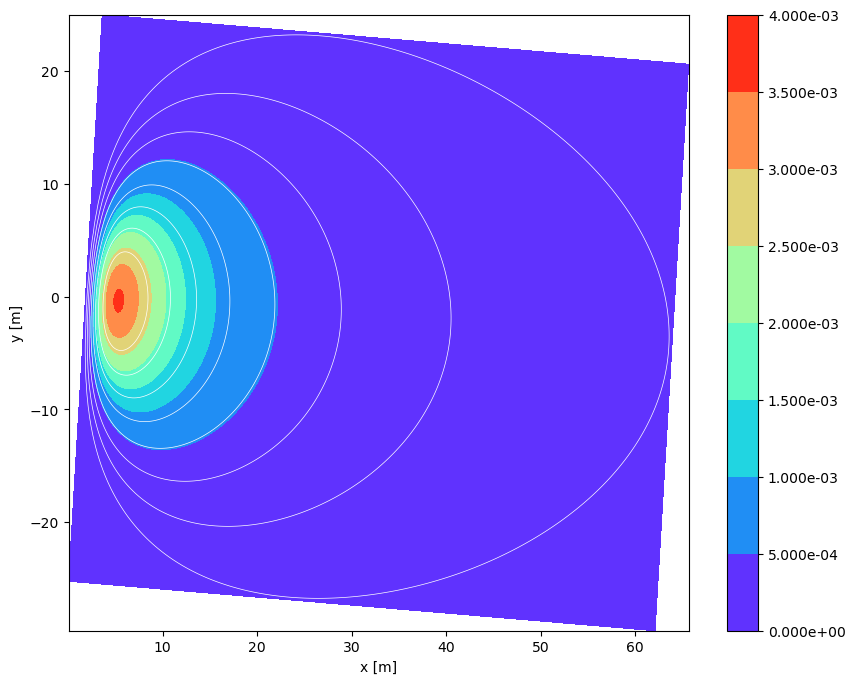

2 2.15263 94.0452 434.7545807545843 2767.89 0.7099176008523806 0.239766


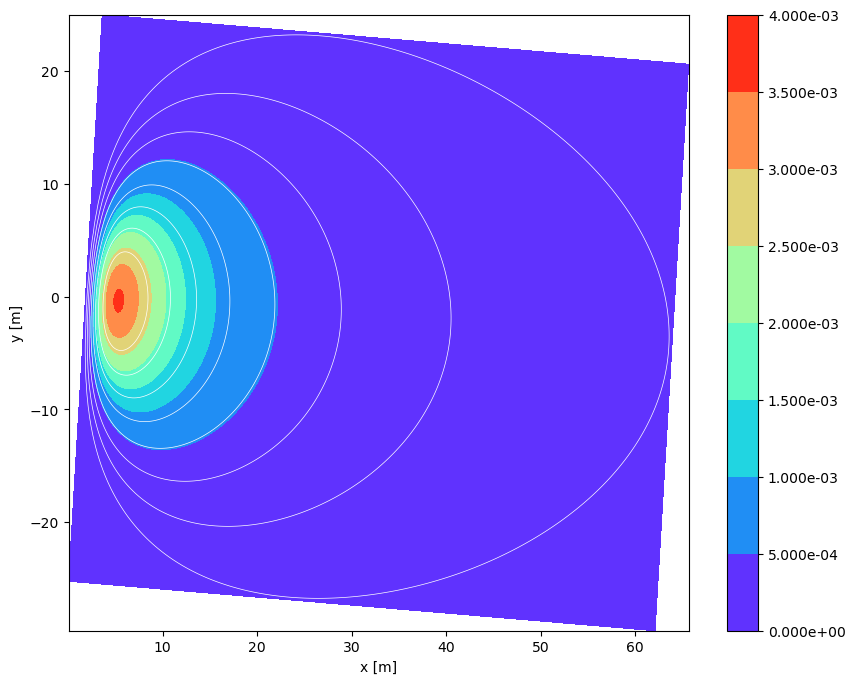

2 1.12752 84.4685 10.85167804615887 2.23607 0.48358597994565555 0.0471088

Error(0009):
 ustar (friction velocity) must be >=0.1.


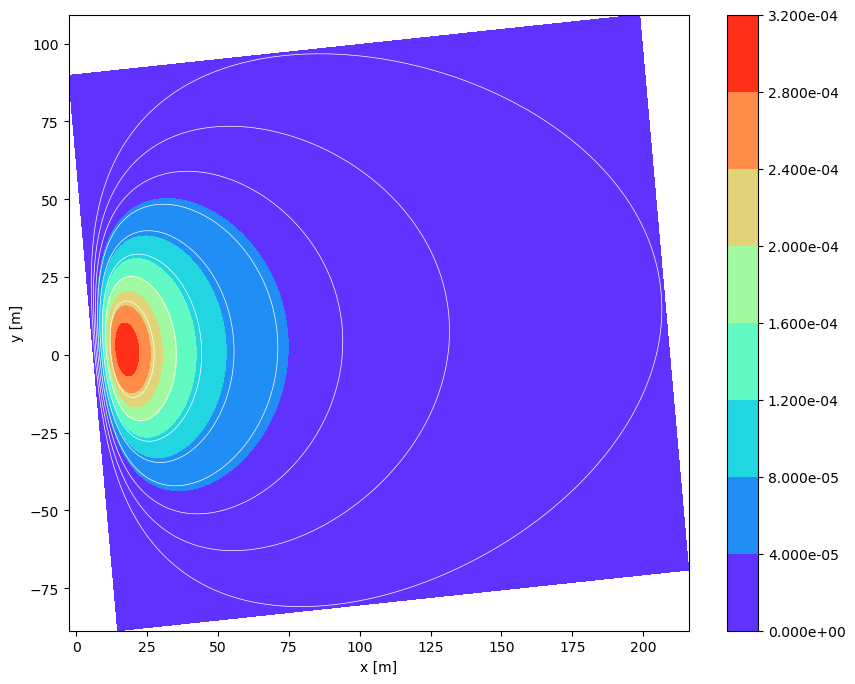

2 1.12752 84.4685 10.85167804615887 2.23607 0.48358597994565555 0.0471088

Error(0009):
 ustar (friction velocity) must be >=0.1.


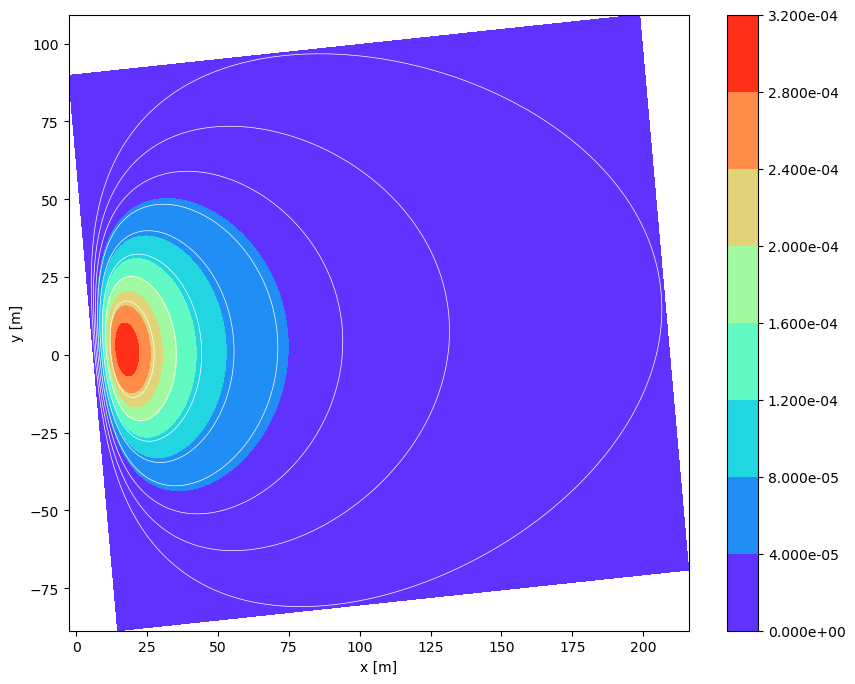

2 1.12752 84.4685 10.85167804615887 2.23607 0.48358597994565555 0.0471088

Error(0009):
 ustar (friction velocity) must be >=0.1.


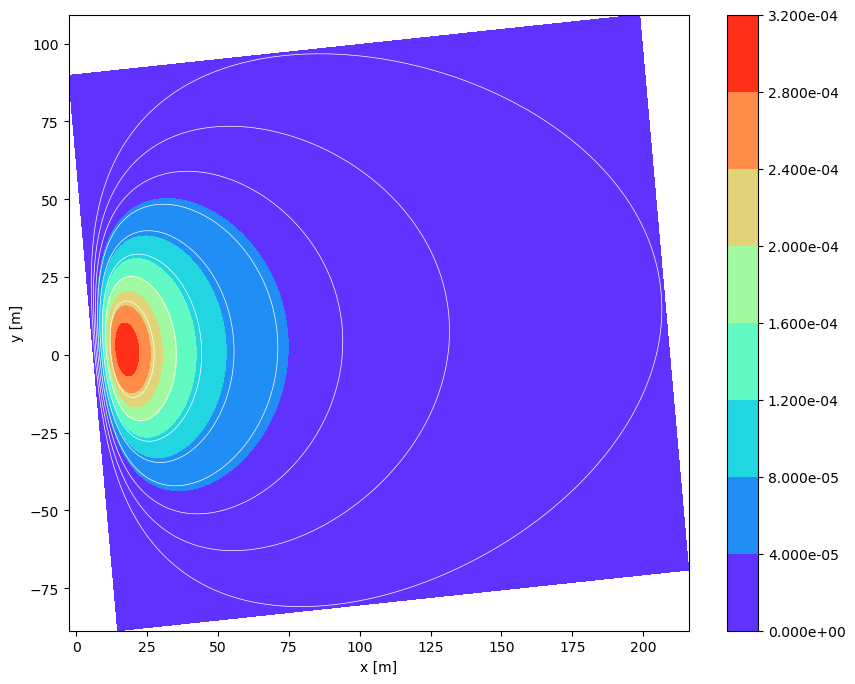

2 1.12752 84.4685 10.85167804615887 2.23607 0.48358597994565555 0.0471088

Error(0009):
 ustar (friction velocity) must be >=0.1.


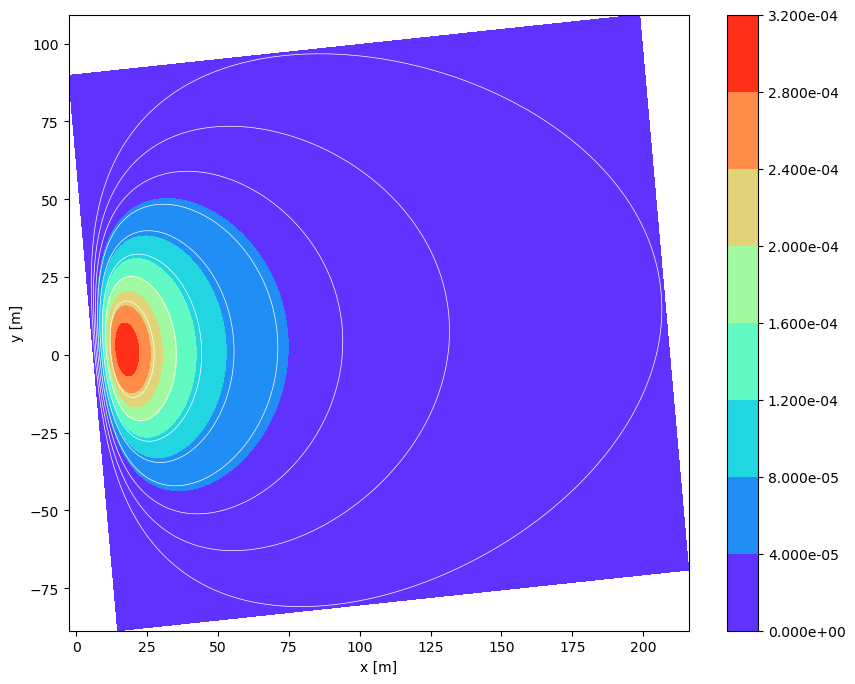

2 0.990958 274.758 1000.0 -36.9184 0.5318550554427399 0.0980518

Error(0009):
 ustar (friction velocity) must be >=0.1.


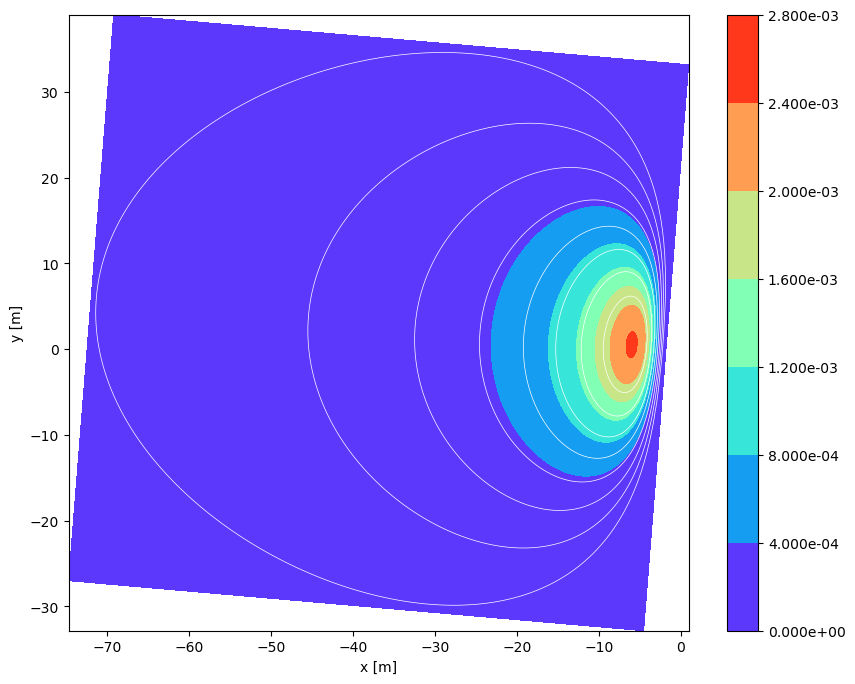

2 0.990958 274.758 1000.0 -36.9184 0.5318550554427399 0.0980518

Error(0009):
 ustar (friction velocity) must be >=0.1.


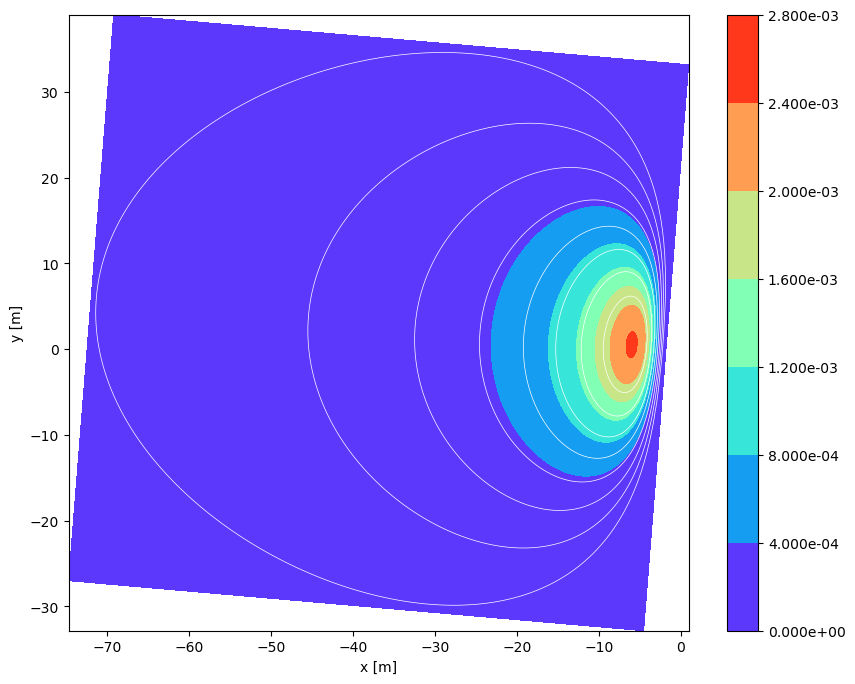

2 0.762735 79.9669 15.732903410932114 4.24687 0.21967851510787303 0.0537179

Error(0009):
 ustar (friction velocity) must be >=0.1.


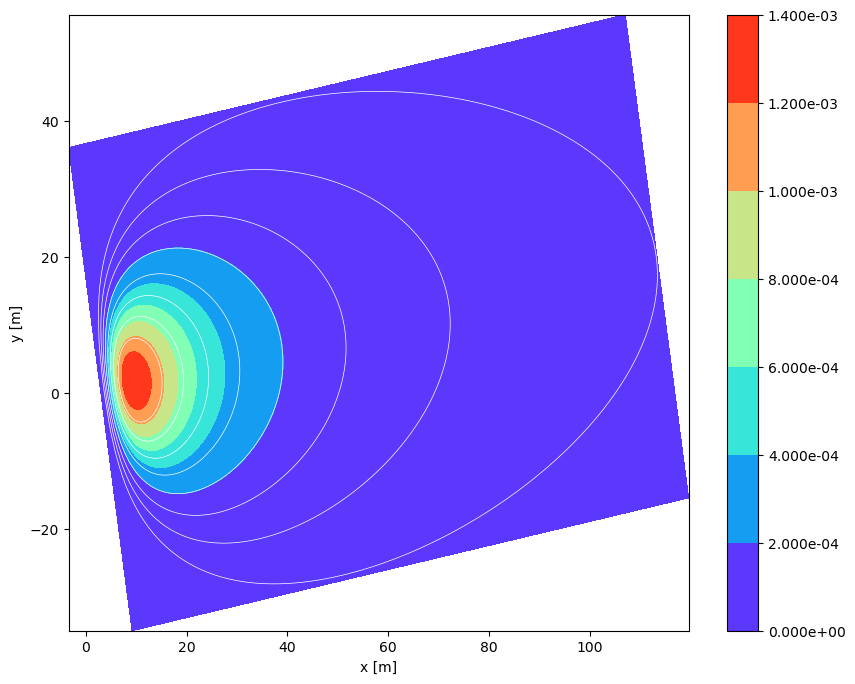

2 0.762735 79.9669 15.732903410932114 4.24687 0.21967851510787303 0.0537179

Error(0009):
 ustar (friction velocity) must be >=0.1.


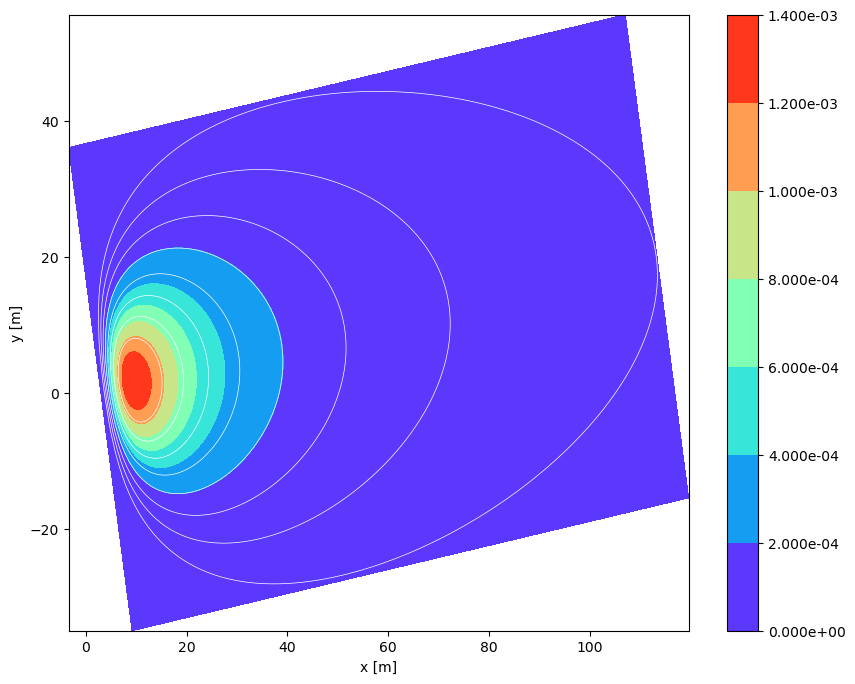

2 2.57567 177.729 1000.0 -36.8063 2.123694893340378 0.357258


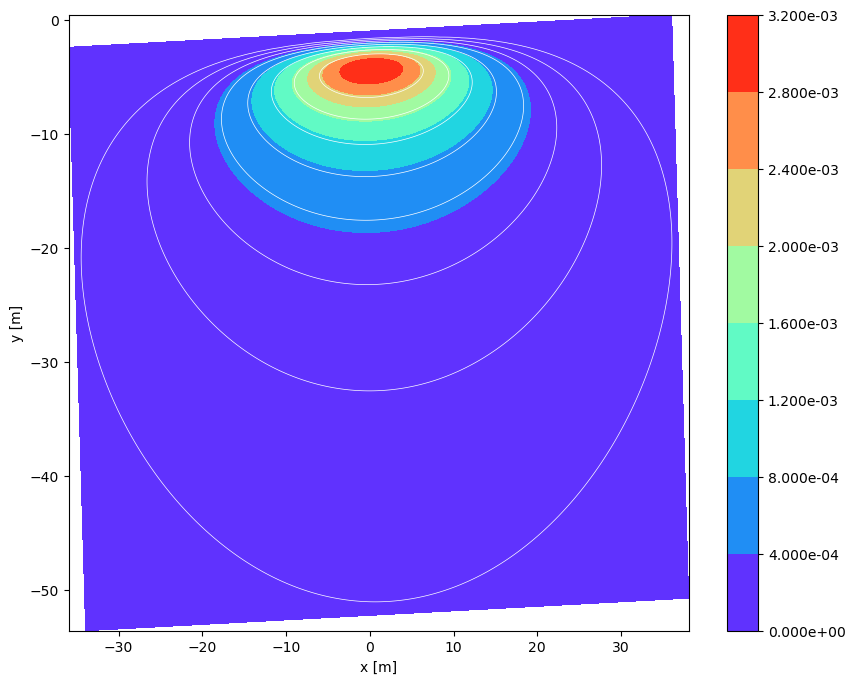

2 2.57567 177.729 1000.0 -36.8063 2.123694893340378 0.357258


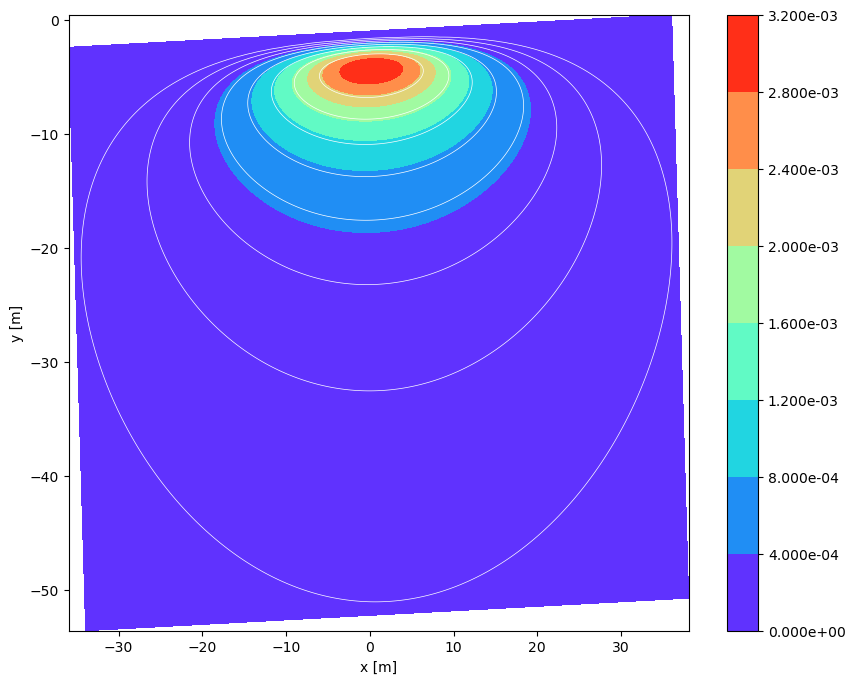

2 2.57567 177.729 1000.0 -36.8063 2.123694893340378 0.357258


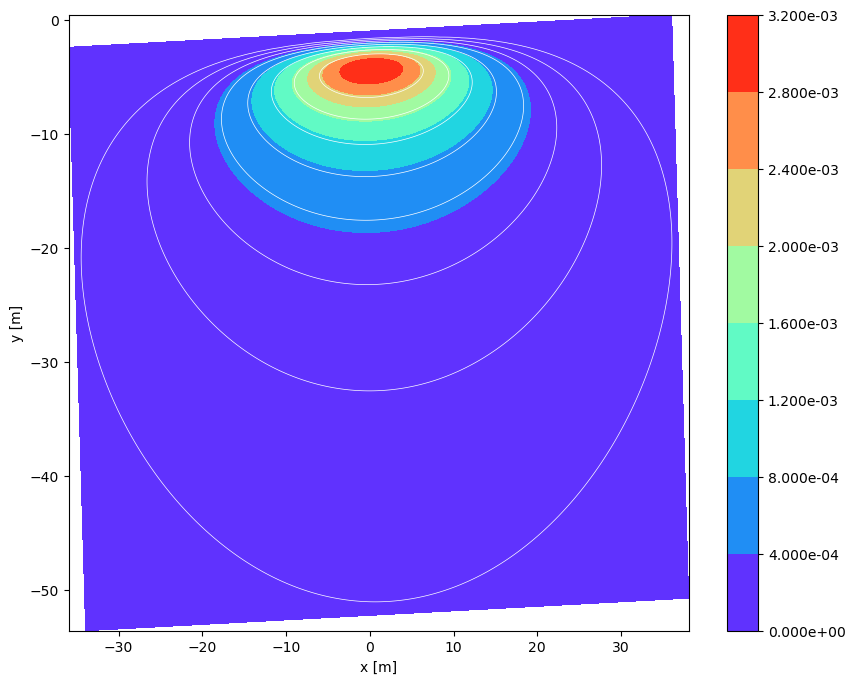

2 2.19776 183.604 1000.0 -37.5925 1.6698353212218262 0.365157


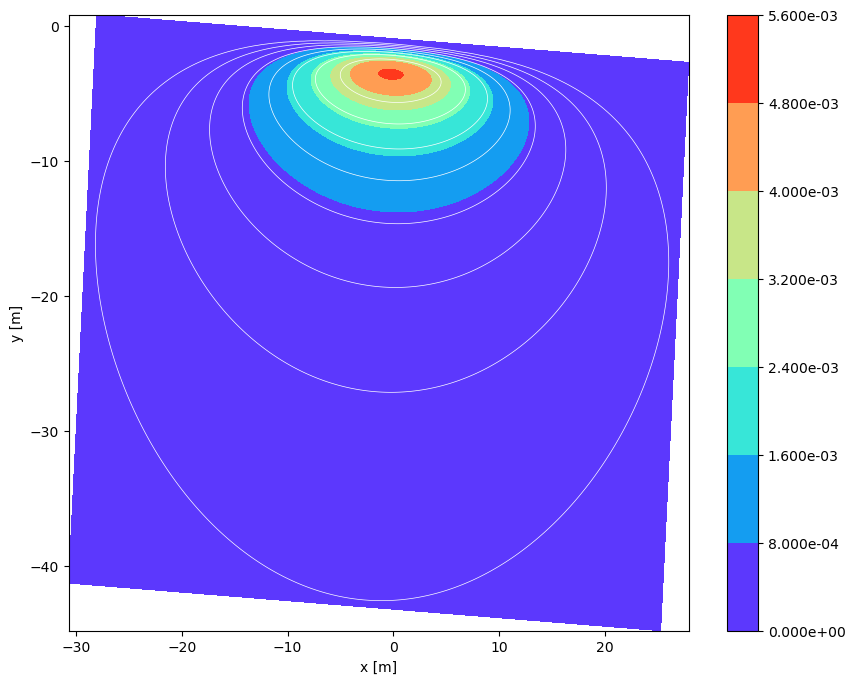

2 2.19776 183.604 1000.0 -37.5925 1.6698353212218262 0.365157


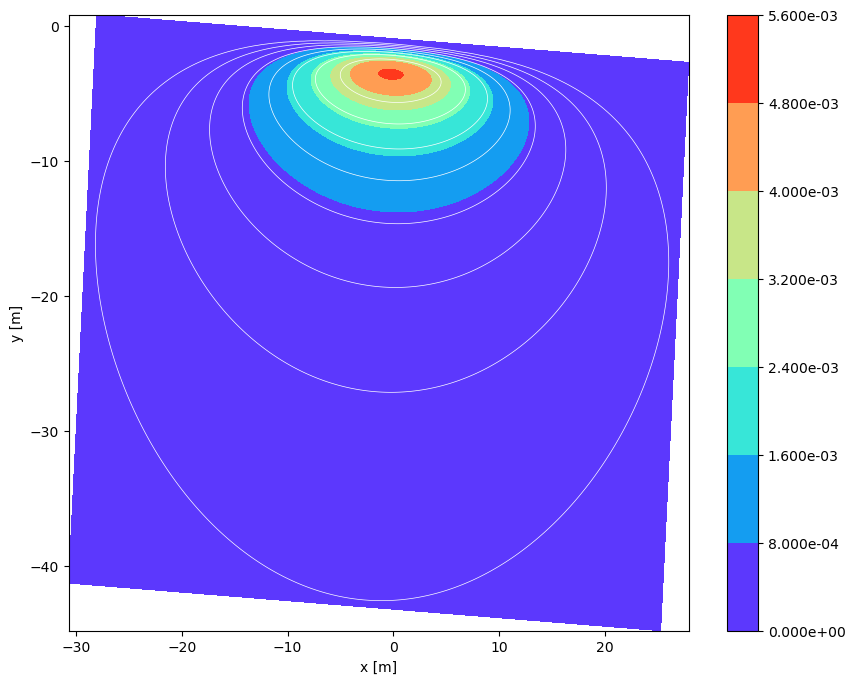

2 1.78849 201.449 1000.0 -21.1122 1.431024108811588 0.268102


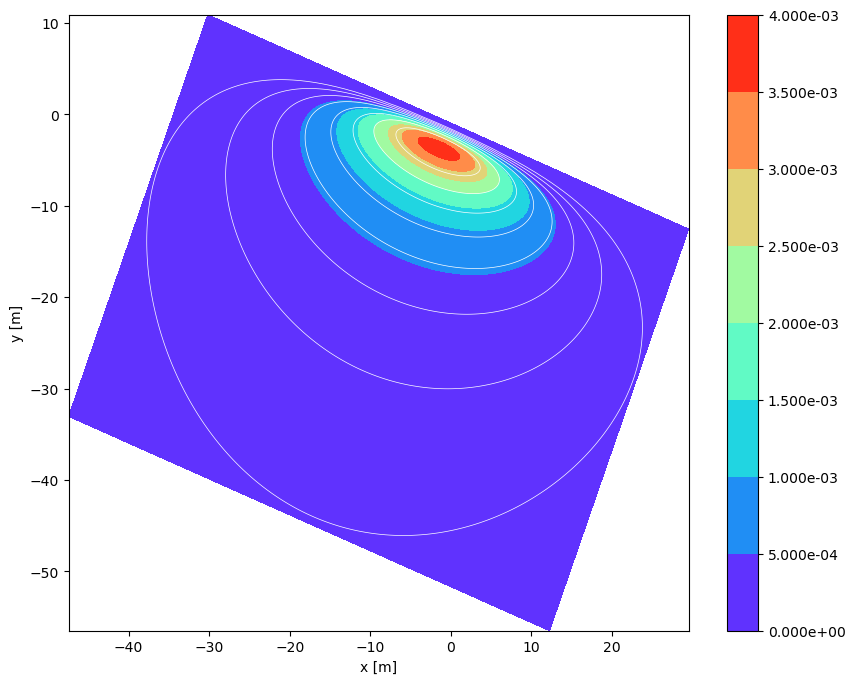

2 1.78849 201.449 1000.0 -21.1122 1.431024108811588 0.268102


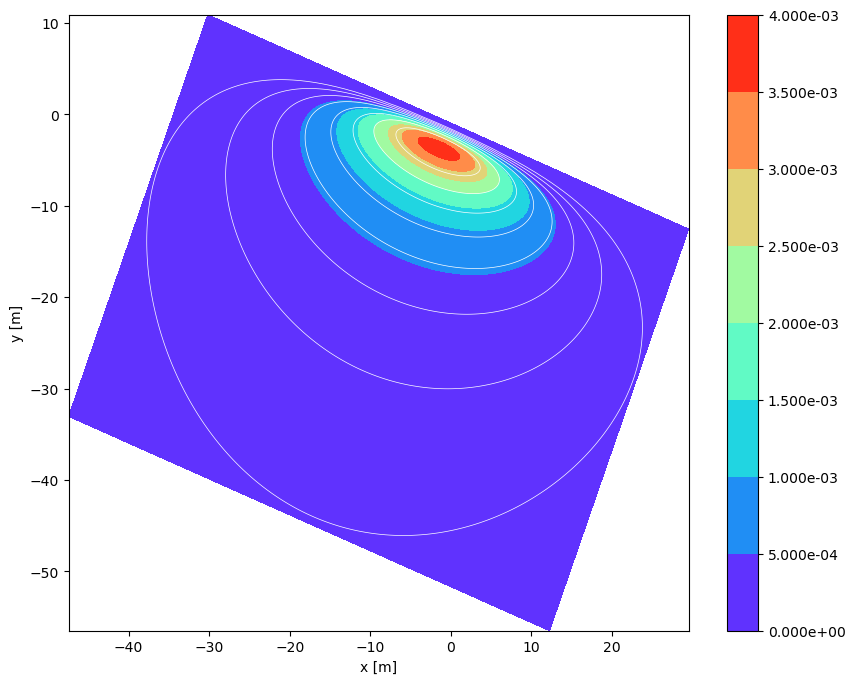

2 4.71603 318.62 911.4583152164953 8167.16 1.6213420367090963 0.469221


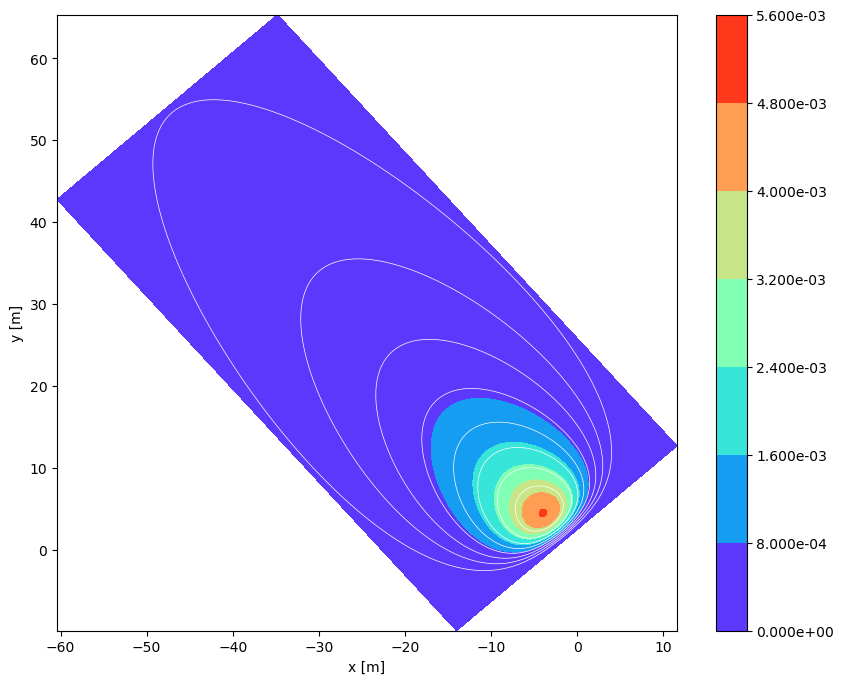

2 4.71603 318.62 911.4583152164953 8167.16 1.6213420367090963 0.469221


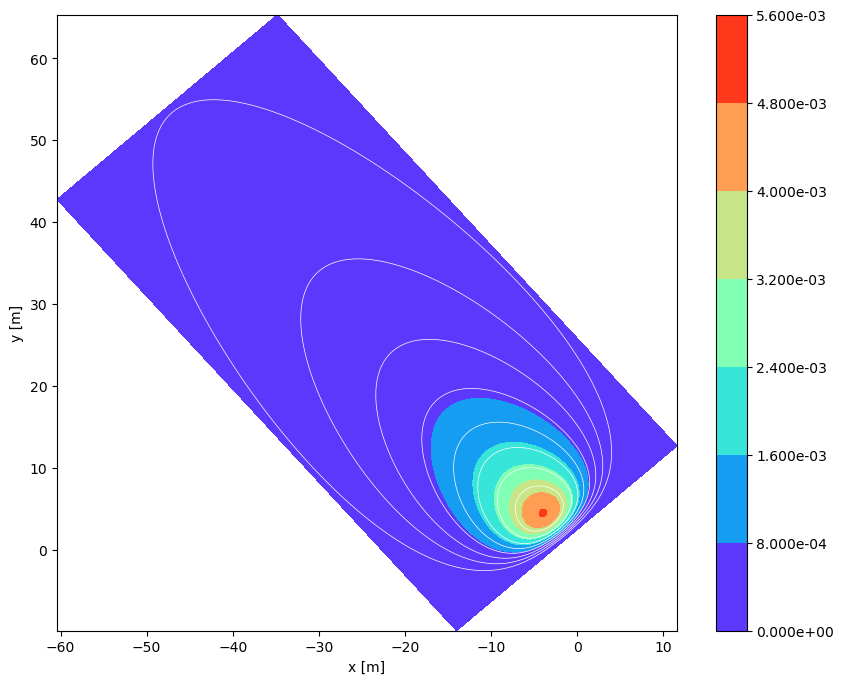

2 4.71603 318.62 911.4583152164953 8167.16 1.6213420367090963 0.469221


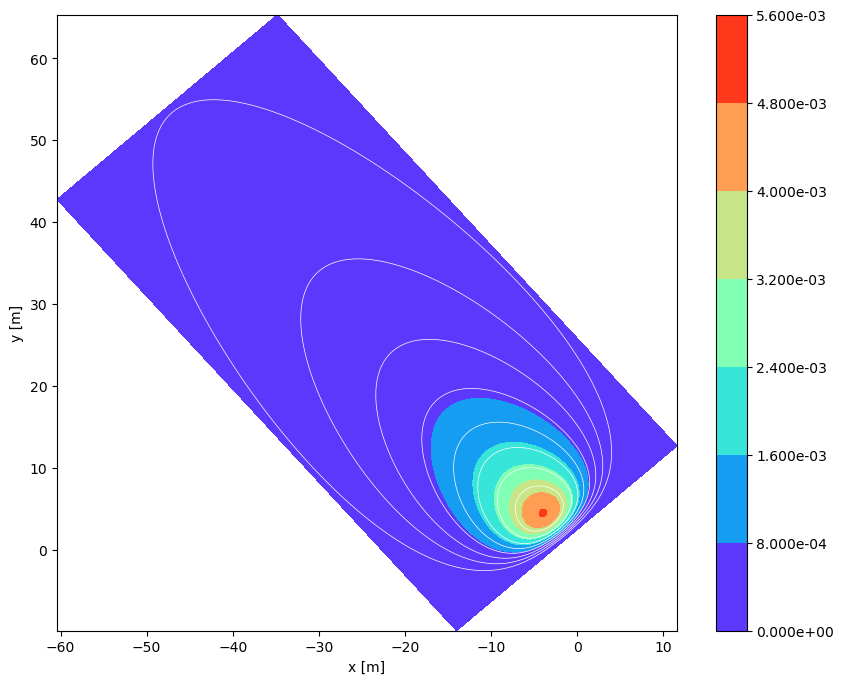

2 4.71603 318.62 911.4583152164953 8167.16 1.6213420367090963 0.469221


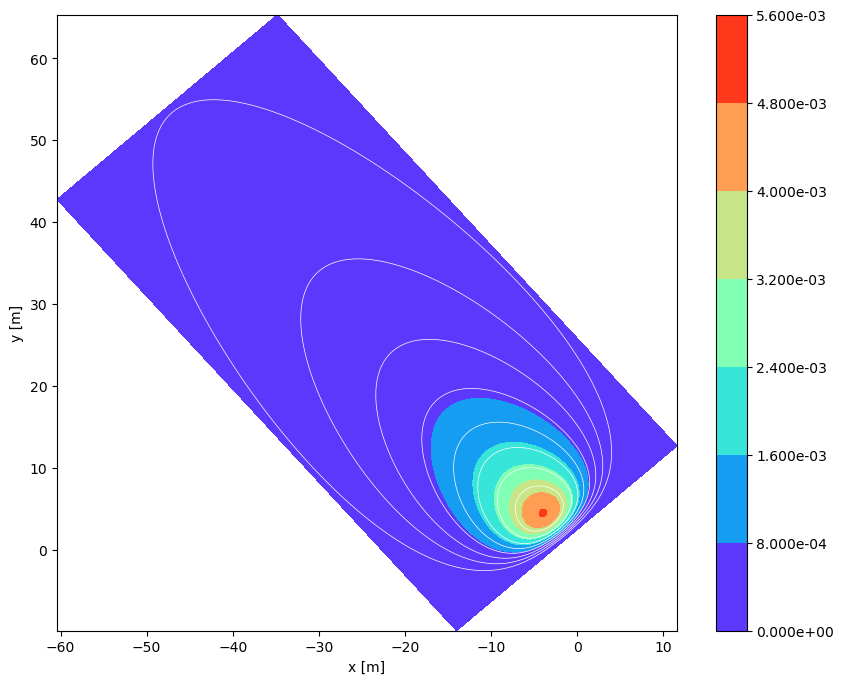

2 2.66393 339.036 194.6961962238434 158.904 0.9712553732155103 0.275207


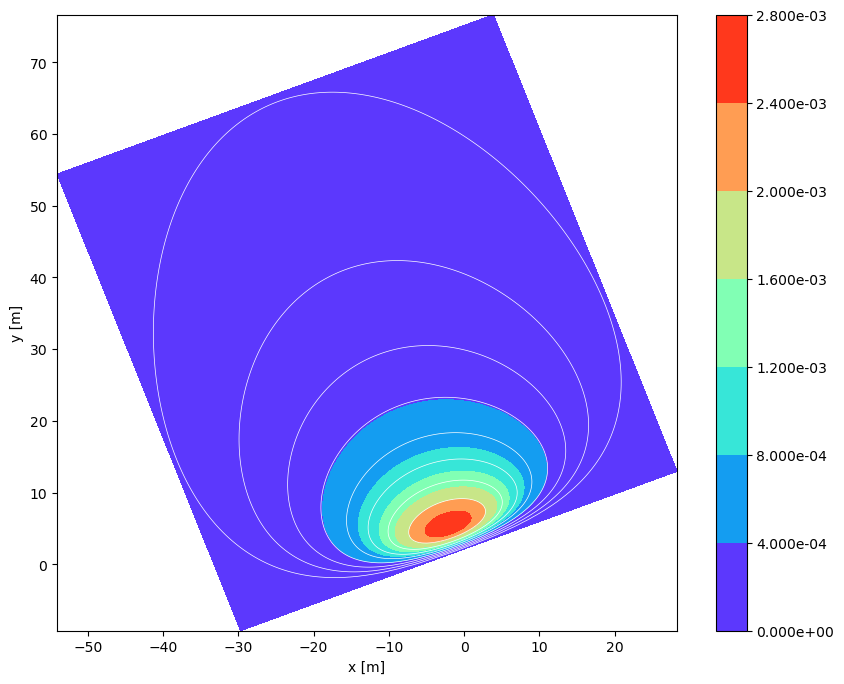

2 2.66393 339.036 194.6961962238434 158.904 0.9712553732155103 0.275207


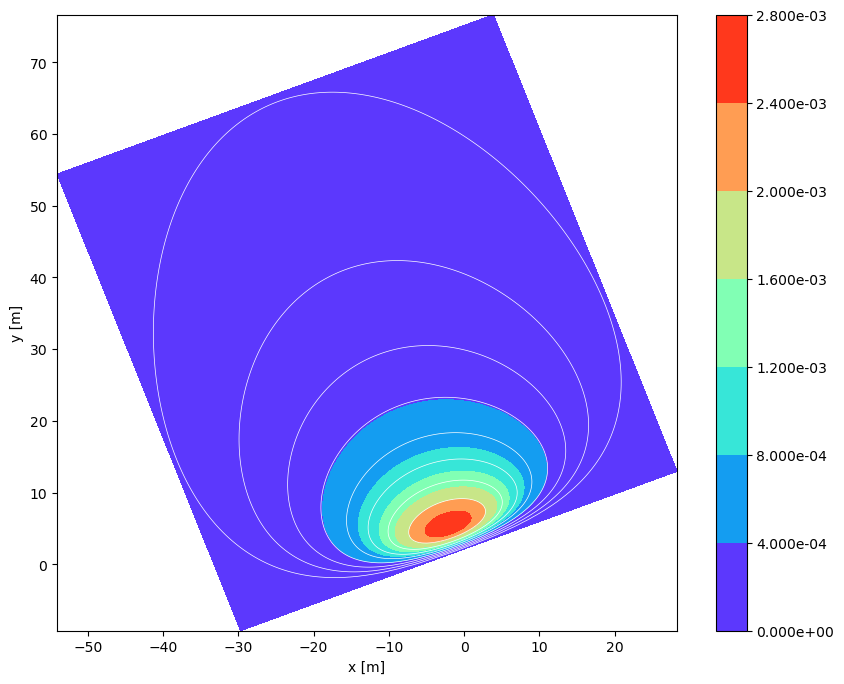

2 2.48511 320.258 102.11227485677057 50.6986 0.8339286540226328 0.209344


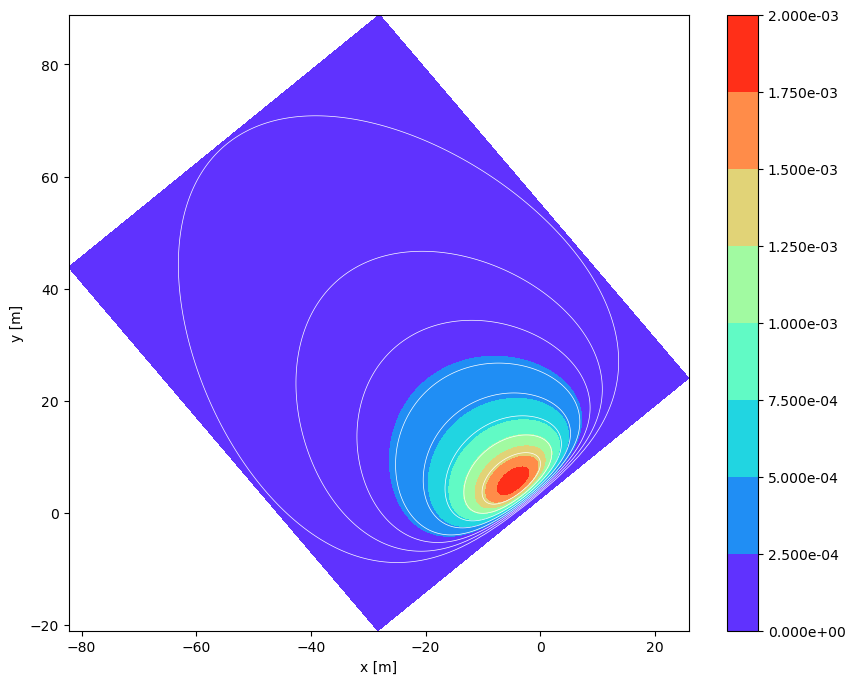

2 2.48511 320.258 102.11227485677057 50.6986 0.8339286540226328 0.209344


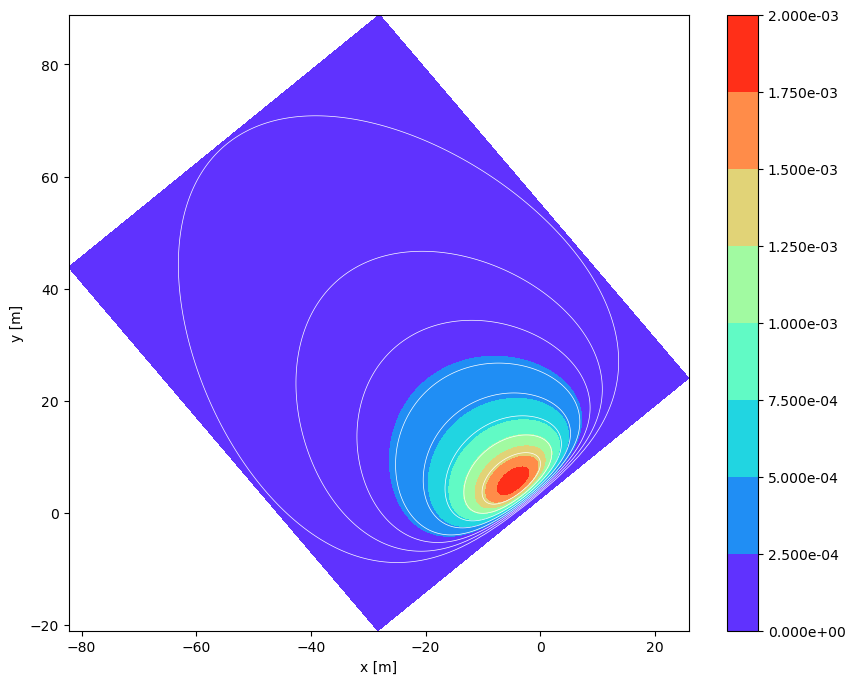

2 1.44216 318.149 286.8862363167907 1022.33 1.3572022693762342 0.186821


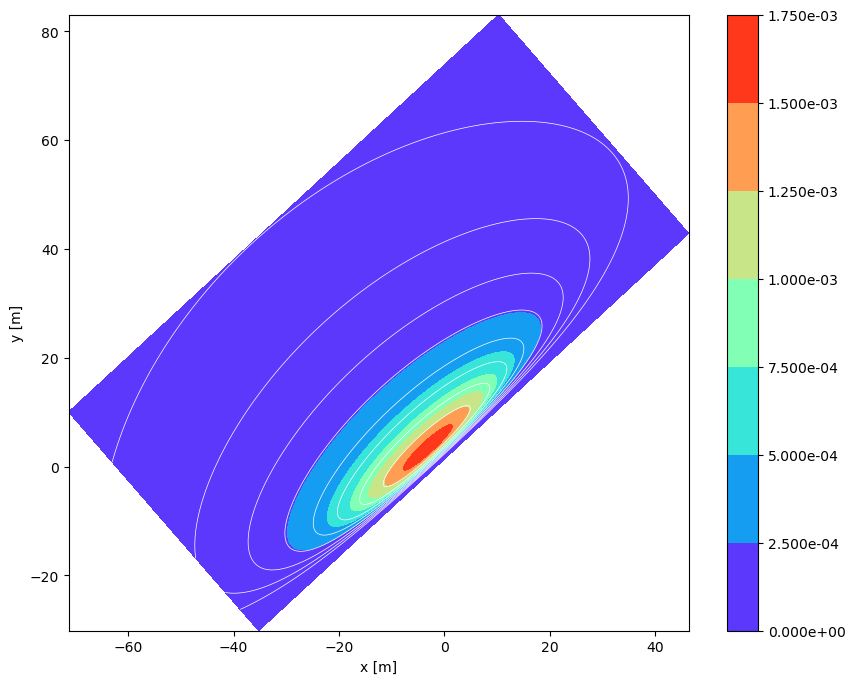

2 1.44216 318.149 286.8862363167907 1022.33 1.3572022693762342 0.186821


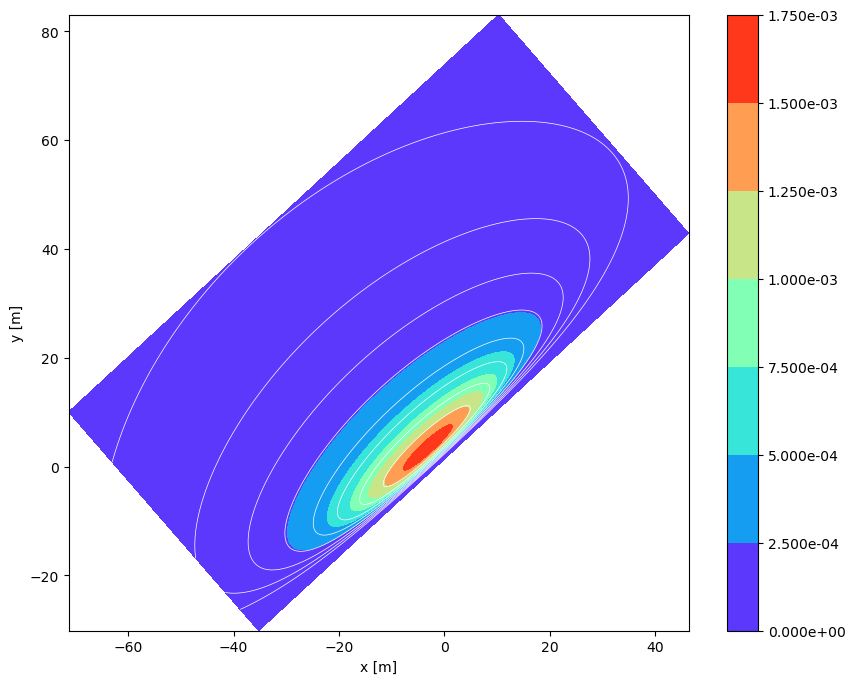

2 1.44216 318.149 286.8862363167907 1022.33 1.3572022693762342 0.186821


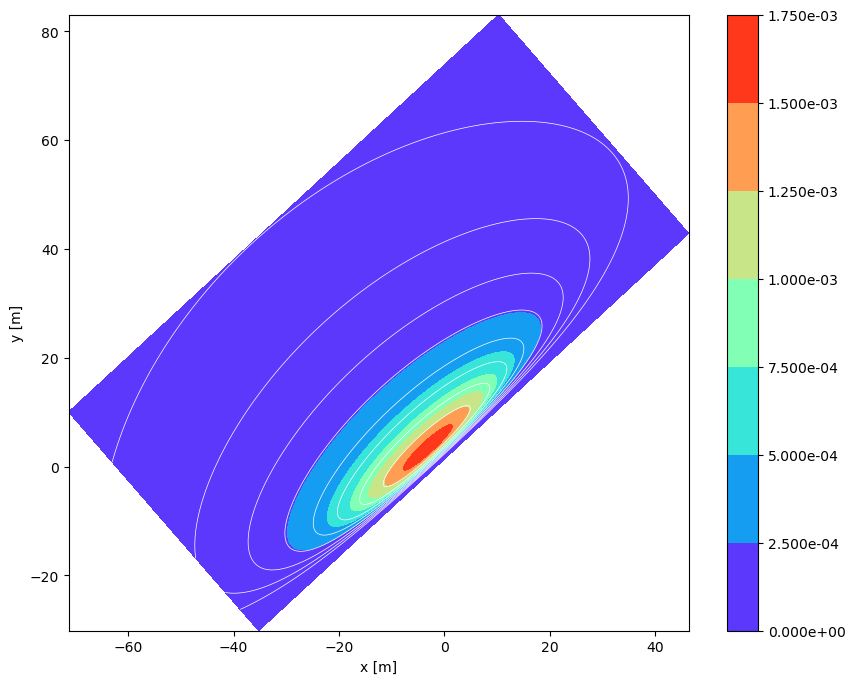

2 1.44216 318.149 286.8862363167907 1022.33 1.3572022693762342 0.186821


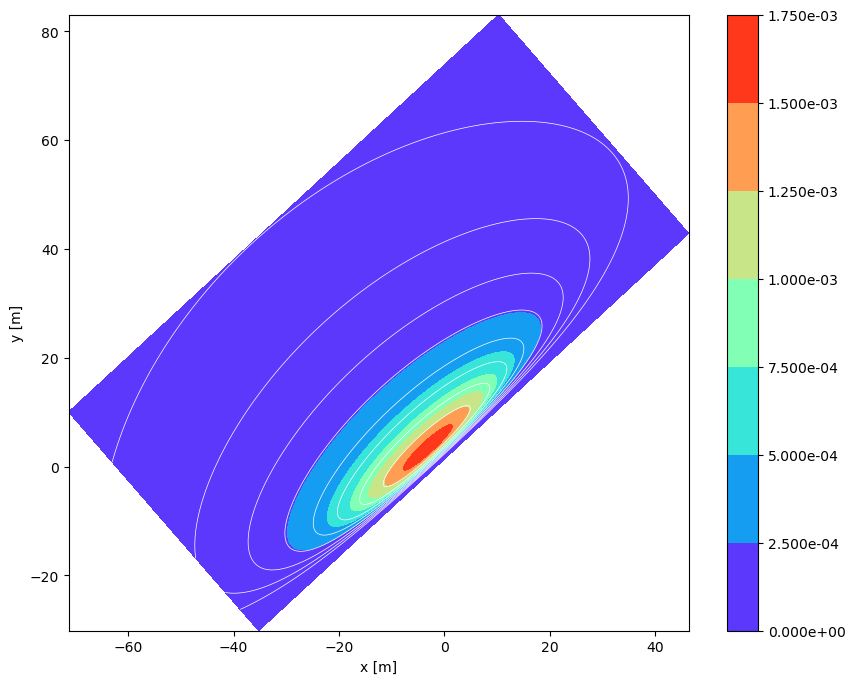

2 4.05577 158.805 1000.0 -108.297 1.540856904452844 0.471133


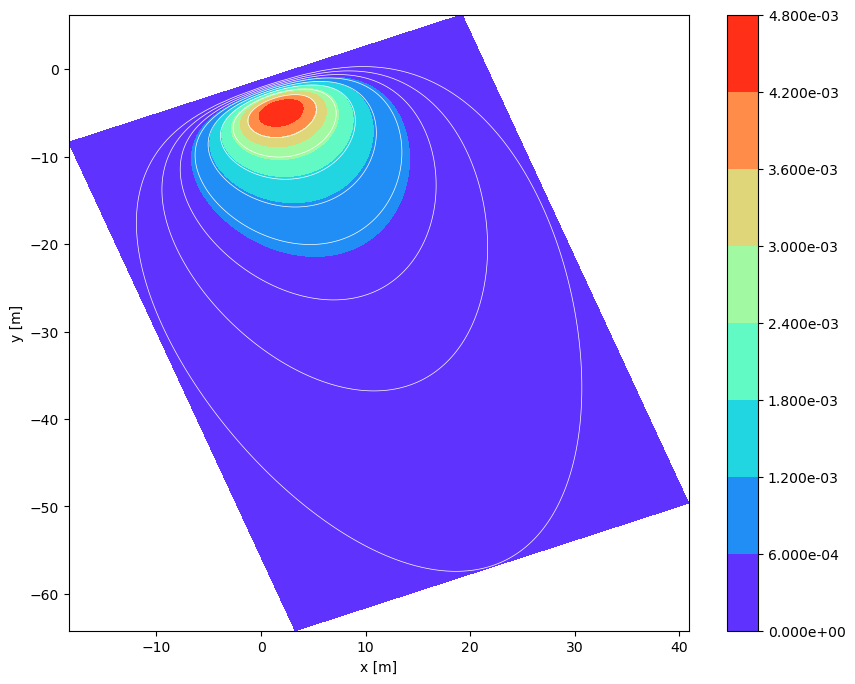

2 4.05577 158.805 1000.0 -108.297 1.540856904452844 0.471133


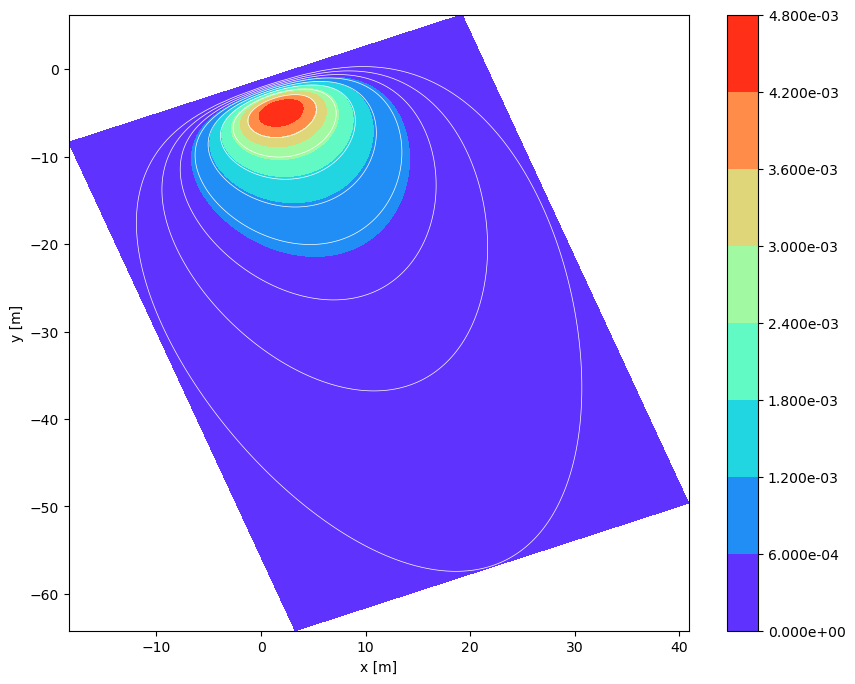

2 4.05577 158.805 1000.0 -108.297 1.540856904452844 0.471133


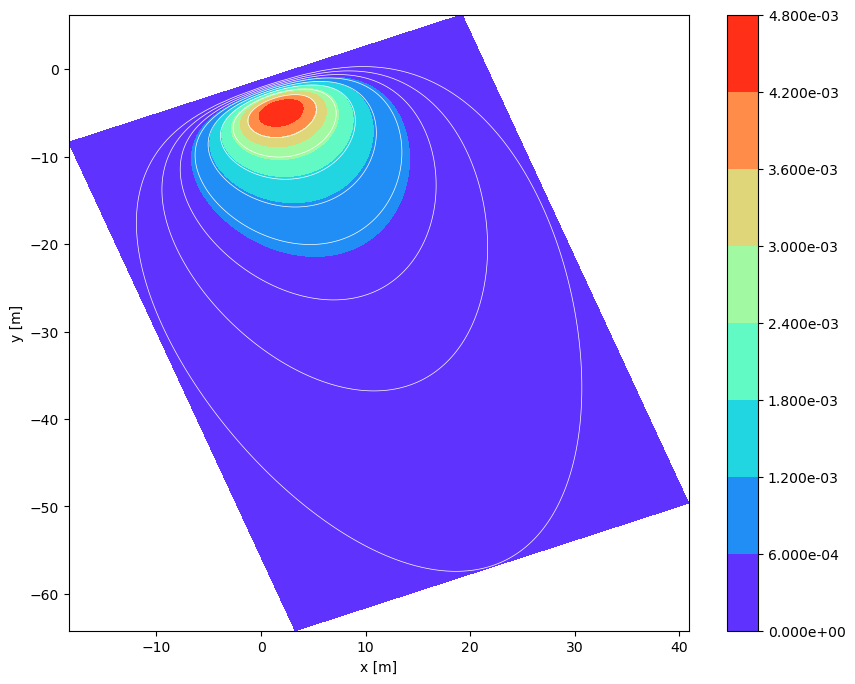

2 4.05577 158.805 1000.0 -108.297 1.540856904452844 0.471133


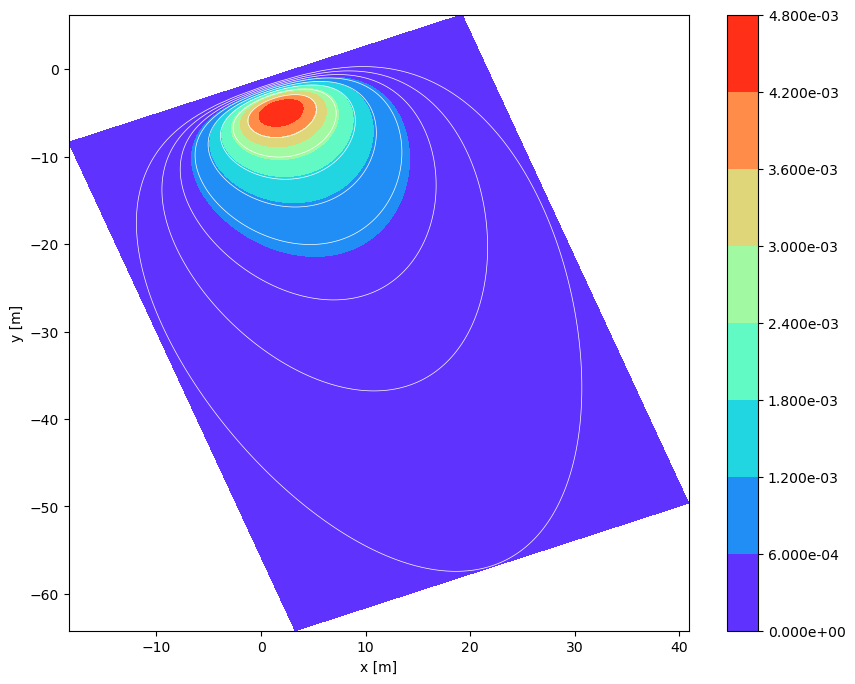

2 3.80897 188.58 1000.0 -197.851 1.2549681270853057 0.419056


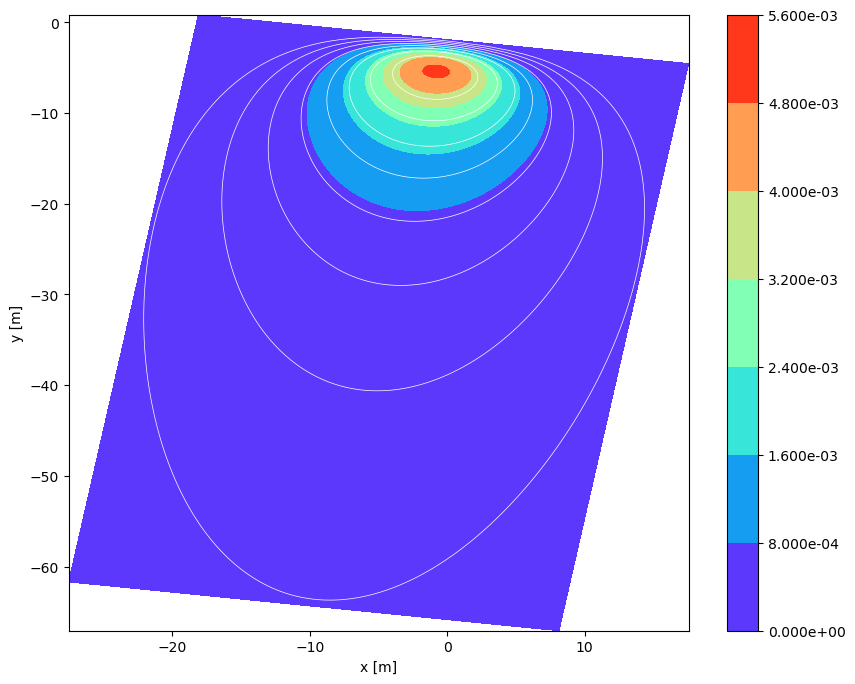

2 3.80897 188.58 1000.0 -197.851 1.2549681270853057 0.419056


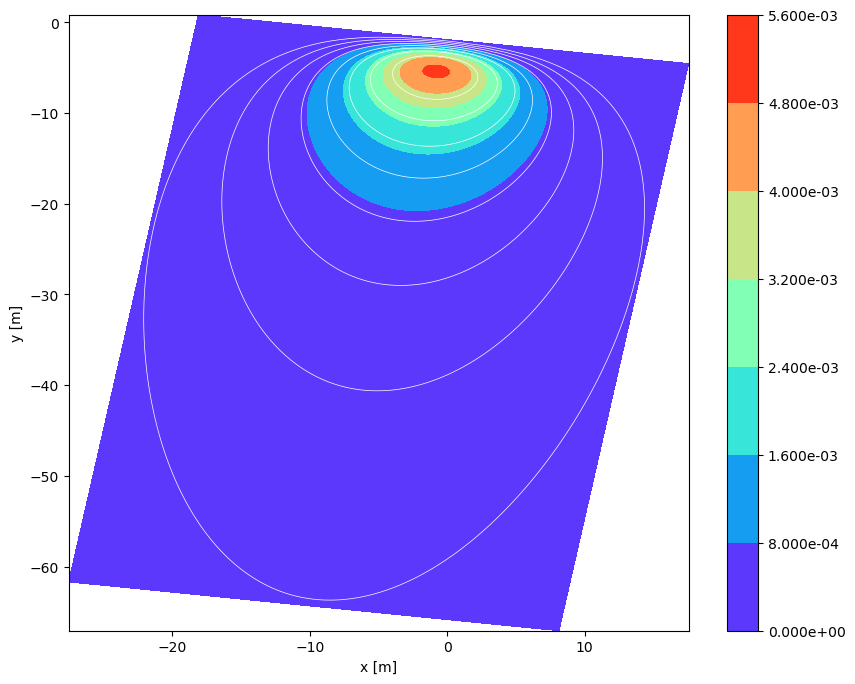

2 3.80897 188.58 1000.0 -197.851 1.2549681270853057 0.419056


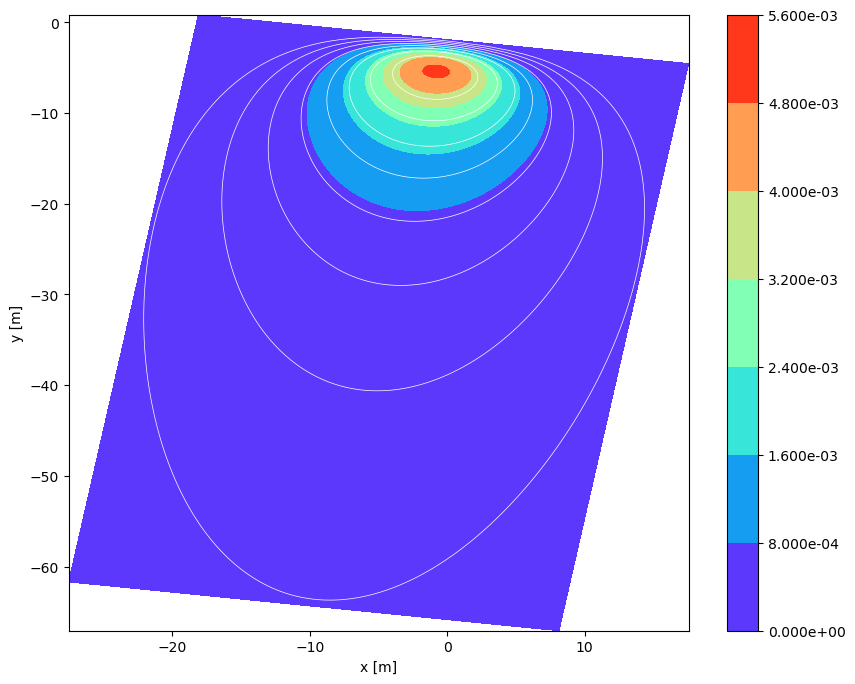

2 3.80897 188.58 1000.0 -197.851 1.2549681270853057 0.419056


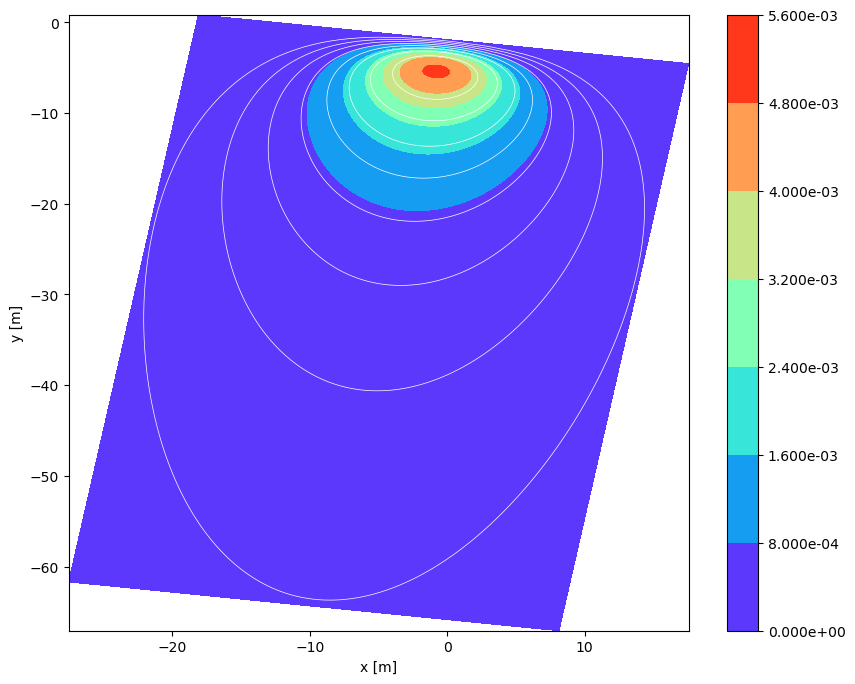

2 2.03892 112.68 244.20273856304874 398.834 0.8103604136432134 0.224389


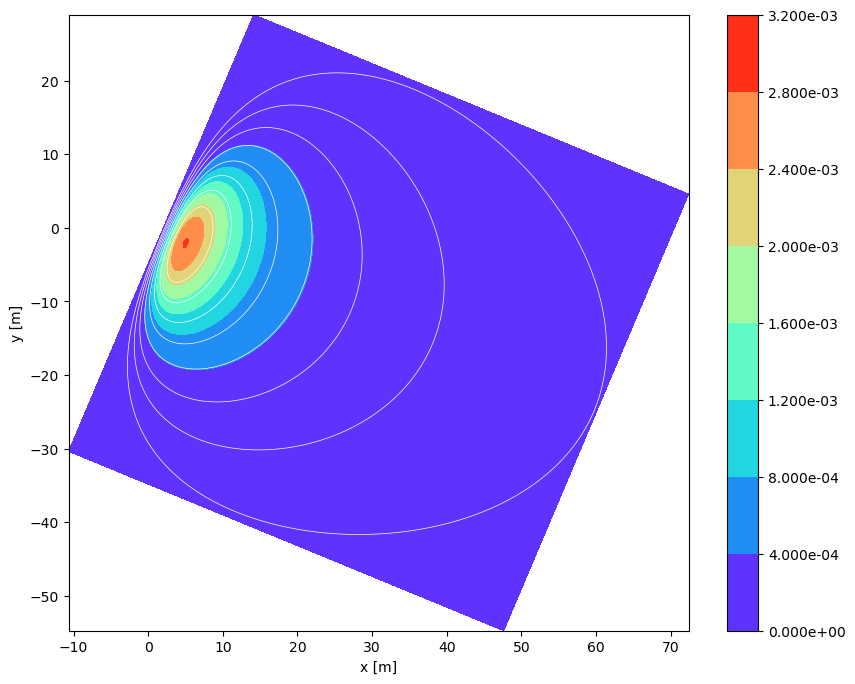

2 2.03892 112.68 244.20273856304874 398.834 0.8103604136432134 0.224389


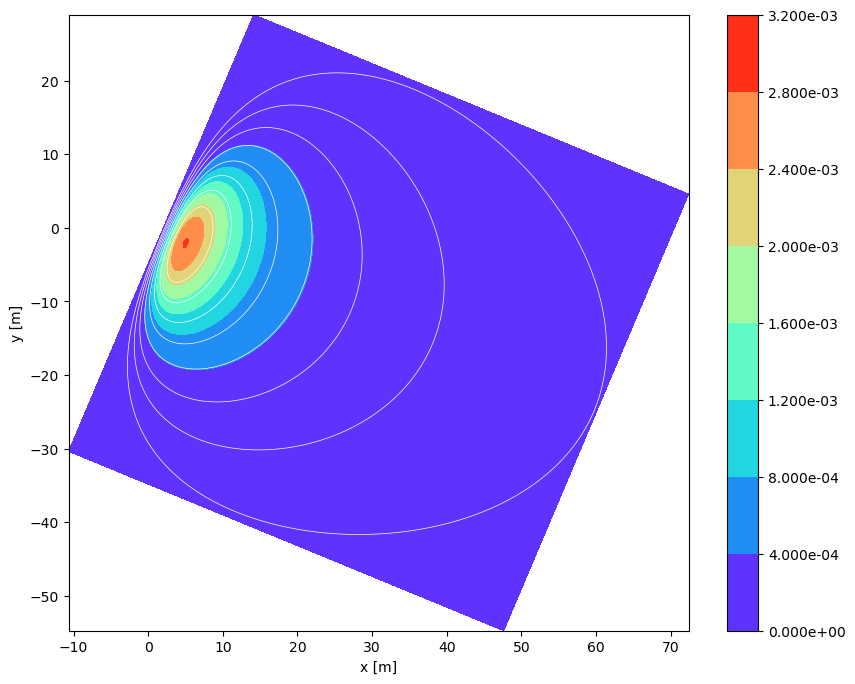

2 2.03892 112.68 244.20273856304874 398.834 0.8103604136432134 0.224389


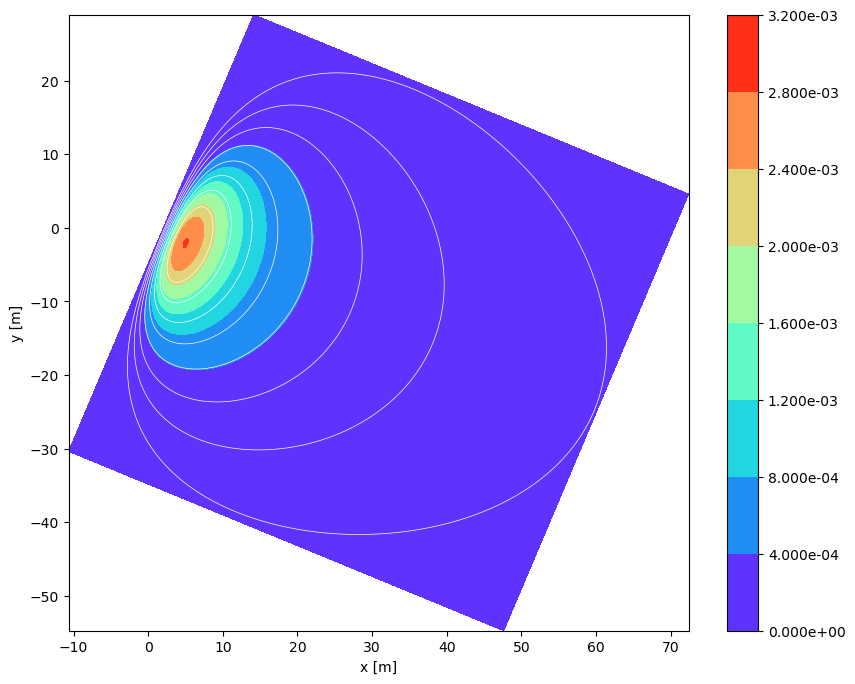

2 2.03892 112.68 244.20273856304874 398.834 0.8103604136432134 0.224389


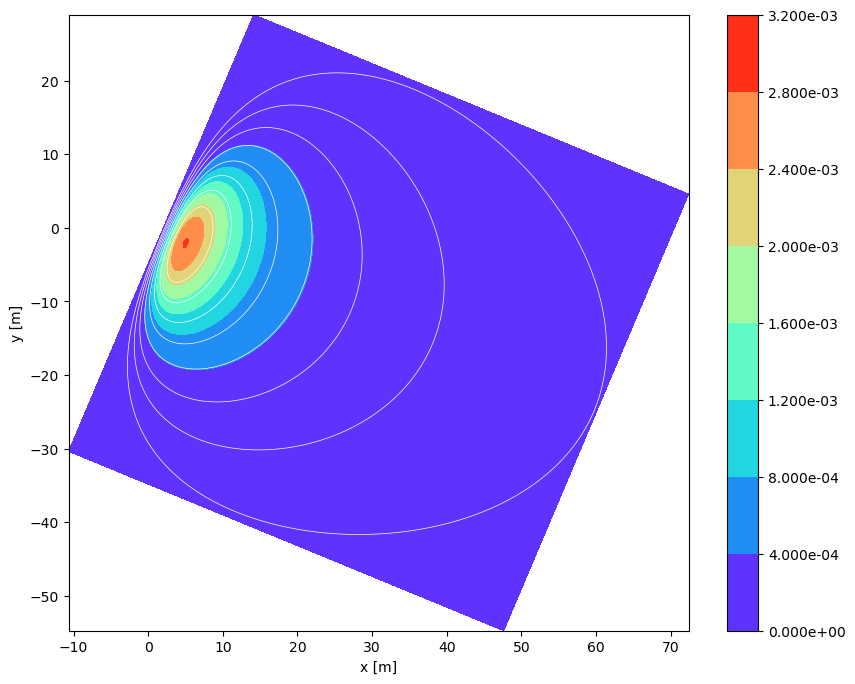

2 2.47025 98.0393 176.88240085198618 133.457 0.9725631084921945 0.264322


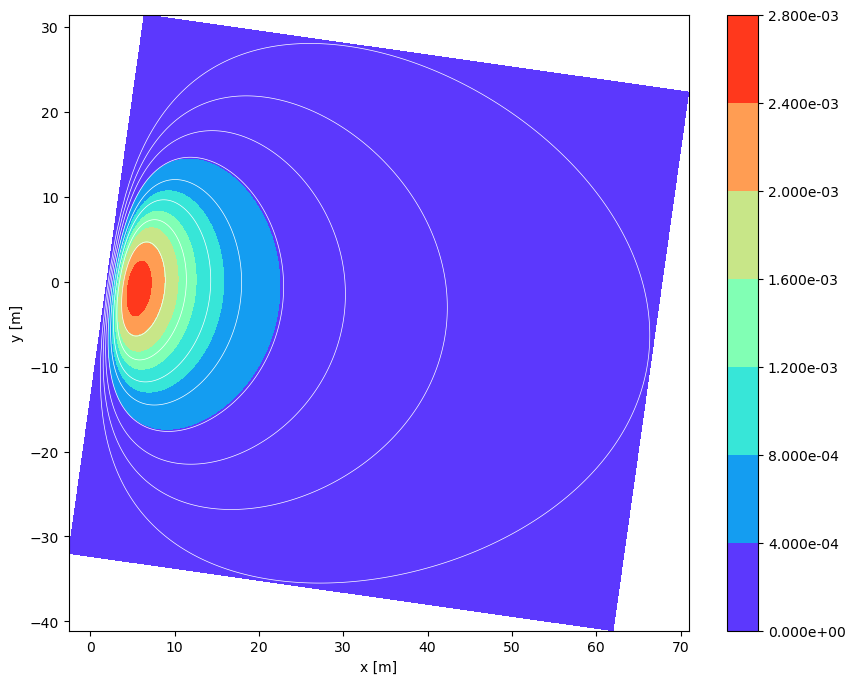

2 2.47025 98.0393 176.88240085198618 133.457 0.9725631084921945 0.264322


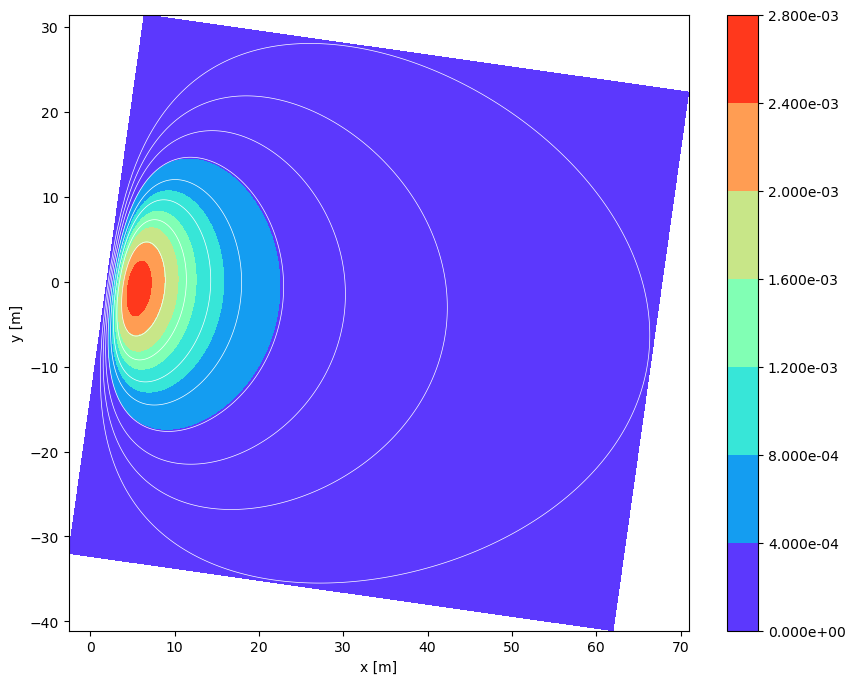

2 3.81636 128.874 359.57532146647355 397.564 1.419972534945659 0.415178


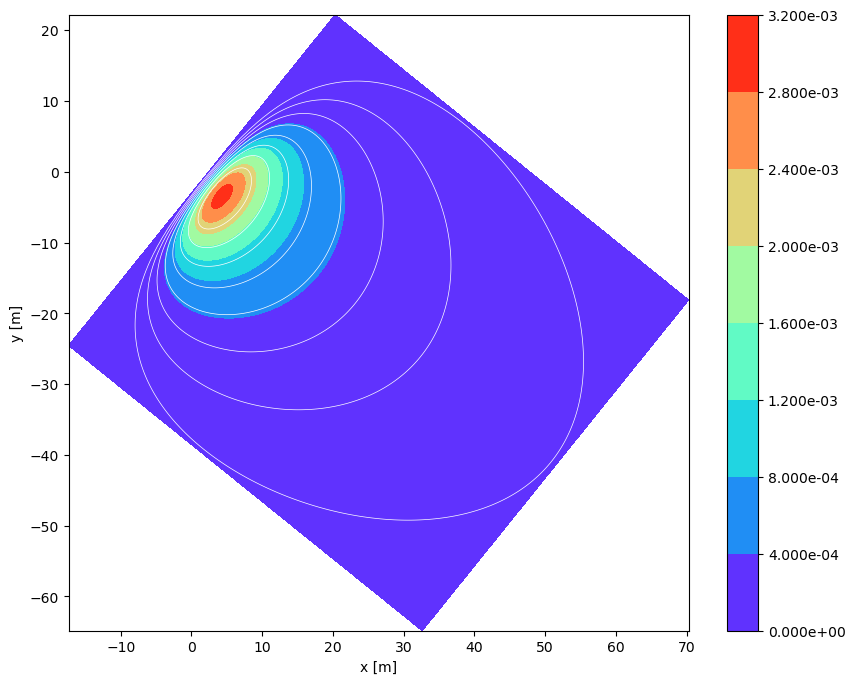

2 3.81636 128.874 359.57532146647355 397.564 1.419972534945659 0.415178


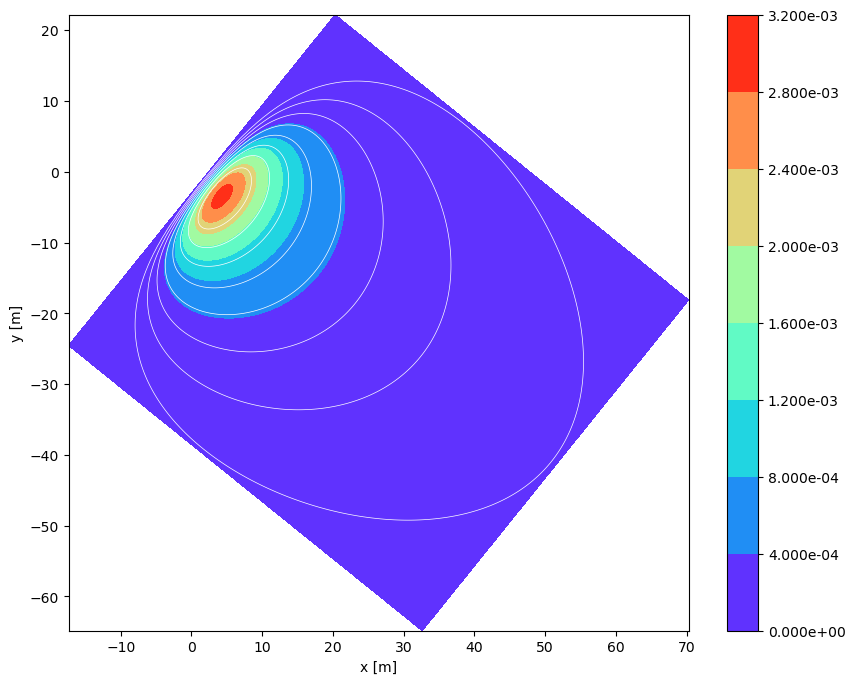

2 3.70541 116.654 1000.0 -65.8726 1.5410094094456401 0.4173


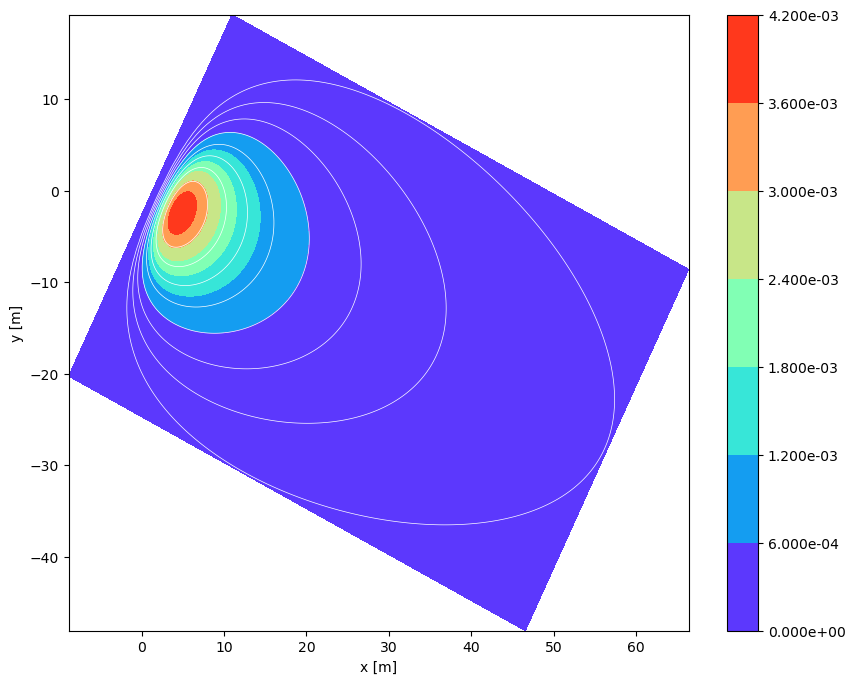

2 3.70541 116.654 1000.0 -65.8726 1.5410094094456401 0.4173


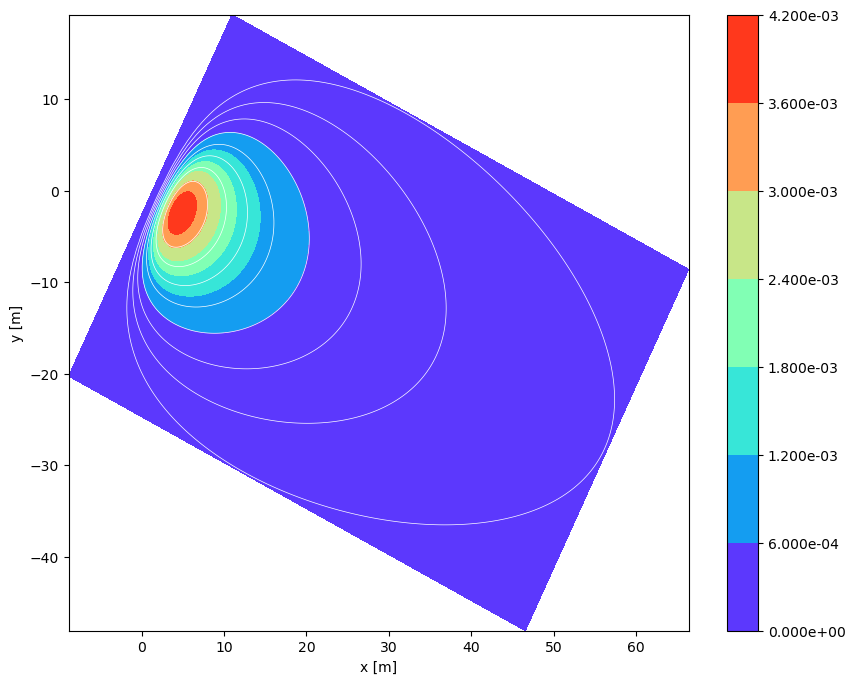

In [144]:
EC['z-d'] = 2 # для мочажины

for zm, umean, wind_dir, h, ol, sigmav, ustar in zip(EC['z-d'], EC['wind_speed'], EC['wind_dir'], EC['h'], EC['L'], EC['sigmav'], EC['u*']):
    print(zm, umean, wind_dir, h, ol, sigmav, ustar)
    footprint = FFP(zm=zm, z0=None, umean=umean, h=h, ol=ol, sigmav=sigmav, ustar=ustar, 
                    wind_dir=wind_dir, dx=1, domain=[-500,500,-500,500], crop=1, fig=1,
                    verbosity=0, show_heatmap=True)

# footprint = FFP_climatology(zm=list(EC['z-d']), 
#                             z0=None, 
#                             umean=list(EC['wind_speed']),
#                             wind_dir=list(EC['wind_dir']), 
#                             h=list(EC['h']), 
#                             ol=list(EC['L']), 
#                             sigmav=list(EC['sigmav']),
#                             ustar=list(EC['u*']), 
#                             dx=1, 
#                             domain=[-500,500,-500,500], 
#                             crop=1, 
#                             fig=1,
#                             verbosity=0,
#                             show_heatmap=False)

In [260]:
footprint['n']

92

In [3]:
# Создание координат полигона
coordinates = [new_point(tower_lat, tower_lon, y, x, xy=True) for y, x in zip(footprint['yr'][7], footprint['xr'][7])]


# Создание полигона с использованием координат
polygon = Polygon(coordinates)

# Создание геопандас GeoDataFrame с полигоном
gdf = gpd.GeoDataFrame(geometry=[polygon])

# Установка системы координат (EPSG:4326 - WGS 84)
gdf.crs = "EPSG:4326"

# Сохранение GeoDataFrame в файле .shp
file_path = f"./footprints/{name}/footprint_{name}.shp"
gdf.to_file(file_path)

NameError: name 'footprint' is not defined

In [4]:
def check_ffp_inputs(ustar, sigmav, h, ol, wind_dir, zm, z0, umean, rslayer, verbosity):
    # Check passed values for physical plausibility and consistency
    if zm <= 0.:
        raise_ffp_exception(2, verbosity)
        return False
    if z0 is not None and umean is None and z0 <= 0.:
        raise_ffp_exception(3, verbosity)
        return False
    if h <= 10.:
        raise_ffp_exception(4, verbosity)
        return False
    if zm > h :
        raise_ffp_exception(5, verbosity)
        return False
    if z0 is not None and umean is None and zm <= 12.5*z0:
        if rslayer == 1:
            raise_ffp_exception(6, verbosity)
        else:
            raise_ffp_exception(20, verbosity)
            return False
    if float(zm)/ol <= -15.5:
        raise_ffp_exception(7, verbosity)
        return False
    if sigmav <= 0:
        raise_ffp_exception(8, verbosity)
        return False
    if ustar <= 0.1:
        raise_ffp_exception(9, verbosity)
        return False
    if wind_dir > 360:
        raise_ffp_exception(10, verbosity)
        return False
    if wind_dir < 0:
        raise_ffp_exception(10, verbosity)
        return False
    return True

#===============================================================================
#===============================================================================
def get_contour_levels(f, dx, dy, rs=None):
    '''Contour levels of f at percentages of f-integral given by rs'''

    import numpy as np
    from numpy import ma
    import sys

    #Check input and resolve to default levels in needed
    if not isinstance(rs, (int, float, list)):
        rs = list(np.linspace(0.10, 0.90, 9))
    if isinstance(rs, (int, float)): rs = [rs]

    #Levels
    pclevs = np.empty(len(rs))
    pclevs[:] = np.nan
    ars = np.empty(len(rs))
    ars[:] = np.nan

    sf = np.sort(f, axis=None)[::-1]
    msf = ma.masked_array(sf, mask=(np.isnan(sf) | np.isinf(sf))) #Masked array for handling potential nan
    csf = msf.cumsum().filled(np.nan)*dx*dy
    for ix, r in enumerate(rs):
        dcsf = np.abs(csf - r)
        pclevs[ix] = sf[np.nanargmin(dcsf)]
        ars[ix] = csf[np.nanargmin(dcsf)]

    return [(round(r, 3), ar, pclev) for r, ar, pclev in zip(rs, ars, pclevs)]

#===============================================================================
def get_contour_vertices(x, y, f, lev):
    # import matplotlib._contour as cntr
    import matplotlib.pyplot as plt

    cs = plt.contour(x,y, f, [lev])
    plt.close()
    segs = cs.allsegs[0][0]
    xr = [vert[0] for vert in segs]
    yr = [vert[1] for vert in segs]
    #Set contour to None if it's found to reach the physical domain
    # print(segs[1])
    if x.min() >= min(segs[:, 0]) or max(segs[:, 0]) >= x.max() or \
       y.min() >= min(segs[:, 1]) or max(segs[:, 1]) >= y.max():
        return [None, None]

    return [xr, yr]   # x,y coords of contour points.	

#===============================================================================
def plot_footprint(x_2d, y_2d, fs, clevs=None, show_heatmap=True, normalize=None, 
                   colormap=None, line_width=0.5, iso_labels=None):
    '''Plot footprint function and contours if request'''

    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    from matplotlib.colors import LogNorm

    #If input is a list of footprints, don't show footprint but only contours,
    #with different colors
    if isinstance(fs, list):
        show_heatmap = False
    else:
        fs = [fs]

    if colormap is None: colormap = cm.jet
    #Define colors for each contour set
    cs = [colormap(ix) for ix in np.linspace(0, 1, len(fs))]

    # Initialize figure
    fig, ax = plt.subplots(figsize=(10, 8))
    # fig.patch.set_facecolor('none')
    # ax.patch.set_facecolor('none')

    if clevs is not None:
        #Temporary patch for pyplot.contour requiring contours to be in ascending orders
        clevs = clevs[::-1]

        #Eliminate contour levels that were set to None
        #(e.g. because they extend beyond the defined domain)
        clevs = [clev for clev in clevs if clev is not None]

        #Plot contour levels of all passed footprints
        #Plot isopleth
        levs = [clev for clev in clevs]
        for f, c in zip(fs, cs):
            cc = [c]*len(levs)
            if show_heatmap:
                cp = ax.contour(x_2d, y_2d, f, levs, colors = 'w', linewidths=line_width)
            else:
                cp = ax.contour(x_2d, y_2d, f, levs, colors = cc, linewidths=line_width)
            #Isopleth Labels
            if iso_labels is not None:
                pers = [str(int(clev[0]*100))+'%' for clev in clevs]
                fmt = {}
                for l,s in zip(cp.levels, pers):
                    fmt[l] = s
                plt.clabel(cp, cp.levels[:], inline=1, fmt=fmt, fontsize=7)

    #plot footprint heatmap if requested and if only one footprint is passed
    if show_heatmap:
        if normalize == 'log':
            norm = LogNorm()
        else:
            norm = None

        xmin = np.nanmin(x_2d)
        xmax = np.nanmax(x_2d)
        ymin = np.nanmin(y_2d)
        ymax = np.nanmax(y_2d)
        for f in fs:
            # im = ax.imshow(f[:, :].T, cmap=colormap, extent=(xmin, xmax, ymin, ymax),
            #      norm=norm, origin='lower', aspect=1)
            im = ax.contourf(x_2d, y_2d, f, cmap='rainbow', extent=(xmin, xmax, ymin, ymax), norm=norm, origin='lower')
            
        plt.xlabel('x [m]')
        plt.ylabel('y [m]')

        #Colorbar
        cbar = fig.colorbar(im, shrink=1.0, format='%.3e')
        #cbar.set_label('Flux contribution', color = 'k')
    plt.show()

    return fig, ax

#===============================================================================
#===============================================================================
exTypes = {'message': 'Message',
           'alert': 'Alert',
           'error': 'Error',
           'fatal': 'Fatal error'}

exceptions = [
    {'code': 1,
     'type': exTypes['fatal'],
     'msg': 'At least one required parameter is missing. Please enter all '
            'required inputs. Check documentation for details.'},
    {'code': 2,
     'type': exTypes['error'],
     'msg': 'zm (measurement height) must be larger than zero.'},
    {'code': 3,
     'type': exTypes['error'],
     'msg': 'z0 (roughness length) must be larger than zero.'},
    {'code': 4,
     'type': exTypes['error'],
     'msg': 'h (BPL height) must be larger than 10 m.'},
    {'code': 5,
     'type': exTypes['error'],
     'msg': 'zm (measurement height) must be smaller than h (PBL height).'},
    {'code': 6,
     'type': exTypes['alert'],
     'msg': 'zm (measurement height) should be above roughness sub-layer (12.5*z0).'},
    {'code': 7,
     'type': exTypes['error'],
     'msg': 'zm/ol (measurement height to Obukhov length ratio) must be equal or larger than -15.5.'},
    {'code': 8,
     'type': exTypes['error'],
     'msg': 'sigmav (standard deviation of crosswind) must be larger than zero.'},
    {'code': 9,
     'type': exTypes['error'],
     'msg': 'ustar (friction velocity) must be >=0.1.'},
    {'code': 10,
     'type': exTypes['error'],
     'msg': 'wind_dir (wind direction) must be >=0 and <=360.'},
    {'code': 11,
     'type': exTypes['fatal'],
     'msg': 'Passed data arrays (ustar, zm, h, ol) don\'t all have the same length.'},
    {'code': 12,
     'type': exTypes['fatal'],
     'msg': 'No valid zm (measurement height above displacement height) passed.'},
    {'code': 13,
     'type': exTypes['alert'],
     'msg': 'Using z0, ignoring umean if passed.'},
    {'code': 14,
     'type': exTypes['alert'],
     'msg': 'No valid z0 passed, using umean.'},
    {'code': 15,
     'type': exTypes['fatal'],
     'msg': 'No valid z0 or umean array passed.'},
    {'code': 16,
     'type': exTypes['error'],
     'msg': 'At least one required input is invalid. Skipping current footprint.'},
    {'code': 17,
     'type': exTypes['alert'],
     'msg': 'Only one value of zm passed. Using it for all footprints.'},
    {'code': 18,
     'type': exTypes['fatal'],
     'msg': 'if provided, rs must be in the form of a number or a list of numbers.'},
    {'code': 19,
     'type': exTypes['alert'],
     'msg': 'rs value(s) larger than 90% were found and eliminated.'},
    {'code': 20,
     'type': exTypes['error'],
     'msg': 'zm (measurement height) must be above roughness sub-layer (12.5*z0).'},
    ]

# climatology
# def raise_ffp_exception(code, verbosity):
#     '''Raise exception or prints message according to specified code'''

#     ex = [it for it in exceptions if it['code'] == code][0]
#     string = ex['type'] + '(' + str(ex['code']).zfill(4) + '):\n '+ ex['msg']

#     if verbosity > 0: print('')

#     if ex['type'] == exTypes['fatal']:
#         if verbosity > 0:
#             string = string + '\n FFP_fixed_domain execution aborted.'
#         else:
#             string = ''
#         raise Exception(string)
#     elif ex['type'] == exTypes['alert']:
#         string = string + '\n Execution continues.'
#         if verbosity > 1: print (string)
#     elif ex['type'] == exTypes['error']:
#         string = string + '\n Execution continues.'
#         if verbosity > 1: print (string)
#     else:
#         if verbosity > 1: print (string)


def raise_ffp_exception(code):
    '''Raise exception or prints message according to specified code'''
	
    ex = [it for it in exceptions if it['code'] == code][0]
    string = ex['type'] + '(' + str(ex['code']).zfill(4) + '):\n '+ ex['msg'] 

    print('')
    if ex['type'] == exTypes['fatal']:
        string = string + '\n FFP_fixed_domain execution aborted.'
        raise Exception(string)
    else:
        print(string)


In [5]:
import numpy as np
import sys
import numbers
import matplotlib
from scipy import signal as sg

def FFP_climatology(zm=None, z0=None, umean=None, h=None, ol=None, sigmav=None, ustar=None,
                    wind_dir=None, domain=None, dx=None, dy=None, nx=None, ny=None, 
                    rs=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8], rslayer=0,
                    smooth_data=1, crop=False, pulse=None, verbosity=2, fig=False, **kwargs):

    #===========================================================================
    # Get kwargs
    show_heatmap = kwargs.get('show_heatmap', True)

    #===========================================================================
    # Input check
    flag_err = 0

    # Convert all input items to lists
    if not isinstance(zm, list): zm = [zm]
    if not isinstance(h, list): h = [h]
    if not isinstance(ol, list): ol = [ol]
    if not isinstance(sigmav, list): sigmav = [sigmav]
    if not isinstance(ustar, list): ustar = [ustar]
    if not isinstance(wind_dir, list): wind_dir = [wind_dir]
    if not isinstance(z0, list): z0 = [z0]
    if not isinstance(umean, list): umean = [umean]

    # Check existence of required input pars
    if None in [zm, h, ol, sigmav, ustar] or (z0 is None and umean is None):
        raise_ffp_exception(1, verbosity)

    # Check that all lists have same length, if not raise an error and exit
    ts_len = len(ustar)
    if any(len(lst) != ts_len for lst in [sigmav, wind_dir, h, ol]):
        # at least one list has a different length, exit with error message
        raise_ffp_exception(11, verbosity)

    # Special treatment for zm, which is allowed to have length 1 for any
    # length >= 1 of all other parameters
    if all(val is None for val in zm): raise_ffp_exception(12, verbosity)
    if len(zm) == 1:
        raise_ffp_exception(17, verbosity)
        zm = [zm[0] for i in range(ts_len)]

    # Resolve ambiguity if both z0 and umean are passed (defaults to using z0)
    # If at least one value of z0 is passed, use z0 (by setting umean to None)
    if not all(val is None for val in z0):
        raise_ffp_exception(13, verbosity)
        umean = [None for i in range(ts_len)]
        # If only one value of z0 was passed, use that value for all footprints
        if len(z0) == 1: z0 = [z0[0] for i in range(ts_len)]
    elif len(umean) == ts_len and not all(val is None for val in umean):
        raise_ffp_exception(14, verbosity)
        z0 = [None for i in range(ts_len)]
    else:
        raise_ffp_exception(15, verbosity)

    # Rename lists as now the function expects time series of inputs
    ustars, sigmavs, hs, ols, wind_dirs, zms, z0s, umeans = \
            ustar, sigmav, h, ol, wind_dir, zm, z0, umean

    #===========================================================================
    # Handle rs
    if rs is not None:

        # Check that rs is a list, otherwise make it a list
        if isinstance(rs, numbers.Number): 
            if 0.9 < rs <= 1 or 90 < rs <= 100: rs = 0.9
            rs = [rs]
        if not isinstance(rs, list): raise_ffp_exception(18, verbosity)

        # If rs is passed as percentages, normalize to fractions of one
        if np.max(rs) >= 1: rs = [x/100. for x in rs]

        # Eliminate any values beyond 0.9 (90%) and inform user
        if np.max(rs) > 0.9:
            raise_ffp_exception(19, verbosity)
            rs = [item for item in rs if item <= 0.9]

        # Sort levels in ascending order
        rs = list(np.sort(rs))

    #===========================================================================
    # Define computational domain
    # Check passed values and make some smart assumptions
    if isinstance(dx, numbers.Number) and dy is None: dy = dx
    if isinstance(dy, numbers.Number) and dx is None: dx = dy
    if not all(isinstance(item, numbers.Number) for item in [dx, dy]): dx = dy = None
    if isinstance(nx, int) and ny is None: ny = nx
    if isinstance(ny, int) and nx is None: nx = ny
    if not all(isinstance(item, int) for item in [nx, ny]): nx = ny = None
    if not isinstance(domain, list) or len(domain) != 4: domain = None

    if all(item is None for item in [dx, nx, domain]):
        # If nothing is passed, default domain is a square of 2 Km size centered
        # at the tower with pizel size of 2 meters (hence a 1000x1000 grid)
        domain = [-1000., 1000., -1000., 1000.]
        dx = dy = 2.
        nx = ny = 1000
    elif domain is not None:
        # If domain is passed, it takes the precendence over anything else
        if dx is not None:
            # If dx/dy is passed, takes precendence over nx/ny
            nx = int((domain[1]-domain[0]) / dx)
            ny = int((domain[3]-domain[2]) / dy)
        else:
            # If dx/dy is not passed, use nx/ny (set to 1000 if not passed)
            if nx is None: nx = ny = 1000
            # If dx/dy is not passed, use nx/ny
            dx = (domain[1]-domain[0]) / float(nx)
            dy = (domain[3]-domain[2]) / float(ny)
    elif dx is not None and nx is not None:
        # If domain is not passed but dx/dy and nx/ny are, define domain
        domain = [-nx*dx/2, nx*dx/2, -ny*dy/2, ny*dy/2]
    elif dx is not None:
        # If domain is not passed but dx/dy is, define domain and nx/ny
        domain = [-1000, 1000, -1000, 1000]
        nx = int((domain[1]-domain[0]) / dx)
        ny = int((domain[3]-domain[2]) / dy)
    elif nx is not None:
        # If domain and dx/dy are not passed but nx/ny is, define domain and dx/dy
        domain = [-1000, 1000, -1000, 1000]
        dx = (domain[1]-domain[0]) / float(nx)
        dy = (domain[3]-domain[2]) / float(nx)

    # Put domain into more convenient vars
    xmin, xmax, ymin, ymax = domain

    # Define rslayer if not passed
    if rslayer == None: rslayer == 0

    # Define smooth_data if not passed
    if smooth_data == None: smooth_data == 1

    # Define crop if not passed
    if crop == None: crop == 0

    # Define pulse if not passed
    if pulse == None:
        if ts_len <= 20:
            pulse = 1
        else:
            pulse = int(ts_len / 20)

    # Define fig if not passed
    if fig == None: fig == 0

    #===========================================================================
    # Model parameters
    a = 1.4524
    b = -1.9914
    c = 1.4622
    d = 0.1359
    ac = 2.17
    bc = 1.66
    cc = 20.0

    oln = 5000 #limit to L for neutral scaling
    k = 0.4 #von Karman

    #===========================================================================
    # Define physical domain in cartesian and polar coordinates
    # Cartesian coordinates
    x = np.linspace(xmin, xmax, nx + 1)
    y = np.linspace(ymin, ymax, ny + 1)
    x_2d, y_2d = np.meshgrid(x, y)

    # Polar coordinates
    # Set theta such that North is pointing upwards and angles increase clockwise
    rho = np.sqrt(x_2d**2 + y_2d**2)
    theta = np.arctan2(x_2d, y_2d)

    # initialize raster for footprint climatology
    fclim_2d = np.zeros(x_2d.shape)

    #===========================================================================
    # Loop on time series

    # Initialize logic array valids to those 'timestamps' for which all inputs are
    # at least present (but not necessarily phisically plausible)
    valids = [True if not any([val is None for val in vals]) else False \
              for vals in zip(ustars, sigmavs, hs, ols, wind_dirs, zms)]

    if verbosity > 1: print ('')
    for ix, (ustar, sigmav, h, ol, wind_dir, zm, z0, umean) \
            in enumerate(zip(ustars, sigmavs, hs, ols, wind_dirs, zms, z0s, umeans)):

        # Counter
        if verbosity > 1 and ix % pulse == 0:
            print ('Calculating footprint ', ix+1, ' of ', ts_len)

        valids[ix] = check_ffp_inputs(ustar, sigmav, h, ol, wind_dir, zm, z0, umean, rslayer, verbosity)

        # If inputs are not valid, skip current footprint
        if not valids[ix]:
            raise_ffp_exception(16, verbosity)
        else:
            #===========================================================================
            # Rotate coordinates into wind direction
            if wind_dir is not None:
                rotated_theta = theta - wind_dir * np.pi / 180.

            #===========================================================================
            # Create real scale crosswind integrated footprint and dummy for
            # rotated scaled footprint
            fstar_ci_dummy = np.zeros(x_2d.shape)
            f_ci_dummy = np.zeros(x_2d.shape)
            xstar_ci_dummy = np.zeros(x_2d.shape)
            px = np.ones(x_2d.shape)
            if z0 is not None:
                # Use z0
                if ol <= 0 or ol >= oln:
                    xx = (1 - 19.0 * zm/ol)**0.25
                    psi_f = (np.log((1 + xx**2) / 2.) + 2. * np.log((1 + xx) / 2.) - 2. * np.arctan(xx) + np.pi/2)
                elif ol > 0 and ol < oln:
                    psi_f = -5.3 * zm / ol
                if (np.log(zm / z0)-psi_f)>0:
                    xstar_ci_dummy = (rho * np.cos(rotated_theta) / zm * (1. - (zm / h)) / (np.log(zm / z0) - psi_f))
                    px = np.where(xstar_ci_dummy > d)
                    fstar_ci_dummy[px] = a * (xstar_ci_dummy[px] - d)**b * np.exp(-c / (xstar_ci_dummy[px] - d))
                    f_ci_dummy[px] = (fstar_ci_dummy[px] / zm * (1. - (zm / h)) / (np.log(zm / z0) - psi_f))
                else:
                    flag_err = 3
                    valids[ix] = 0
            else:
                # Use umean if z0 not available
                xstar_ci_dummy = (rho * np.cos(rotated_theta) / zm * (1. - (zm / h)) / (umean / ustar * k))
                px = np.where(xstar_ci_dummy > d)
                fstar_ci_dummy[px] = a * (xstar_ci_dummy[px] - d)**b * np.exp(-c / (xstar_ci_dummy[px] - d))
                f_ci_dummy[px] = (fstar_ci_dummy[px] / zm * (1. - (zm / h)) / (umean / ustar * k))

            #===========================================================================
            # Calculate dummy for scaled sig_y* and real scale sig_y
            sigystar_dummy = np.zeros(x_2d.shape)
            sigystar_dummy[px] = (ac * np.sqrt(bc * np.abs(xstar_ci_dummy[px])**2 / (1 +
                                  cc * np.abs(xstar_ci_dummy[px]))))

            if abs(ol) > oln:
                ol = -1E6
            if ol <= 0:   #convective
                scale_const = 1E-5 * abs(zm / ol)**(-1) + 0.80
            elif ol > 0:  #stable
                scale_const = 1E-5 * abs(zm / ol)**(-1) + 0.55
            if scale_const > 1:
                scale_const = 1.0

            sigy_dummy = np.zeros(x_2d.shape)
            sigy_dummy[px] = (sigystar_dummy[px] / scale_const * zm * sigmav / ustar)
            sigy_dummy[sigy_dummy < 0] = np.nan

            #===========================================================================
            # Calculate real scale f(x,y)
            f_2d = np.zeros(x_2d.shape)
            f_2d[px] = (f_ci_dummy[px] / (np.sqrt(2 * np.pi) * sigy_dummy[px]) *
                        np.exp(-(rho[px] * np.sin(rotated_theta[px]))**2 / ( 2. * sigy_dummy[px]**2)))

            #===========================================================================
            # Add to footprint climatology raster
            fclim_2d = fclim_2d + f_2d;

    #===========================================================================
    # Continue if at least one valid footprint was calculated
    n = sum(valids)
    vs = None
    clevs = None
    if n==0:
        print ("No footprint calculated")
        flag_err = 1
    else:

        #===========================================================================
        # Normalize and smooth footprint climatology
        fclim_2d = fclim_2d / n;

        if smooth_data is not None:
            skernel  = np.matrix('0.05 0.1 0.05; 0.1 0.4 0.1; 0.05 0.1 0.05')
            fclim_2d = sg.convolve2d(fclim_2d,skernel,mode='same');
            fclim_2d = sg.convolve2d(fclim_2d,skernel,mode='same');


        #===========================================================================
        # Derive footprint ellipsoid incorporating R% of the flux, if requested,
        # starting at peak value.
        if rs is not None:
            clevs = get_contour_levels(fclim_2d, dx, dy, rs)
            frs = [item[2] for item in clevs]
            xrs = []
            yrs = []
            for ix, fr in enumerate(frs):
                xr,yr = get_contour_vertices(x_2d, y_2d, fclim_2d, fr)
                if xr is None:
                    frs[ix]  = None
                    flag_err = 2
                xrs.append(xr)
                yrs.append(yr)
        else:
            if crop:
                rs_dummy = 0.8 #crop to 80%
                clevs = get_contour_levels(fclim_2d, dx, dy, rs_dummy)
                xrs = []
                yrs = []
                xrs,yrs = get_contour_vertices(x_2d, y_2d, fclim_2d, clevs[0][2])

        #===========================================================================
        # Crop domain and footprint to the largest rs value
        if crop:
            xrs_crop = [x for x in xrs if x is not None]
            yrs_crop = [x for x in yrs if x is not None]
            if rs is not None:
                dminx = np.floor(min(xrs_crop[-1]))
                dmaxx = np.ceil(max(xrs_crop[-1]))
                dminy = np.floor(min(yrs_crop[-1]))
                dmaxy = np.ceil(max(yrs_crop[-1]))
            else:
                dminx = np.floor(min(xrs_crop))
                dmaxx = np.ceil(max(xrs_crop))
                dminy = np.floor(min(yrs_crop))
                dmaxy = np.ceil(max(yrs_crop))

            if dminy>=ymin and dmaxy<=ymax:
                jrange = np.where((y_2d[:,0] >= dminy) & (y_2d[:,0] <= dmaxy))[0]
                jrange = np.concatenate(([jrange[0]-1], jrange, [jrange[-1]+1]))
                jrange = jrange[np.where((jrange>=0) & (jrange<=y_2d.shape[0]))[0]]
            else:
                jrange = np.linspace(0, 1, y_2d.shape[0]-1)

            if dminx>=xmin and dmaxx<=xmax:
                irange = np.where((x_2d[0,:] >= dminx) & (x_2d[0,:] <= dmaxx))[0]
                irange = np.concatenate(([irange[0]-1], irange, [irange[-1]+1]))
                irange = irange[np.where((irange>=0) & (irange<=x_2d.shape[1]))[0]]
            else:
                irange = np.linspace(0, 1, x_2d.shape[1]-1)

            jrange = [[it] for it in jrange]
            x_2d = x_2d[jrange,irange]
            y_2d = y_2d[jrange,irange]
            fclim_2d = fclim_2d[jrange,irange]


        #===========================================================================
        # Plot footprint
        if fig:
            fig_out,ax = plot_footprint(x_2d=x_2d, y_2d=y_2d, fs=fclim_2d,
                                        show_heatmap=show_heatmap,clevs=frs)


    #===========================================================================
    # Fill output structure
    if rs is not None:
        return {'x_2d': x_2d, 'y_2d': y_2d, 'fclim_2d': fclim_2d,
                'rs': rs, 'fr': frs, 'xr': xrs, 'yr': yrs, 'n':n, 'flag_err':flag_err}
    else:
        return {'x_2d': x_2d, 'y_2d': y_2d, 'fclim_2d': fclim_2d,
                'n':n, 'flag_err':flag_err}


In [6]:
import numpy as np
import sys
import numbers

def FFP(zm=None, z0=None, umean=None, h=None, ol=None, sigmav=None, ustar=None, 
        wind_dir=None, rs=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8], rslayer=0,
        nx=1000, crop=False, fig=False, **kwargs):

    #===========================================================================
    # Get kwargs
    show_heatmap = kwargs.get('show_heatmap', True)

    #===========================================================================
    ## Input check
    flag_err = 0
        
    ## Check existence of required input pars
    if None in [zm, h, ol, sigmav, ustar] or (z0 is None and umean is None):
        raise_ffp_exception(1)

    # Define rslayer if not passed
    if rslayer == None: rslayer == 0

    # Define crop if not passed
    if crop == None: crop == 0

    # Define fig if not passed
    if fig == None: fig == 0

    # Check passed values
    if zm <= 0.: raise_ffp_exception(2)
    if z0 is not None and umean is None and z0 <= 0.: raise_ffp_exception(3)
    if h <= 10.: raise_ffp_exception(4)
    if zm > h: raise_ffp_exception(5)        
    if z0 is not None and umean is None and zm <= 12.5*z0:
        if rslayer == 1: raise_ffp_exception(6)
        else: raise_ffp_exception(12)
    if float(zm)/ol <= -15.5: raise_ffp_exception(7)
    if sigmav <= 0: raise_ffp_exception(8)
    if ustar <= 0.1: raise_ffp_exception(9)
    if wind_dir is not None:
        if wind_dir> 360 or wind_dir < 0: raise_ffp_exception(10)
    if nx < 600: raise_ffp_exception(11)

    # Resolve ambiguity if both z0 and umean are passed (defaults to using z0)
    if None not in [z0, umean]: raise_ffp_exception(13)

    #===========================================================================
    # Handle rs
    if rs is not None:

        # Check that rs is a list, otherwise make it a list
        if isinstance(rs, numbers.Number): 
            if 0.9 < rs <= 1 or 90 < rs <= 100: rs = 0.9
            rs = [rs]
        if not isinstance(rs, list): raise_ffp_exception(14)

        # If rs is passed as percentages, normalize to fractions of one
        if np.max(rs) >= 1: rs = [x/100. for x in rs]

        # Eliminate any values beyond 0.9 (90%) and inform user
        if np.max(rs) > 0.9:
            raise_ffp_exception(15)
            rs = [item for item in rs if item <= 0.9]

        # Sort levels in ascending order
        rs = list(np.sort(rs))


    #===========================================================================
    # Model parameters
    a = 1.4524
    b = -1.9914
    c = 1.4622
    d = 0.1359
    ac = 2.17 
    bc = 1.66
    cc = 20.0

    xstar_end = 30
    oln = 5000 #limit to L for neutral scaling
    k = 0.4 #von Karman

    #===========================================================================
    # Scaled X* for crosswind integrated footprint
    xstar_ci_param = np.linspace(d, xstar_end, nx+2)
    xstar_ci_param = xstar_ci_param[1:]

    # Crosswind integrated scaled F* 
    fstar_ci_param = a * (xstar_ci_param-d)**b * np.exp(-c/ (xstar_ci_param-d))
    ind_notnan     = ~np.isnan(fstar_ci_param)
    fstar_ci_param = fstar_ci_param[ind_notnan]
    xstar_ci_param = xstar_ci_param[ind_notnan]

    # Scaled sig_y*
    sigystar_param = ac * np.sqrt(bc * xstar_ci_param**2 / (1 + cc * xstar_ci_param))

    #===========================================================================
    # Real scale x and f_ci
    if z0 is not None:
        # Use z0
        if ol <= 0 or ol >= oln:
            xx  = (1 - 19.0 * zm/ol)**0.25
            psi_f = np.log((1 + xx**2) / 2.) + 2. * np.log((1 + xx) / 2.) - 2. * np.arctan(xx) + np.pi/2
        elif ol > 0 and ol < oln:
            psi_f = -5.3 * zm / ol

        x = xstar_ci_param * zm / (1. - (zm / h)) * (np.log(zm / z0) - psi_f)
        if np.log(zm / z0) - psi_f > 0:
            x_ci = x
            f_ci = fstar_ci_param / zm * (1. - (zm / h)) / (np.log(zm / z0) - psi_f)
        else:
            x_ci_max, x_ci, f_ci, x_2d, y_2d, f_2d = None
            flag_err = 1
    else:
        # Use umean if z0 not available
        x = xstar_ci_param * zm / (1. - zm / h) * (umean / ustar * k)
        if umean / ustar > 0:
            x_ci = x
            f_ci = fstar_ci_param / zm * (1. - zm / h) / (umean / ustar * k)
        else:
            x_ci_max, x_ci, f_ci, x_2d, y_2d, f_2d = None
            flag_err = 1
                        
    #Maximum location of influence (peak location)
    xstarmax = -c / b + d
    if z0 is not None:
        x_ci_max = xstarmax * zm / (1. - (zm / h)) * (np.log(zm / z0) - psi_f)
    else:
        x_ci_max = xstarmax * zm / (1. - (zm / h)) * (umean / ustar * k)

    #Real scale sig_y
    if abs(ol) > oln:
        ol = -1E6
    if ol <= 0:   #convective
        scale_const = 1E-5 * abs(zm / ol)**(-1) + 0.80
    elif ol > 0:  #stable
        scale_const = 1E-5 * abs(zm / ol)**(-1) + 0.55
    if scale_const > 1:
        scale_const = 1.0
    sigy = sigystar_param / scale_const * zm * sigmav / ustar
    sigy[sigy < 0] = np.nan

    #Real scale f(x,y)
    dx = x_ci[2] - x_ci[1]
    y_pos = np.arange(0, (len(x_ci) / 2.) * dx * 1.5, dx)
    #f_pos = np.full((len(f_ci), len(y_pos)), np.nan)
    f_pos = np.empty((len(f_ci), len(y_pos)))
    f_pos[:] = np.nan
    for ix in range(len(f_ci)):
        f_pos[ix,:] = f_ci[ix] * 1 / (np.sqrt(2 * np.pi) * sigy[ix]) * np.exp(-y_pos**2 / ( 2 * sigy[ix]**2))

    #Complete footprint for negative y (symmetrical)
    y_neg = - np.fliplr(y_pos[None, :])[0]
    f_neg = np.fliplr(f_pos)
    y = np.concatenate((y_neg[0:-1], y_pos))
    f = np.concatenate((f_neg[:, :-1].T, f_pos.T)).T

    #Matrices for output
    x_2d = np.tile(x[:,None], (1,len(y)))
    y_2d = np.tile(y.T,(len(x),1))
    f_2d = f
        

    #===========================================================================
    # Derive footprint ellipsoid incorporating R% of the flux, if requested,
    # starting at peak value.
    dy = dx
    if rs is not None:
        clevs = get_contour_levels(f_2d, dx, dy, rs)
        frs = [item[2] for item in clevs]
        xrs = []
        yrs = []
        for ix, fr in enumerate(frs):
            xr,yr = get_contour_vertices(x_2d, y_2d, f_2d, fr)
            if xr is None:
                frs[ix] = None
            xrs.append(xr)
            yrs.append(yr)
    else:
        if crop:
            rs_dummy = 0.8 #crop to 80%
            clevs = get_contour_levels(f_2d, dx, dy, rs_dummy)
            xrs = []
            yrs = []
            xrs,yrs = get_contour_vertices(x_2d, y_2d, f_2d, clevs[0][2])
                
    #===========================================================================
    # Crop domain and footprint to the largest rs value
    if crop:
        xrs_crop = [x for x in xrs if x is not None]
        yrs_crop = [x for x in yrs if x is not None]
        if rs is not None:
            dminx = np.floor(min(xrs_crop[-1]))
            dmaxx = np.ceil(max(xrs_crop[-1]))
            dminy = np.floor(min(yrs_crop[-1]))
            dmaxy = np.ceil(max(yrs_crop[-1]))
        else:
            dminx = np.floor(min(xrs_crop))
            dmaxx = np.ceil(max(xrs_crop))
            dminy = np.floor(min(yrs_crop))
            dmaxy = np.ceil(max(yrs_crop))
        jrange = np.where((y_2d[0] >= dminy) & (y_2d[0] <= dmaxy))[0]
        jrange = np.concatenate(([jrange[0]-1], jrange, [jrange[-1]+1]))
        jrange = jrange[np.where((jrange>=0) & (jrange<=y_2d.shape[0]-1))[0]]
        irange = np.where((x_2d[:,0] >= dminx) & (x_2d[:,0] <= dmaxx))[0]
        irange = np.concatenate(([irange[0]-1], irange, [irange[-1]+1]))
        irange = irange[np.where((irange>=0) & (irange<=x_2d.shape[1]-1))[0]]
        jrange = [[it] for it in jrange]
        x_2d = x_2d[irange,jrange]
        y_2d = y_2d[irange,jrange]
        f_2d = f_2d[irange,jrange]

    #===========================================================================
    #Rotate 3d footprint if requested
    if wind_dir is not None:			
        wind_dir = wind_dir * np.pi / 180.
        dist = np.sqrt(x_2d**2 + y_2d**2)
        angle = np.arctan2(y_2d, x_2d)
        x_2d = dist * np.sin(wind_dir - angle)
        y_2d = dist * np.cos(wind_dir - angle)

        if rs is not None:
            for ix, r in enumerate(rs):
                xr_lev = np.array([x for x in xrs[ix] if x is not None])    
                yr_lev = np.array([x for x in yrs[ix] if x is not None])    
                dist = np.sqrt(xr_lev**2 + yr_lev**2)
                angle = np.arctan2(yr_lev,xr_lev)
                xr = dist * np.sin(wind_dir - angle)
                yr = dist * np.cos(wind_dir - angle)
                xrs[ix] = list(xr) 
                yrs[ix] = list(yr) 

    #===========================================================================
    # Plot footprint
    if fig:
        fig_out,ax = plot_footprint(x_2d=x_2d, y_2d=y_2d, fs=f_2d,
                                    show_heatmap=show_heatmap,clevs=frs)
        
    #===========================================================================
    # Fill output structure
    if rs is not None:
        return {'x_ci_max': x_ci_max, 'x_ci': x_ci, 'f_ci': f_ci,
                'x_2d': x_2d, 'y_2d': y_2d, 'f_2d': f_2d,
                'rs': rs, 'fr': frs, 'xr': xrs, 'yr': yrs, 'flag_err':flag_err}
    else:
        return {'x_ci_max': x_ci_max, 'x_ci': x_ci, 'f_ci': f_ci,
                'x_2d': x_2d, 'y_2d': y_2d, 'f_2d': f_2d, 'flag_err':flag_err}
